# Линейная регрессия с регуляризацией

In [1]:
import time

import joblib
import numpy as np
import pandas as pd
import sklearn.linear_model
import sklearn.model_selection
import matplotlib.pyplot as plt

## 1 Предсказания значений на следующий месяц по данным за предыдущий год

In [2]:
time_series = pd.read_csv('time_series.csv').astype('float32')
time_series.head()

,Year,Month,NumCases
0,1980.0,1.0,1825.0
1,1980.0,2.0,1730.0
2,1980.0,3.0,1743.0
3,1980.0,4.0,1760.0
4,1980.0,5.0,1863.0


In [3]:
for i in range(1, 13, 1):
    time_series[f'NumCases_{i}'] = time_series['NumCases'].shift(i)

In [4]:
time_series = time_series[12:]
time_series.head()

,Year,Month,NumCases,NumCases_1,NumCases_2,NumCases_3,NumCases_4,NumCases_5,NumCases_6,NumCases_7,NumCases_8,NumCases_9,NumCases_10,NumCases_11,NumCases_12
12,1981.0,1.0,1987.0,1965.0,1861.0,1935.0,1869.0,2371.0,2179.0,1991.0,1863.0,1760.0,1743.0,1730.0,1825.0
13,1981.0,2.0,1777.0,1987.0,1965.0,1861.0,1935.0,1869.0,2371.0,2179.0,1991.0,1863.0,1760.0,1743.0,1730.0
14,1981.0,3.0,1910.0,1777.0,1987.0,1965.0,1861.0,1935.0,1869.0,2371.0,2179.0,1991.0,1863.0,1760.0,1743.0
15,1981.0,4.0,1771.0,1910.0,1777.0,1987.0,1965.0,1861.0,1935.0,1869.0,2371.0,2179.0,1991.0,1863.0,1760.0
16,1981.0,5.0,1860.0,1771.0,1910.0,1777.0,1987.0,1965.0,1861.0,1935.0,1869.0,2371.0,2179.0,1991.0,1863.0


In [5]:
train = time_series[:-60]
test = time_series[-60:]

In [6]:
X_train = train[train.columns[3:]].to_numpy()
Y_train = train['NumCases'].to_numpy()

In [7]:
elasticNetCV_12months = sklearn.linear_model.ElasticNetCV(
    l1_ratio=[.01, .1, .5, .7, .9, .95, .99, .999, 1],
    n_alphas=1000,
    max_iter=10000,
    cv=sklearn.model_selection.TimeSeriesSplit(n_splits=3),
    verbose=3,
    n_jobs=-1,
    random_state=0
)

elasticNetCV_12months.fit(X_train, Y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953

(array([0.02145248, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.03502921], dtype=float32), -0.7220370173454285, 1801.24169921875, 7)
(array([0.02403613, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.03758533], dtype=float32), 0.8240832090377808, 1801.24169921875, 7)

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,

(array([0.04056252, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.04857072], dtype=float32), 0.7130135893821716, 1801.24169921875, 5)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0.05895092, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.07209595], dtype=float32), 0.44292253255844116, 1801.24169921875, 7)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0

(array([2.2845739e-03, 1.2967573e-03, 1.0660341e-03, 6.8463356e-04,
       6.0270488e-04, 0.0000000e+00, 3.1233282e-04, 8.7317414e-05,
       1.5084111e-04, 2.8205576e-04, 9.5299352e-04, 2.4195998e-03],
      dtype=float32), 0.5054274201393127, 1801.24169921875, 4)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)(array([0.09157627, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.10428118], dtype=float32), 7.266458988189697, 1801.24169921875, 6)
(array([0.09382088, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.10649353], dtype=float32), 7.5881028175354, 1801.24169921875, 6)



(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0.02411673, 0.01269871, 0.01020875, 0.00594384, 0.00509393,
       0.        ,



(array([0.06930673, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.06865648], dtype=float32), -0.14318861067295074, 777.7401733398438, 5)(array([0.14472899, 0.00310374, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.15745145], dtype=float32), 19.25304412841797, 1801.24169921875, 7)
(array([0.14613785, 0.00415641, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.15912396], dtype=float32), 18.5231876373291, 1801.24169921875, 7)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0.10912925, 0.02463921, 0.01425565, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.12281542], dtype=float32), 23.49419593811035, 1801.24169921875, 7)
(ar

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)(array([0.00589173, 0.0045662 , 0.00425255, 0.00374058, 0.0036241 ,
       0.0025783 , 0.0032334 , 0.0029365 , 0.00302585, 0.0032044 ,
       0.00410668, 0.00607048], dtype=float32), -0.6337004899978638, 1801.24169921875, 4)
(array([0.09785576, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.09610771], dtype=float32), 0.30090996623039246, 777.7401733398438, 5)
(array([0.0997081 , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.09788475], dtype=float32), 0.17532634735107422, 777.7401733398438, 5)

(array([0.0397895 , 

(array([0.13878772, 0.00405386, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.1362241 ], dtype=float32), 4.16774320602417, 777.7401733398438, 5)(array([0.03725521, 0.01370593, 0.009974  , 0.00093535, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00699956, 0.03789614], dtype=float32), 0.791107177734375, 777.7401733398438, 4)
(array([0.00790276, 0.00637764, 0.00601421, 0.00542503, 0.00528677,
       0.00408473, 0.00483662, 0.00449836, 0.00460378, 0.00481078,
       0.00585013, 0.00810704], dtype=float32), -0.18079569935798645, 1801.24169921875, 4)
(array([0.04936805, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.04944041], dtype=float32), 0.2465725839138031, 777.7401733398438, 6)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(ar

       0.00707184, 0.00954238], dtype=float32), 0.4498859941959381, 1801.24169921875, 4)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0.0515466 , 0.03384512, 0.02987748, 0.02336167, 0.02177501,
       0.00823976, 0.01708612, 0.01328551, 0.01469852, 0.0168094 ,
       0.02843321, 0.05404629], dtype=float32), 27.853960037231445, 1801.24169921875, 6)

(array([0.03242409, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.05668639], dtype=float32), 0.030121995136141777, 178.45880126953125, 4)
(array([0.00943231, 0.00774971, 0.00734667, 0.00669659, 0.00654056,
       0.00521545, 0.00604346, 0.00567302, 0.00579148, 0.00602113,
       0.00716876, 0.00965654], dtype=float32), 1.249651551246643, 1801.24169921875, 4)
(array([0.04528628, 0.0194835 , 0.01547313, 0.00568916, 0.00243365,
       0.        , 0.        , 0.        , 0.        , 0.        ,


(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)(array([0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.0004508],
      dtype=float32), 0.07469405233860016, 178.45880126953125, 2)
(array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.00052214], dtype=float32), -0.005236824043095112, 178.45880126953125, 2)
(array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.00059394], dtype=float32), -0.031494852155447006, 178.45880126953125, 2)
(array([0.11610248, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.11266586], dtype=float32), 1.5415409803390503, 777.7401733398438, 5)
(ar


(array([0.18060298, 0.05900953, 0.0516989 , 0.01500422, 0.01075882,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.02895172, 0.20514716], dtype=float32), 144.41282653808594, 1801.24169921875, 9)(array([0.07234549, 0.04807758, 0.04266794, 0.03388254, 0.03155444,
       0.01323243, 0.02533939, 0.02029331, 0.02240801, 0.02521574,
       0.04098946, 0.07574484], dtype=float32), 84.682861328125, 1801.24169921875, 6)
(array([0.16256608, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.15639344], dtype=float32), 2.540992259979248, 777.7401733398438, 5)

(array([0.20013215, 0.03417512, 0.03795502, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.20893553], dtype=float32), 11.451783180236816, 777.7401733398438, 6)(array([0.0096524 , 0.00646358, 0.00584839, 0.00458647, 0.00412425,
       0.00169205, 0.00318659, 0.00300

       0.01425727, 0.01813999], dtype=float32), 0.5068323016166687, 1801.24169921875, 4)(array([0.14340568, 0.00871608, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.1232229 ], dtype=float32), 0.21387411653995514, 178.45880126953125, 5)

(array([0.07728833, 0.05120458, 0.04542214, 0.0360251 , 0.03351239,
       0.01388126, 0.02690371, 0.02150152, 0.02380789, 0.02678547,
       0.0436785 , 0.08094474], dtype=float32), 102.07662200927734, 1801.24169921875, 6)


(array([0.0020573 , 0.00022199, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.00304797], dtype=float32), -0.023675311356782913, 178.45880126953125, 3)
(array([0.01240811, 0.00869152, 0.00797054, 0.0064975 , 0.00594749,
       0.00311591, 0.0048546 , 0.00464171, 0.00461325, 0.00500032,
       0.00757386, 0.01244908], dtype=float32), 0.196120947599411, 777.7401733398438, 4)
(arra

(array([0.16983388, 0.03308356, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.14248988], dtype=float32), 0.26777753233909607, 178.45880126953125, 5)
(array([0.17090379, 0.03406836, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.14326441], dtype=float32), 0.3306707441806793, 178.45880126953125, 5)
(array([0.02138015, 0.01827855, 0.01750876, 0.01631061, 0.01597683,
       0.01354925, 0.0150558 , 0.01440975, 0.01465715, 0.01509639,
       0.01722332, 0.02177885], dtype=float32), 0.7715088129043579, 1801.24169921875, 4)
(array([0.08108618, 0.04211758, 0.03651341, 0.02207411, 0.01739374,
       0.        , 0.00887203, 0.00594618, 0.00538433, 0.00794116,
       0.03267657, 0.08236035], dtype=float32), 22.132585525512695, 777.7401733398438, 5)
(array([0.08090463, 0.05342745, 0.0473669 , 0.03750515, 0.0348573 ,
       0.01422559, 0.02795493,

(array([0.22307277, 0.00723546, 0.01843066, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.21911833], dtype=float32), 27.56189727783203, 777.7401733398438, 6)(array([0.0918761 , 0.05982949, 0.05290719, 0.0415487 , 0.03849913,
       0.01460972, 0.03068381, 0.02406865, 0.02699428, 0.03045846,
       0.05093921, 0.09640227], dtype=float32), 142.88043212890625, 1801.24169921875, 6)

(array([0.18910943, 0.05080596, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.15637703], dtype=float32), 0.3206562101840973, 178.45880126953125, 5)
(array([0.02405587, 0.02058494, 0.01971768, 0.01837724, 0.01799331,
       0.01528048, 0.01696208, 0.0162475 , 0.01653106, 0.01702587,
       0.01940825, 0.02449886], dtype=float32), -0.011378280818462372, 1801.24169921875, 4)

(array([5.2823252e-03, 2.9425065e-03, 3.4363469e-04, 0.0000000e+00,
       6.2223326e-04, 0.000000

       0.        , 0.23196232], dtype=float32), 28.933351516723633, 777.7401733398438, 6)(array([7.7657653e-03, 5.0025838e-03, 1.9157408e-03, 7.3672191e-04,
       2.2091884e-03, 0.0000000e+00, 1.6173746e-03, 1.4832137e-03,
       7.1880517e-05, 1.1517033e-03, 3.5190592e-03, 9.0768011e-03],
      dtype=float32), 0.026635294780135155, 178.45880126953125, 3)
(array([0.15476623, 0.04790464, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.1388786 ], dtype=float32), 0.1653023660182953, 178.45880126953125, 4)(array([0.09416935, 0.04926918, 0.04308444, 0.02656199, 0.02122647,
       0.        , 0.01184526, 0.00829488, 0.00768587, 0.01045727,
       0.0386168 , 0.09554031], dtype=float32), 33.04985809326172, 777.7401733398438, 5)
(array([0.09697305, 0.06262684, 0.0553003 , 0.04320384, 0.03997647,
       0.01446066, 0.03173038, 0.02462824, 0.02778842, 0.03141098,
       0.0532393 , 0.1018445 ], dtype=float32), 156.77529

       0.01300712, 0.07094074], dtype=float32), 1.890898585319519, 178.45880126953125, 4)(array([0.27574044, 0.05789843, 0.07196195, 0.01289872, 0.00490969,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00565833, 0.32402384], dtype=float32), 169.8356170654297, 1801.24169921875, 7)
(array([0.2761857 , 0.05796153, 0.07214375, 0.01299695, 0.00502021,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00571283, 0.32458138], dtype=float32), 168.9745635986328, 1801.24169921875, 7)
(array([0.10305804, 0.06581893, 0.05801207, 0.04500077, 0.04157351,
       0.01402318, 0.03281203, 0.02508115, 0.02853305, 0.03233181,
       0.0558274 , 0.108371  ], dtype=float32), 164.1938018798828, 1801.24169921875, 6)

(array([0.24484594, 0.01763723, 0.03557906, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.24682139], dtype=float32), 29.99049186706543, 777.7401733398438, 6)
(array([0.0094796

(array([0.11680362, 0.06024798, 0.05322767, 0.03272486, 0.02626248,
       0.        , 0.01555239, 0.01070281, 0.00996841, 0.01294497,
       0.04752123, 0.11854704], dtype=float32), 55.09690475463867, 777.7401733398438, 5)
(array([0.1173902 , 0.06050849, 0.05347078, 0.03285845, 0.02636772,
       0.        , 0.01562686, 0.01073953, 0.01000117, 0.01297929,
       0.04772921, 0.11914756], dtype=float32), 55.733802795410156, 777.7401733398438, 5)
(array([0.01184961, 0.00834528, 0.00440227, 0.00290873, 0.0046764 ,
       0.0005042 , 0.00383705, 0.00364687, 0.0018636 , 0.00323667,
       0.00624069, 0.0132702 ], dtype=float32), -0.03719953075051308, 178.45880126953125, 4)
(array([0.11797716, 0.06076796, 0.05371292, 0.03299083, 0.02647157,
       0.        , 0.0157004 , 0.01077515, 0.01003265, 0.01301221,
       0.04793621, 0.11974855], dtype=float32), 55.17817306518555, 777.7401733398438, 5)
(array([0.28299755, 0.05884886, 0.0748973 , 0.01445776, 0.00666447,
       0.        , 0.        , 

(array([0.27185944, 0.02933003, 0.05669247, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.2813387 ], dtype=float32), 44.92927551269531, 777.7401733398438, 5)
(array([0.13035902, 0.06595311, 0.05859938, 0.03548947, 0.0283865 ,
       0.        , 0.017034  , 0.01125343, 0.0104141 , 0.01337013,
       0.05204041, 0.13248369], dtype=float32), 67.46881866455078, 777.7401733398438, 5)
(array([0.03217838, 0.02398134, 0.02235337, 0.01908407, 0.01773077,
       0.01154179, 0.01534445, 0.01487757, 0.01488544, 0.01578923,
       0.02145872, 0.03213931], dtype=float32), 0.35756638646125793, 777.7401733398438, 4)
(array([0.21690033, 0.09750069, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.18282954], dtype=float32), 0.9333516955375671, 178.45880126953125, 4)
(array([0.21763432, 0.09807207, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0


(array([0.01813084, 0.0134001 , 0.00802326, 0.0060057 , 0.00819005,
       0.00247872, 0.0068908 , 0.00660781, 0.00422534, 0.00608415,
       0.01014036, 0.01959733], dtype=float32), 0.15288732945919037, 178.45880126953125, 4)(array([0.03669897, 0.02729204, 0.02542107, 0.02166822, 0.02008935,
       0.01300339, 0.01736422, 0.01682646, 0.01684923, 0.01789272,
       0.02439158, 0.03662891], dtype=float32), 1.0686448812484741, 777.7401733398438, 4)
(array([0.03693376, 0.02746199, 0.02557805, 0.02179933, 0.02020833,
       0.01307441, 0.01746519, 0.01692359, 0.01694719, 0.01799813,
       0.02454134, 0.03686198], dtype=float32), 1.0678421258926392, 777.7401733398438, 4)
(array([0.2347337 , 0.11128242, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.19484714], dtype=float32), 1.0746561288833618, 178.45880126953125, 4)
(array([0.10118937, 0.06271691, 0.01585011, 0.0029599 , 0.01895037,
       0.        , 0.00765491

(array([0.04544209, 0.03815298, 0.03626341, 0.03346634, 0.03252252,
       0.02689129, 0.03036886, 0.02898427, 0.02967402, 0.03074545,
       0.03576126, 0.04633353], dtype=float32), 20.3869571685791, 1801.24169921875, 4)
(array([0.24608168, 0.11985964, 0.        , 0.        , 0.00067152,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.20232524], dtype=float32), 0.9049555659294128, 178.45880126953125, 4)
(array([0.02082822, 0.01554109, 0.00950753, 0.00725446, 0.00960834,
       0.00319061, 0.00808581, 0.00775811, 0.00510501, 0.0071834 ,
       0.01171511, 0.02226886], dtype=float32), 0.05083471164107323, 178.45880126953125, 4)(array([0.30781886, 0.06013048, 0.08410463, 0.01847813, 0.01068107,
       0.        , 0.0041232 , 0.        , 0.        , 0.        ,
       0.00660033, 0.36362204], dtype=float32), 114.14727020263672, 1801.24169921875, 6)
(array([0.13460597, 0.07981399, 0.06977165, 0.05150086, 0.04741456,
       0.00777231, 0.03612514, 0.0


(array([0.31380406, 0.06001668, 0.08618055, 0.01919454, 0.01124914,
       0.        , 0.00582462, 0.        , 0.        , 0.        ,
       0.00610454, 0.37082973], dtype=float32), 61.60005187988281, 1801.24169921875, 5)
(array([0.14419663, 0.0832361 , 0.0726812 , 0.05266234, 0.04856254,
       0.0047636 , 0.0366137 , 0.02301124, 0.02876494, 0.03308505,
       0.06911159, 0.15335119], dtype=float32), 258.4118957519531, 1801.24169921875, 6)

(array([0.13032135, 0.08161423, 0.02113203, 0.00673236, 0.02465389,
       0.        , 0.01007168, 0.0053512 , 0.        , 0.        ,
       0.02490279, 0.12216116], dtype=float32), 2.970691442489624, 178.45880126953125, 5)
(array([0.04648357, 0.03420199, 0.03176372, 0.02686831, 0.0247521 ,
       0.01555039, 0.02124389, 0.02053154, 0.0205923 , 0.02196113,
       0.03041524, 0.04633484], dtype=float32), 3.9502956867218018, 777.7401733398438, 4)
(array([0.04675157, 0.0343862 , 0.03193164, 0.02700309, 0.02487127,
       0.01560821, 0.02134073, 0.0

       0.02538516, 0.13430977], dtype=float32), 4.017819404602051, 178.45880126953125, 5)(array([ 0.2621969 ,  0.13135298,  0.        ,  0.        ,  0.00591088,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.2125488 ], dtype=float32), 0.66059410572052, 178.45880126953125, 4)
(array([0.05548983, 0.0402408 , 0.03723657, 0.0311735 , 0.02850994,
       0.01714603, 0.02422823, 0.02332484, 0.02342446, 0.02511465,
       0.03556186, 0.05525982], dtype=float32), 6.954483509063721, 777.7401733398438, 4)
(array([0.31190988, 0.04377958, 0.08761982, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.33255056], dtype=float32), 20.823171615600586, 777.7401733398438, 4)
(array([0.3009051 , 0.06987944, 0.08653794, 0.02479526, 0.01958055,
       0.        , 0.01161871, 0.        , 0.        , 0.        ,
       0.02499388, 0.35113105], dtype=float32), 122.83004760742188, 1801.24169921875, 5)
(a

(array([0.3083334 , 0.05779602, 0.09391914, 0.01073219, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.01504409, 0.32999027], dtype=float32), 38.225040435791016, 777.7401733398438, 5)

(array([ 0.2936321 ,  0.14534816,  0.        ,  0.        ,  0.00706875,
       -0.        ,  0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.22887897], dtype=float32), 0.22371086478233337, 178.45880126953125, 4)(array([ 0.26896727,  0.13610727,  0.        ,  0.        ,  0.00801127,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.21676576], dtype=float32), 0.7030758857727051, 178.45880126953125, 4)
(array([0.16925064, 0.09015051, 0.07879931, 0.0538361 , 0.04987866,
       0.        , 0.03662252, 0.01807247, 0.02563669, 0.02942623,
       0.07373577, 0.18181904], dtype=float32), 341.59173583984375, 1801.24169921875, 6)

(array([0.17673008, 0.08039326, 0.0735629 , 0.04027871, 0.03147466,
     

(array([0.06768379, 0.0479097 , 0.04408931, 0.03627245, 0.0328055 ,
       0.0181848 , 0.02741605, 0.02619686, 0.02634769, 0.02849133,
       0.04192414, 0.06734254], dtype=float32), 15.182868957519531, 777.7401733398438, 4)(array([ 0.2772859 ,  0.14188589,  0.        ,  0.        ,  0.01051038,
       -0.        ,  0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.22188261], dtype=float32), 0.4508686065673828, 178.45880126953125, 4)
(array([0.18000808, 0.09219328, 0.08081665, 0.05355416, 0.04965539,
       0.        , 0.03607441, 0.01517505, 0.02366915, 0.02697557,
       0.07487394, 0.19445871], dtype=float32), 356.3677673339844, 1801.24169921875, 7)
(array([0.3107896 , 0.068105  , 0.08890232, 0.02453375, 0.01876205,
       0.        , 0.01246562, 0.        , 0.        , 0.        ,
       0.02113471, 0.36370423], dtype=float32), 106.08769226074219, 1801.24169921875, 5)
(array([0.32624716, 0.0593412 , 0.09044816, 0.02053207, 0.01219865,
       0.        , 0.00


(array([0.19666933, 0.08413292, 0.07869639, 0.04039754, 0.03122775,
       0.        , 0.01968937, 0.00703913, 0.00552968, 0.00584529,
       0.06588857, 0.2028577 ], dtype=float32), 165.80738830566406, 777.7401733398438, 5)
(array([0.32956237, 0.05905847, 0.09157961, 0.02085834, 0.0123991 ,
       0.        , 0.01022327, 0.        , 0.        , 0.        ,
       0.0040247 , 0.38992396], dtype=float32), 114.38465118408203, 1801.24169921875, 4)
(array([0.04677129, 0.03527744, 0.02173139, 0.0170079 , 0.0208173 ,
       0.00631036, 0.01653524, 0.01564582, 0.00994561, 0.01440212,
       0.02411105, 0.04673798], dtype=float32), 0.6594243049621582, 178.45880126953125, 4)
(array([0.19724904, 0.08421899, 0.07883646, 0.04038553, 0.03120941,
       0.        , 0.01969805, 0.00696573, 0.00545194, 0.00572025,
       0.06595167, 0.20349018], dtype=float32), 167.94334411621094, 777.7401733398438, 5)
(array([ 0.2803838 ,  0.14401971,  0.        ,  0.        ,  0.01141798,
       -0.        ,  0.   

(array([0.07906725, 0.05453443, 0.04992431, 0.04030024, 0.03604387,
       0.01804765, 0.02958462, 0.02799815, 0.0281865 , 0.03075244,
       0.04725175, 0.07863554], dtype=float32), 25.16208839416504, 777.7401733398438, 4)
(array([0.20474038, 0.08521467, 0.08060841, 0.04015513, 0.03092008,
       0.        , 0.01981249, 0.00597429, 0.00441615, 0.00402801,
       0.06667997, 0.21168932], dtype=float32), 183.1296844482422, 777.7401733398438, 5)
(array([ 0.32202017,  0.05744351,  0.09965614,  0.01195187,  0.        ,
       -0.        ,  0.00193733,  0.        ,  0.        ,  0.        ,
        0.01429619,  0.34500635], dtype=float32), 54.337947845458984, 777.7401733398438, 4)(array([0.20531297, 0.08528187, 0.08074092, 0.04013169, 0.03089423,
       0.        , 0.01982151, 0.00589549, 0.0043348 , 0.003893  ,
       0.06672905, 0.21231785], dtype=float32), 184.9694061279297, 777.7401733398438, 5)
(array([0.20588486, 0.08534778, 0.08087273, 0.04010782, 0.03086772,
       0.        , 0.019

(array([0.2143795 , 0.08617115, 0.08279283, 0.03966273, 0.03042192,
       0.        , 0.01999263, 0.00460277, 0.00301874, 0.0016498 ,
       0.06737304, 0.22231524], dtype=float32), 103.2430648803711, 777.7401733398438, 6)
(array([0.05776028, 0.0432114 , 0.02587314, 0.02006601, 0.02446689,
       0.0058921 , 0.01879254, 0.01760357, 0.01034973, 0.01591562,
       0.02806875, 0.0565429 ], dtype=float32), 1.7250325679779053, 178.45880126953125, 4)
(array([0.0734198 , 0.05806353, 0.05409158, 0.04832539, 0.04619848,
       0.03453319, 0.04183738, 0.03907533, 0.04067566, 0.04286965,
       0.05331269, 0.07528849], dtype=float32), 43.2548713684082, 1801.24169921875, 5)
(array([0.07370392, 0.05824452, 0.05424726, 0.04844412, 0.04630302,
       0.03456152, 0.04191536, 0.03913528, 0.04074719, 0.04295428,
       0.05346517, 0.07558559], dtype=float32), 45.15644454956055, 1801.24169921875, 5)

(array([0.08419628, 0.05735068, 0.05238366, 0.04189514, 0.03727868,
       0.01765922, 0.03033454, 0.028

(array([ 0.32077214,  0.16591793,  0.        ,  0.        ,  0.03656979,
       -0.04820821,  0.02128669,  0.        , -0.00831063, -0.        ,
        0.        ,  0.2418806 ], dtype=float32), 13.696718215942383, 178.45880126953125, 6)
(array([0.2254508 , 0.08678717, 0.0851213 , 0.03889094, 0.02957041,
       0.        , 0.02013058, 0.00275098, 0.00100915, 0.        ,
       0.06751855, 0.23450536], dtype=float32), 168.4917449951172, 777.7401733398438, 5)
(array([ 0.32758856,  0.06411108,  0.09298339,  0.02390875,  0.0169144 ,
       -0.        ,  0.01395348,  0.        ,  0.        ,  0.        ,
        0.01333856,  0.38532358], dtype=float32), 65.97731018066406, 1801.24169921875, 4)
(array([ 0.20821047,  0.1263241 ,  0.02201263,  0.00821391,  0.03161534,
       -0.        ,  0.01145545,  0.0007597 ,  0.        ,  0.        ,
        0.01893975,  0.18036935], dtype=float32), 9.353299140930176, 178.45880126953125, 5)
(array([ 0.33036125,  0.05671406,  0.10297135,  0.01217616,  0.   


(array([ 0.33694854,  0.05829055,  0.09409634,  0.02153363,  0.01277158,
       -0.        ,  0.012255  ,  0.        ,  0.        ,  0.        ,
        0.00268599,  0.39889356], dtype=float32), 179.70860290527344, 1801.24169921875, 3)(array([0.08645022, 0.06590465, 0.06070533, 0.05311029, 0.05030766,
       0.03483505, 0.04466192, 0.04097233, 0.04314861, 0.04596079,
       0.05976557, 0.08899134], dtype=float32), 76.7613525390625, 1801.24169921875, 5)(array([ 0.33334526,  0.05638825,  0.10416032,  0.01221907,  0.        ,
       -0.        ,  0.0049756 ,  0.        ,  0.        ,  0.        ,
        0.01286154,  0.35706133], dtype=float32), 39.029075622558594, 777.7401733398438, 4)


(array([0.0994359 , 0.06510756, 0.05911037, 0.04588553, 0.04021812,
       0.01541932, 0.03185878, 0.02939218, 0.0295939 , 0.03283965,
       0.05541077, 0.0989218 ], dtype=float32), 48.351261138916016, 777.7401733398438, 4)
(array([ 0.33704898,  0.05827851,  0.09413037,  0.02154282,  0.01277556,
      

(array([0.09083914, 0.06833516, 0.06269881, 0.05442964, 0.05139419,
       0.03449788, 0.04529147, 0.04123896, 0.04362806, 0.04665066,
       0.06169653, 0.09364411], dtype=float32), 86.7100601196289, 1801.24169921875, 5)(array([ 0.30730835,  0.16181526,  0.        ,  0.        ,  0.02919098,
       -0.02798763,  0.00970933,  0.        , -0.        , -0.        ,
        0.        ,  0.23663369], dtype=float32), 23.12159538269043, 178.45880126953125, 6)

(array([0.07284641, 0.05374305, 0.03065917, 0.02342102, 0.02869221,
       0.00398738, 0.02101705, 0.01936788, 0.00970191, 0.0168423 ,
       0.03250014, 0.06958657], dtype=float32), 3.916933059692383, 178.45880126953125, 4)(array([ 0.34379682,  0.05064186,  0.10708209,  0.00813457,  0.        ,
       -0.        ,  0.00394995,  0.        ,  0.        ,  0.        ,
        0.00507766,  0.3693868 ], dtype=float32), 31.440813064575195, 777.7401733398438, 4)

(array([ 0.33213803,  0.06282032,  0.0941108 ,  0.02370805,  0.01631824,
      

(array([0.09634187, 0.0712359 , 0.06504191, 0.05588979, 0.05256508,
       0.03378806, 0.04587857, 0.04133168, 0.04399952, 0.0472822 ,
       0.06395322, 0.09950527], dtype=float32), 95.36151123046875, 1801.24169921875, 5)(array([ 0.3123328 ,  0.1644636 ,  0.        ,  0.        ,  0.03476501,
       -0.04055396,  0.01690414,  0.        , -0.00341379, -0.        ,
        0.        ,  0.23843421], dtype=float32), 12.473191261291504, 178.45880126953125, 6)(array([ 0.34335798,  0.05562059,  0.10876454,  0.01379156,  0.00121025,
       -0.01384598,  0.01340114,  0.        ,  0.        , -0.        ,
        0.01351222,  0.36418176], dtype=float32), 73.51406860351562, 777.7401733398438, 7)
(array([ 0.3435772 ,  0.05559659,  0.10887936,  0.01379353,  0.00151284,
       -0.01467152,  0.01375216,  0.        ,  0.        , -0.        ,
        0.01362503,  0.36419696], dtype=float32), 74.99322509765625, 777.7401733398438, 7)
(array([ 0.22942811,  0.13721442,  0.01894311,  0.00705498,  0.031866


(array([ 0.33660296,  0.0614508 ,  0.09523424,  0.02350002,  0.01568853,
       -0.        ,  0.01480086, -0.        ,  0.        ,  0.        ,
        0.00851337,  0.39705402], dtype=float32), 28.530874252319336, 1801.24169921875, 3)(array([ 0.23641592,  0.14071104,  0.01766052,  0.00751994,  0.03337086,
       -0.00554365,  0.01258375,  0.        , -0.        ,  0.        ,
        0.01242542,  0.19997585], dtype=float32), 4.69237756729126, 178.45880126953125, 6)(array([0.10307432, 0.07456892, 0.0676863 , 0.05740273, 0.05373458,
       0.03251787, 0.04632472, 0.04111014, 0.04413516, 0.047724  ,
       0.06647767, 0.1067192 ], dtype=float32), 112.85147094726562, 1801.24169921875, 5)(array([0.12791508, 0.07722285, 0.06964617, 0.05072577, 0.04338953,
       0.00760787, 0.0327048 , 0.02836623, 0.02840472, 0.03221488,
       0.06422415, 0.1275644 ], dtype=float32), 104.08333587646484, 777.7401733398438, 4)(array([ 0.35078147,  0.05142009,  0.11093815,  0.01134953,  0.        ,
       -0

        0.0706188 ,  0.28630298], dtype=float32), 527.6795654296875, 1801.24169921875, 7)(array([ 0.25025758,  0.14743027,  0.01461921,  0.00923499,  0.03768416,
       -0.02114975,  0.01745114,  0.        , -0.        , -0.        ,
        0.01033842,  0.20742312], dtype=float32), 3.8845460414886475, 178.45880126953125, 6)
(array([ 0.341678  ,  0.05767672,  0.09570996,  0.02193666,  0.01294977,
       -0.        ,  0.01355333, -0.        ,  0.        ,  0.        ,
        0.00168217,  0.40469122], dtype=float32), 122.78494262695312, 1801.24169921875, 3)
(array([0.11263857, 0.07891289, 0.07106116, 0.05908541, 0.05496632,
       0.03003934, 0.04652986, 0.04023984, 0.04379858, 0.04778467,
       0.06964807, 0.11704962], dtype=float32), 153.37025451660156, 1801.24169921875, 5)
(array([0.11300372, 0.07906999, 0.07118186, 0.05913974, 0.0550045 ,
       0.02993057, 0.0465292 , 0.0401951 , 0.04377484, 0.04777481,
       0.06976001, 0.11744599], dtype=float32), 152.57635498046875, 1801.24169



(array([ 0.3575091 ,  0.05127933,  0.1148847 ,  0.01197122,  0.0115752 ,
       -0.04684549,  0.0275544 , -0.        , -0.        , -0.        ,
        0.01374649,  0.3704797 ], dtype=float32), 166.73226928710938, 777.7401733398438, 6)
(array([ 0.33680564,  0.17475423, -0.        ,  0.00708699,  0.05717015,
       -0.09617165,  0.05215538,  0.00834623, -0.0407695 , -0.        ,
        0.        ,  0.25024384], dtype=float32), 22.510286331176758, 178.45880126953125, 6)
(array([0.1486879 , 0.08415814, 0.07595301, 0.05246336, 0.04435617,
       0.        , 0.0324538 , 0.0261411 , 0.02590637, 0.02967279,
       0.06901357, 0.14872767], dtype=float32), 132.8848876953125, 777.7401733398438, 4)
(array([ 0.33693564,  0.17484623, -0.        ,  0.0072183 ,  0.05735484,
       -0.09667147,  0.05238682,  0.00860637, -0.04115228, -0.        ,
        0.        ,  0.2503049 ], dtype=float32), 22.684545516967773, 178.45880126953125, 6)(array([ 0.34310657,  0.05747657,  0.09619899,  0.02205337,  0



(array([ 0.35975355,  0.05118325,  0.11619431,  0.01202223,  0.0157726 ,
       -0.05739516,  0.03213727, -0.        , -0.        , -0.        ,
        0.01571339,  0.36977825], dtype=float32), 152.3188018798828, 777.7401733398438, 6)(array([ 0.2690778 ,  0.15665284,  0.00824807,  0.0124569 ,  0.04471957,
       -0.0432423 ,  0.02600872,  0.00265105, -0.0076843 , -0.        ,
        0.00953309,  0.21670078], dtype=float32), 16.48818016052246, 178.45880126953125, 6)
(array([ 0.2695518 ,  0.156907  ,  0.00802521,  0.01256114,  0.04493399,
       -0.04382527,  0.02626162,  0.00285239, -0.00815215, -0.        ,
        0.009591  ,  0.21691477], dtype=float32), 16.363012313842773, 178.45880126953125, 6)
(array([ 0.35615927,  0.0539938 ,  0.11545227,  0.01361977,  0.01897313,
       -0.06182584,  0.03398444, -0.        , -0.        , -0.        ,
        0.02015528,  0.3646316 ], dtype=float32), 251.1588134765625, 777.7401733398438, 5)
(array([ 0.27705508,  0.08294949,  0.09532574,  0.03

(array([ 0.28048518,  0.1627696 ,  0.00247345,  0.01508155,  0.05005396,
       -0.05753748,  0.03227951,  0.0076971 , -0.01913881, -0.        ,
        0.01108088,  0.22157505], dtype=float32), 18.01580238342285, 178.45880126953125, 6)
(array([ 0.2885906 ,  0.08125746,  0.09845944,  0.03084317,  0.02400497,
       -0.0215482 ,  0.02231961,  0.        ,  0.        ,  0.        ,
        0.05426386,  0.30004925], dtype=float32), 227.8121795654297, 777.7401733398438, 5)(array([ 0.34066504,  0.17747302, -0.        ,  0.01099649,  0.06264417,
       -0.11101063,  0.05904932,  0.01605616, -0.05213567, -0.        ,
        0.        ,  0.2520534 ], dtype=float32), 30.924318313598633, 178.45880126953125, 5)



(array([ 0.28901732,  0.08118448,  0.09857686,  0.03079422,  0.02408429,
       -0.02209853,  0.02247734,  0.        ,  0.        ,  0.        ,
        0.05417748,  0.30042142], dtype=float32), 226.88414001464844, 777.7401733398438, 5)
(array([ 0.3307511 ,  0.17325518,  0.        ,  0.


(array([ 0.28359395,  0.08687793,  0.09144599,  0.03777606,  0.03718029,
       -0.00488385,  0.02758852,  0.        ,  0.        ,  0.        ,
        0.05733915,  0.3233068 ], dtype=float32), 642.9327392578125, 1801.24169921875, 7)
(array([ 0.28399268,  0.08679134,  0.09151565,  0.03772552,  0.03725696,
       -0.00545208,  0.02770576,  0.        ,  0.        ,  0.        ,
        0.05720365,  0.3237049 ], dtype=float32), 639.45556640625, 1801.24169921875, 7)(array([ 0.3027307 ,  0.07845172,  0.1024041 ,  0.02903325,  0.02686637,
       -0.0400148 ,  0.02791348,  0.        ,  0.        , -0.        ,
        0.05122784,  0.31208447], dtype=float32), 230.8819580078125, 777.7401733398438, 5)
(array([ 0.303111  ,  0.07836463,  0.10251183,  0.02897941,  0.02694971,
       -0.04051707,  0.02807445,  0.        ,  0.        , -0.        ,
        0.05114131,  0.31239948], dtype=float32), 231.0364227294922, 777.7401733398438, 5)
(array([ 0.343052  ,  0.17971326, -0.        ,  0.01285219, 

(array([0.14661752, 0.09099016, 0.08023216, 0.06166596, 0.05663349,
       0.01656586, 0.04492718, 0.03342857, 0.03908829, 0.04382432,
       0.07761276, 0.15451361], dtype=float32), 379.4742126464844, 1801.24169921875, 6)(array([ 0.28945524,  0.08553944,  0.09246834,  0.03700022,  0.03833771,
       -0.01326651,  0.02939313,  0.        ,  0.        ,  0.        ,
        0.05532393,  0.329115  ], dtype=float32), 806.1452026367188, 1801.24169921875, 6)(array([ 0.34513277,  0.18290836, -0.00513196,  0.01503862,  0.0718715 ,
       -0.12890515,  0.06592304,  0.02685906, -0.06675665, -0.00392556,
        0.00974795,  0.24978279], dtype=float32), 34.70383071899414, 178.45880126953125, 6)
(array([ 0.36623433,  0.05094061,  0.12066848,  0.00951613,  0.02925241,
       -0.08387009,  0.04644541, -0.        , -0.        , -0.0151422 ,
        0.02817461,  0.36929268], dtype=float32), 77.10686492919922, 777.7401733398438, 6)
(array([ 0.3571852 ,  0.05421624,  0.10558493,  0.02260231,  0.04356545

(array([ 0.30561846,  0.17357853,  0.        ,  0.0183907 ,  0.06202427,
       -0.09321617,  0.04772016,  0.01995588, -0.04621883, -0.00070509,
        0.0152592 ,  0.23174563], dtype=float32), 28.514015197753906, 178.45880126953125, 6)
(array([ 0.1627289 ,  0.10930314,  0.04050413,  0.02834008,  0.04248175,
       -0.016185  ,  0.02385642,  0.01849265, -0.        ,  0.00374643,
        0.04150827,  0.1415271 ], dtype=float32), 21.952987670898438, 178.45880126953125, 5)
(array([ 0.36732092,  0.05090154,  0.12145592,  0.00893751,  0.03156912,
       -0.08805506,  0.04890342, -0.        , -0.        , -0.01856935,
        0.03066341,  0.36930093], dtype=float32), 165.7488250732422, 777.7401733398438, 5)
(array([ 0.357056  ,  0.05388463,  0.10399177,  0.02178584,  0.03735829,
       -0.05936303,  0.04293883, -0.00958765, -0.        , -0.        ,
        0.01315843,  0.40211716], dtype=float32), 664.3563232421875, 1801.24169921875, 6)
(array([ 0.3479682 ,  0.18735883, -0.01437725,  0.018

(array([ 0.1715105 ,  0.11426478,  0.03997133,  0.02820219,  0.04385983,
       -0.02098965,  0.02451764,  0.01857995, -0.00182668,  0.00174322,
        0.04149404,  0.14804779], dtype=float32), 40.77173614501953, 178.45880126953125, 5)

(array([ 0.36893988,  0.05082966,  0.12263858,  0.0080477 ,  0.03505959,
       -0.09429232,  0.05257063, -0.        , -0.        , -0.02367778,
        0.03438086,  0.36929423], dtype=float32), 150.85107421875, 777.7401733398438, 5)

(array([ 0.30214497,  0.08217552,  0.09479925,  0.03517191,  0.04122051,
       -0.03159779,  0.03379743, -0.        ,  0.        ,  0.        ,
        0.05069116,  0.34123704], dtype=float32), 774.0543212890625, 1801.24169921875, 6)

(array([ 0.34945643,  0.18969779, -0.01923608,  0.02032939,  0.079766  ,
       -0.14084859,  0.07069275,  0.03525609, -0.07732783, -0.00704064,
        0.01740438,  0.24742876], dtype=float32), 29.67936897277832, 178.45880126953125, 6)(array([ 0.36271596,  0.05127129,  0.10946886,  0.02075

        0.03136607,  0.39862055], dtype=float32), 781.1776123046875, 1801.24169921875, 5)(array([ 0.18093404,  0.11953744,  0.03901302,  0.02807956,  0.04545458,
       -0.02631216,  0.02552266,  0.01904619, -0.00537399,  0.        ,
        0.0415241 ,  0.15493512], dtype=float32), 29.9555606842041, 178.45880126953125, 5)(array([ 0.3077916 ,  0.08046348,  0.09588359,  0.0342796 ,  0.04265731,
       -0.03982922,  0.03598645, -0.        ,  0.        , -0.        ,
        0.04854818,  0.34643036], dtype=float32), 747.7224731445312, 1801.24169921875, 6)

(array([ 0.36273038,  0.05076093,  0.10796309,  0.02084804,  0.0467284 ,
       -0.0756017 ,  0.05669798, -0.02255258, -0.        , -0.00526626,
        0.02114833,  0.40141773], dtype=float32), 722.1964111328125, 1801.24169921875, 6)
(array([ 0.3628664 ,  0.05068941,  0.10806889,  0.02079925,  0.04697191,
       -0.07597413,  0.05703119, -0.0228263 , -0.        , -0.00553751,
        0.02140237,  0.40141252], dtype=float32), 711.134643

        0.04085692,  0.16330917], dtype=float32), 35.00413131713867, 178.45880126953125, 5)
(array([ 0.33354285,  0.06993607,  0.11218984,  0.02212306,  0.03647999,
       -0.08005612,  0.0444584 , -0.        , -0.        , -0.01313028,
        0.04951548,  0.33706757], dtype=float32), 330.47894287109375, 777.7401733398438, 4)(array([ 0.366246  ,  0.04936254,  0.11195994,  0.01954103,  0.05733175,
       -0.0910878 ,  0.07036676, -0.0336488 ,  0.        , -0.01664988,
        0.03362998,  0.39879367], dtype=float32), 868.1522216796875, 1801.24169921875, 4)
(array([ 0.35243723,  0.19435923, -0.02894038,  0.02398318,  0.08518817,
       -0.14906436,  0.07398434,  0.041018  , -0.08460945, -0.00915854,
        0.02266933,  0.2457943 ], dtype=float32), 42.348876953125, 178.45880126953125, 5)(array([ 0.37215653,  0.05010613,  0.1257259 ,  0.00723486,  0.04482489,
       -0.10876855,  0.06541308, -0.00983313, -0.        , -0.03434411,
        0.04571491,  0.36788365], dtype=float32), 227.9529

(array([ 0.20038365,  0.12999278,  0.03573923,  0.02789764,  0.04875756,
       -0.0381355 ,  0.02811353,  0.01993524, -0.01394007,  0.        ,
        0.04037177,  0.16811332], dtype=float32), 38.0792236328125, 178.45880126953125, 5)(array([ 0.34598228,  0.18739341, -0.01413325,  0.01880724,  0.07722327,
       -0.1360237 ,  0.06836382,  0.03289959, -0.07348818, -0.00668728,
        0.01600137,  0.24731275], dtype=float32), 29.738994598388672, 178.45880126953125, 6)(array([ 0.32116473,  0.07546292,  0.09900387,  0.03228134,  0.0468943 ,
       -0.05821369,  0.04346741, -0.0052954 ,  0.        , -0.        ,
        0.04447681,  0.35807788], dtype=float32), 725.88623046875, 1801.24169921875, 6)(array([ 0.35395533,  0.19672982, -0.0338781 ,  0.02584396,  0.08794463,
       -0.15324488,  0.07565727,  0.04394514, -0.08831609, -0.01022912,
        0.02535059,  0.24495877], dtype=float32), 75.51634979248047, 178.45880126953125, 4)
(array([ 0.3399286 ,  0.06780689,  0.11455569,  0.01986111,

(array([ 0.3460748 ,  0.06528796,  0.11699814,  0.01779548,  0.04239411,
       -0.09542102,  0.05406311, -0.00275519, -0.        , -0.02531752,
        0.05262295,  0.34660858], dtype=float32), 353.3581848144531, 777.7401733398438, 4)
(array([ 0.376491  ,  0.04812215,  0.12855086,  0.00578264,  0.05136865,
       -0.11912756,  0.07492033, -0.01727806, -0.        , -0.04180093,
        0.05243889,  0.36868548], dtype=float32), 266.8639831542969, 777.7401733398438, 3)
(array([ 0.19045602,  0.09926774,  0.08744936,  0.05932388,  0.05511001,
       -0.        ,  0.04117167,  0.01946888,  0.02860955,  0.03193842,
        0.08157282,  0.20494662], dtype=float32), 580.0863647460938, 1801.24169921875, 7)(array([ 0.36872745,  0.04759912,  0.11265111,  0.01867344,  0.05742536,
       -0.09198977,  0.07133885, -0.0345892 ,  0.        , -0.0171391 ,
        0.03235089,  0.40111792], dtype=float32), 860.2070922851562, 1801.24169921875, 4)
(array([ 0.34809533,  0.19034791, -0.0203075 ,  0.02108659,

(array([ 0.37742698,  0.04768542,  0.12916149,  0.00545803,  0.05278654,
       -0.1213574 ,  0.07697166, -0.01887494, -0.        , -0.04340402,
        0.05388839,  0.36884528], dtype=float32), 245.50448608398438, 777.7401733398438, 3)
(array([ 0.35660625,  0.20091087, -0.04256779,  0.02909546,  0.09281082,
       -0.16059577,  0.07858413,  0.04912074, -0.09482912, -0.01210974,
        0.030069  ,  0.24347048], dtype=float32), 64.05889892578125, 178.45880126953125, 4)
(array([ 0.27357426,  0.09167651,  0.10125846,  0.04164398,  0.04410053,
       -0.06045822,  0.04033442,  0.00230528,  0.00061572, -0.00044927,
        0.07319177,  0.2777287 ], dtype=float32), 397.2827453613281, 777.7401733398438, 7)
(array([ 3.28348279e-01,  7.20423386e-02,  1.01153806e-01,  3.13457772e-02,
        4.98010851e-02, -6.69192374e-02,  4.95328344e-02, -1.29845869e-02,
        0.00000000e+00, -3.13743716e-04,  4.35012281e-02,  3.63842249e-01],
      dtype=float32), 1111.5872802734375, 1801.24169921875, 6)


(array([ 0.35365045,  0.06167631,  0.12015336,  0.01527443,  0.04639239,
       -0.10401937,  0.06143721, -0.00842588, -0.        , -0.03157615,
        0.0549903 ,  0.3518345 ], dtype=float32), 317.1848449707031, 777.7401733398438, 4)
(array([ 0.33177936,  0.07040394,  0.10239472,  0.0305    ,  0.0516102 ,
       -0.07087101,  0.05273667, -0.0161035 ,  0.        , -0.00324215,
        0.04422052,  0.3666985 ], dtype=float32), 912.9302978515625, 1801.24169921875, 6)

(array([ 0.35811105,  0.20327573, -0.0474925 ,  0.03094329,  0.09556241,
       -0.16476132,  0.08024462,  0.05204518, -0.09852217, -0.01316631,
        0.0327449 ,  0.24262464], dtype=float32), 90.04776763916016, 178.45880126953125, 3)
(array([ 0.37841707,  0.04722099,  0.12980741,  0.00511175,  0.05428595,
       -0.12371267,  0.07913973, -0.02056107, -0.        , -0.04509662,
        0.05542138,  0.3690102 ], dtype=float32), 225.86334228515625, 777.7401733398438, 3)(array([ 0.3730898 ,  0.04556643,  0.11678895,  0.01705



(array([ 0.33973792,  0.19448285, -0.02805462,  0.02665128,  0.0864711 ,
       -0.14498627,  0.07022464,  0.04469496, -0.08377293, -0.01431993,
        0.03092351,  0.24001063], dtype=float32), 93.61878967285156, 178.45880126953125, 4)
(array([ 0.3778598 ,  0.04717497,  0.1289992 ,  0.00514008,  0.05123889,
       -0.11940659,  0.07521331, -0.01735174, -0.        , -0.04192912,
        0.05170032,  0.36980683], dtype=float32), 259.5561828613281, 777.7401733398438, 3)
(array([ 0.37968823,  0.04663086,  0.13063563,  0.00467921,  0.05619869,
       -0.12674229,  0.08192399, -0.02274071, -0.        , -0.04726465,
        0.05739949,  0.369226  ], dtype=float32), 400.9938659667969, 777.7401733398438, 2)
(array([ 0.37791228,  0.04715242,  0.12903717,  0.00512217,  0.05133411,
       -0.11955255,  0.07534736, -0.01745717, -0.        , -0.04203443,
        0.05180199,  0.36980933], dtype=float32), 259.34417724609375, 777.7401733398438, 3)

(array([ 0.3742723 ,  0.04465525,  0.11793895,  0.0

        0.04734288,  0.39914644], dtype=float32), 955.906494140625, 1801.24169921875, 3)(array([ 0.3429367 ,  0.06471849,  0.10660322,  0.02749193,  0.05773101,
       -0.083791  ,  0.06348322, -0.02628902,  0.        , -0.01267292,
        0.04678564,  0.3754877 ], dtype=float32), 1006.6258544921875, 1801.24169921875, 5)(array([ 0.38054767,  0.0462215 ,  0.13119587,  0.00437117,  0.05750308,
       -0.1287828 ,  0.08380617, -0.02419824, -0.        , -0.04872908,
        0.05872924,  0.369361  ], dtype=float32), 380.7986755371094, 777.7401733398438, 2)
(array([ 0.24584539,  0.15349978,  0.02177954,  0.02726998,  0.05863332,
       -0.06928723,  0.03754983,  0.02536034, -0.03524631, -0.00539542,
        0.03788654,  0.19687608], dtype=float32), 32.9732551574707, 178.45880126953125, 6)
(array([ 0.34293318,  0.19695216, -0.03319827,  0.02818437,  0.08914448,
       -0.14980115,  0.07241022,  0.04726198, -0.08764854, -0.01497533,
        0.03263146,  0.24006961], dtype=float32), 89.7684020

(array([ 0.36041096,  0.0582458 ,  0.12304901,  0.01286401,  0.05010878,
       -0.11173205,  0.06820718, -0.01352439, -0.        , -0.03711801,
        0.05721818,  0.35621524], dtype=float32), 320.17523193359375, 777.7401733398438, 4)(array([ 0.3066773 ,  0.08366672,  0.10854489,  0.03277321,  0.04689144,
       -0.08392049,  0.04954074, -0.00127669, -0.        , -0.01796309,
        0.07020473,  0.30938116], dtype=float32), 688.0612182617188, 777.7401733398438, 5)(array([ 0.34626168,  0.19954772, -0.03864288,  0.02981785,  0.09197477,
       -0.1548746 ,  0.0747074 ,  0.04998028, -0.09175031, -0.01561292,
        0.03445834,  0.24005243], dtype=float32), 84.74718475341797, 178.45880126953125, 4)
(array([ 0.35736826,  0.20338477, -0.04757657,  0.03114463,  0.09573593,
       -0.164637  ,  0.08004522,  0.05238068, -0.09857392, -0.01358865,
        0.0333528 ,  0.24228868], dtype=float32), 92.47799682617188, 178.45880126953125, 3)
(array([ 0.23881488,  0.09971071,  0.09334697,  0.05310


(array([ 0.35811335,  0.20443128, -0.04977502,  0.03195847,  0.09695181,
       -0.16651472,  0.08081353,  0.05365888, -0.10022496, -0.01402575,
        0.03449216,  0.24194357], dtype=float32), 98.77079010009766, 178.45880126953125, 3)
(array([ 0.3819111 ,  0.04557149,  0.13208634,  0.00388361,  0.05957139,
       -0.13201891,  0.08679003, -0.02651153, -0.        , -0.05104972,
        0.06084098,  0.36956957], dtype=float32), 388.7346496582031, 777.7401733398438, 2)(array([ 0.37510845,  0.04410806,  0.11773312,  0.01616677,  0.06878179,
       -0.10932114,  0.08679431, -0.0474223 ,  0.00068425, -0.02991886,
        0.04417378,  0.400632  ], dtype=float32), 824.8372802734375, 1801.24169921875, 4)
(array([ 0.24702667,  0.09888878,  0.09429726,  0.0517224 ,  0.05516867,
       -0.03214825,  0.04345093,  0.        ,  0.01568836,  0.01116188,
        0.07911451,  0.27073064], dtype=float32), 1032.2498779296875, 1801.24169921875, 8)(array([ 0.26608467,  0.16379319,  0.01239239,  0.0271584

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([ 0.36534488,  0.0556119 ,  0.12520212,  0.01100462,  0.05290127,
       -0.11738933,  0.07325966, -0.01726714, -0.        , -0.04112609,
        0.05892921,  0.3592507 ], dtype=float32), 377.6820068359375, 777.7401733398438, 3)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], 

(array([0.05756548, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.07855286], dtype=float32), 2.2795603275299072, 1801.24169921875, 9)
(array([ 0.38210216,  0.04533216,  0.13201153,  0.00372676,  0.05887093,
       -0.13112168,  0.0859874 , -0.02580589, -0.        , -0.05036573,
        0.05984795,  0.36998448], dtype=float32), 332.8392639160156, 777.7401733398438, 2)
(array([ 0.3821261 ,  0.04532136,  0.13202858,  0.00371881,  0.05891433,
       -0.13118784,  0.08604838, -0.02585372, -0.        , -0.05041322,
        0.05989414,  0.36998507], dtype=float32), 332.15325927734375, 777.7401733398438, 2)
(array([ 0.2586042 ,  0.09741872,  0.09541688,  0.04941094,  0.05562788,
       -0.04067133,  0.04452868, -0.        ,  0.01252983,  0.0060211 ,
        0.07743485,  0.28398684], dtype=float32), 1638.5694580078125, 1801.24169921875, 7)
(array([ 0.36753288,  0.05441299,  0.12617253,  0.0101532 ,  0.0541

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([ 0.38280782,  0.04502537,  0.13251282,  0.00349336,  0.06013875,
       -0.13307129,  0.08777978, -0.02721522, -0.        , -0.05176771,
        0.06120577,  0.3700121 ], dtype=float32), 480.73919677734375, 777.7401733398438, 2)
(array([ 0.36270532,  0.05271904,  0.11546472,  0.02045088,  0.06953804,
       -0.10704939,  0.08362071, -0.04578019,  0.00445597, -0.03048417,
        0.05213023,  0.3883878 ], dtype=float32), 1426.8455810546875, 1801.24169921875, 4)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0., 0., 0., 0., 0.





(array([0.00165266, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.00512714], dtype=float32), 0.07812732458114624, 777.7401733398438, 9)(array([0.04652854, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.07067783], dtype=float32), 2.2311038970947266, 1801.24169921875, 9)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([ 0.37332037,  0.05115156,  0.12877323,  0.00783319,  0.0575772 ,
       -0.12655947,  0.08160228, -0.02334282, -0.        , -0.04755049,
        0.06181204,  0.36383414], dtype=float32), 647.0430908203125, 777.7401733398438, 2)

(array([0.02220971, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.02409583], dtype=float32), 0.41134876012802124, 777.74



(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([ 0.36773682,  0.04905631,  0.11834612,  0.01804233,  0.07272886,
       -0.11308139,  0.08887509, -0.05158443,  0.00814666, -0.03578972,
        0.05367722,  0.39087012], dtype=float32), 1613.8963623046875, 1801.24169921875, 3)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([ 0.3800298 ,  0.03986781,  0.1234547 ,  0.012520

(array([ 0.29226598,  0.08894167,  0.09976906,  0.04275402,  0.05874966,
       -0.06486014,  0.0532047 , -0.01339865,  0.0062476 , -0.00223536,
        0.07018722,  0.32057434], dtype=float32), 1593.9166259765625, 1801.24169921875, 9)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)

(array([ 0.368674  ,  0.04835929,  0.11889579,  0.01757819,  0.07333419,
       -0.11420376,  0.08986224, -0.05267015,  0.00884814, -0.03677933,
        0.05397571,  0.39130473], dtype=float32), 1602.237548828125, 1801.24169921875, 3)(array([0.1027095 , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.09898335], dtype=float32), 0.8801794648170471, 777.7401733398438, 6)
(array([ 0.38048208,  0.03947346,  0.12398227,  0.0121801 ,  0.07741234,
       -0.12294232,  0.098268

       0.        , 0.13490732], dtype=float32), 1.2882062196731567, 777.7401733398438, 6)(array([0.15944885, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.15195994], dtype=float32), 5.693745136260986, 777.7401733398438, 5)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0.1614386 , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.15380782], dtype=float32), 4.946678161621094, 777.7401733398438, 5)
(array([0.20487784, 0.        , 0.        , 0.        , 0.  


(array([0.17412402, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.16516253], dtype=float32), 7.2630228996276855, 777.7401733398438, 5)
(array([ 0.3038948 ,  0.08467421,  0.10198792,  0.03979759,  0.0607006 ,
       -0.07307969,  0.05786849, -0.01937636,  0.00602521, -0.00816932,
        0.06835257,  0.33262888], dtype=float32), 1106.2767333984375, 1801.24169921875, 10)

(array([ 0.38130167,  0.03875772,  0.12494031,  0.01156225,  0.07873359,
       -0.12500346,  0.10000908, -0.06308654,  0.01422038, -0.04548857,
        0.05423841,  0.3987062 ], dtype=float32), 1340.9891357421875, 1801.24169921875, 4)
(array([0.13755374, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.11639173], dtype=float32), 0.2702452838420868, 178.45880126953125, 4)(array([ 0.37232763,  0.04561045,  0.12107623,  0.01573153,  0.07572132,
  

(array([0.1817403 , 0.01704626, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.14317027], dtype=float32), 1.2525990009307861, 178.45880126953125, 5)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0.18279462, 0.01817973, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.14395659], dtype=float32), 1.2701692581176758, 178.45880126953125, 5)

(array([0.00473842, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0

(array([0.03490491, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.03609946], dtype=float32), 0.16762350499629974, 777.7401733398438, 7)
(array([0.2775657 , 0.02292707, 0.04505083, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.31003904], dtype=float32), 61.96714401245117, 1801.24169921875, 8)
(array([0.12304039, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.14502715], dtype=float32), 8.865764617919922, 1801.24169921875, 9)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)(array([0.24917129, 0.        , 0.00254679, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.    

(array([0.28675047, 0.02820704, 0.0537981 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.32345265], dtype=float32), 34.845218658447266, 1801.24169921875, 7)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)


(array([0.09442464, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.09114469], dtype=float32), 1.6558808088302612, 777.7401733398438, 6)
(array([0.09692246, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.09345452], dtype=float32), 2.002187728881836, 777.7401733398438, 6)
(array([0.21722516, 0.05524223, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 

(array([0.15200423, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.14438316], dtype=float32), 1.666737675666809, 777.7401733398438, 6)
(array([0.29488727, 0.03277725, 0.06155436, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.33538628], dtype=float32), 36.374507904052734, 1801.24169921875, 7)
(array([0.29531065, 0.03301336, 0.06195793, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.33600926], dtype=float32), 38.132625579833984, 1801.24169921875, 7)
(array([0.08266564, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.10760371], dtype=float32), 8.465415000915527, 1801.24169921875, 9)
(array([0.28803548, 0.        , 0.03674857, 0.        , 0.        ,
       0.        , 0.        , 0.    

(array([0.01029354, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.0499986 ], dtype=float32), 0.026575755327939987, 178.45880126953125, 5)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)

(array([0.14612803, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.12044095], dtype=float32), 0.27874356508255005, 178.45880126953125, 4)
(array([0.14812298, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.12147965], dtype=float32), 0.2617567777633667, 178.45880126953125, 4)
(array([0.2174083 , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.23359242], dtype=float32), 43.81855392456055, 1801.2416992187

       0.        , 0.27118376], dtype=float32), 45.187416076660156, 1801.24169921875, 7)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0.24431406, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.22969353], dtype=float32), 8.882336616516113, 777.7401733398438, 5)(array([0.18636735, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.1760672 ], dtype=float32), 2.2978336811065674, 777.7401733398438, 6)
(array([0.2987706 , 0.02398922, 0.05577936, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.33503544], dtype=float32), 60.81108856201172, 1801.24169921875, 7)(array([0.2589292, 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.272

(array([0.31553864, 0.01937536, 0.06966784, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.32200524], dtype=float32), 22.59537696838379, 777.7401733398438, 5)
(array([0.2764021 , 0.        , 0.01631014, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.26349708], dtype=float32), 10.051409721374512, 777.7401733398438, 5)
(array([0.2089212 , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.22587572], dtype=float32), 24.156389236450195, 1801.24169921875, 8)

(array([0.2565493 , 0.09768555, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.19873656], dtype=float32), 1.1677660942077637, 178.45880126953125, 5)(array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.

(array([0.30134308, 0.01565404, 0.05895915, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.30443278], dtype=float32), 29.39201545715332, 777.7401733398438, 5)
(array([0.26690474, 0.10887319, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.20638433], dtype=float32), 4.207175254821777, 178.45880126953125, 4)
(array([0.22068226, 0.05364954, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.17044057], dtype=float32), 1.5908982753753662, 178.45880126953125, 5)
(array([0.29046685, 0.        , 0.03351183, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.2808797 ], dtype=float32), 9.572724342346191, 777.7401733398438, 5)
(array([0.32314068, 0.02543014, 0.07882614, 0.        , 0.        ,
       0.        , 0.        , 0.

(array([0.30276036, 0.00254475, 0.0487979 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.29732245], dtype=float32), 30.481374740600586, 777.7401733398438, 6)
(array([0.2391044 , 0.07438263, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.18433377], dtype=float32), 1.3935632705688477, 178.45880126953125, 5)

(array([0.10281113, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.09773034], dtype=float32), 0.15703442692756653, 178.45880126953125, 4)
(array([0.3057435 , 0.01866594, 0.0637749 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.3110297 ], dtype=float32), 28.81729507446289, 777.7401733398438, 5)

(array([0.10514028, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.       

       0.        , 0.3135039 ], dtype=float32), 20.6984920501709, 777.7401733398438, 5)(array([0.21766709, 0.045822  , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.1667424 ], dtype=float32), 1.7586886882781982, 178.45880126953125, 5)
(array([0.29924318, 0.        , 0.04300139, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.29137942], dtype=float32), 9.69754695892334, 777.7401733398438, 5)
(array([0.29475293, 0.0096433 , 0.04131457, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.3218276 ], dtype=float32), 15.145606994628906, 1801.24169921875, 8)

(array([0.31280673, 0.01167391, 0.06185917, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.31407052], dtype=float32), 19.748249053955078, 777.7401733398438, 5)
(array([0.3336

(array([0.29759285, 0.00932755, 0.0424789 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.32486472], dtype=float32), 20.66741943359375, 1801.24169921875, 8)


(array([0.33553806, 0.03527706, 0.09379134, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.35384157], dtype=float32), 16.262746810913086, 777.7401733398438, 5)(array([0.32150215, 0.02936151, 0.08106665, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.3347306 ], dtype=float32), 22.788618087768555, 777.7401733398438, 5)
(array([0.32531947, 0.04841911, 0.08573066, 0.01205222, 0.0032784 ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.38198227], dtype=float32), 105.29972076416016, 1801.24169921875, 6)
(array([0.22641796, 0.05601325, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0. 

(array([0.31582844, 0.01317594, 0.06478082, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.31829822], dtype=float32), 18.901193618774414, 777.7401733398438, 5)(array([0.31018168, 0.02329572, 0.0610049 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.34793434], dtype=float32), 82.060791015625, 1801.24169921875, 7)(array([0.2413872 , 0.07344873, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.1848807 ], dtype=float32), 1.806634545326233, 178.45880126953125, 5)

(array([0.32774672, 0.04945982, 0.08724241, 0.0134021 , 0.00474837,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.38579753], dtype=float32), 97.09561920166016, 1801.24169921875, 6)
(array([3.2789823e-01, 4.9511358e-02, 8.7327525e-02, 1.3476083e-02,
       4.8325351e-03, 0.0000000e+00, 6.

(array([0.31168556, 0.02245015, 0.06108541, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.3491902 ], dtype=float32), 87.53875732421875, 1801.24169921875, 7)
(array([0.32799134, 0.04465983, 0.08521239, 0.00940506, 0.00055589,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.38266054], dtype=float32), 132.22718811035156, 1801.24169921875, 6)(array([0.34132144, 0.03986796, 0.10077827, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.36306226], dtype=float32), 25.94512939453125, 777.7401733398438, 4)
(array([0.34146258, 0.03997934, 0.10094863, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.36328733], dtype=float32), 25.56134605407715, 777.7401733398438, 4)
(array([0.3292455 , 0.03456317, 0.08958925, 0.        , 0.        ,
       0.        , 0.        , 0.     

(array([ 0.34346256,  0.04156242,  0.10337061,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.36648563], dtype=float32), 23.886831283569336, 777.7401733398438, 4)(array([0.32595322, 0.02261498, 0.07817882, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.33538234], dtype=float32), 17.50041389465332, 777.7401733398438, 5)(array([0.33382818, 0.03763474, 0.09463169, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.3533327 ], dtype=float32), 29.555307388305664, 777.7401733398438, 4)(array([0.25490725, 0.08919934, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.19521782], dtype=float32), 1.571164608001709, 178.45880126953125, 5)

(array([ 0.28833246,  0.12987843,  0.        ,  0.        ,  0.        ,
       -0.        



(array([0.33808407, 0.03456535, 0.09473526, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.3562458 ], dtype=float32), 13.804404258728027, 777.7401733398438, 5)
(array([0.32361996, 0.03354779, 0.07685958, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.36982533], dtype=float32), 72.48604583740234, 1801.24169921875, 7)
(array([3.2565412e-01, 3.6962539e-02, 8.0790177e-02, 2.6373003e-04,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 3.7426853e-01],
      dtype=float32), 80.14501190185547, 1801.24169921875, 7)


(array([0.3238514 , 0.03376223, 0.0771656 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.37022522], dtype=float32), 71.91665649414062, 1801.24169921875, 7)
(array([0.33251247, 0.04752929, 0.08846018, 0.01272348, 0.00

       0.        , 0.1753008 ], dtype=float32), 1.7294023036956787, 178.45880126953125, 5)(array([ 0.3412835 ,  0.04258567,  0.1028683 ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.36463636], dtype=float32), 21.09419059753418, 777.7401733398438, 4)
(array([0.33440313, 0.04840611, 0.08954392, 0.01373343, 0.0051144 ,
       0.        , 0.00142476, 0.        , 0.        , 0.        ,
       0.        , 0.3931009 ], dtype=float32), 165.86776733398438, 1801.24169921875, 5)
(array([ 3.4758058e-01,  4.4865023e-02,  1.0726707e-01,  3.2469609e-03,
        0.0000000e+00, -0.0000000e+00,  2.8083299e-04,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  3.7343115e-01],
      dtype=float32), 27.19600486755371, 777.7401733398438, 4)

(array([ 0.31460258,  0.15997776,  0.        ,  0.        ,  0.0217039 ,
       -0.019115  ,  0.00300955,  0.        , -0.        , -0.        ,
        0.        ,  0.239

(array([ 0.30144528,  0.14453621,  0.        ,  0.        ,  0.00319339,
       -0.        ,  0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.23119849], dtype=float32), 0.0006722061662003398, 178.45880126953125, 4)
(array([0.34265998, 0.03871537, 0.10068198, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.36387244], dtype=float32), 28.989686965942383, 777.7401733398438, 4)
(array([0.32990342, 0.03961552, 0.08386759, 0.00442185, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.38144222], dtype=float32), 164.82102966308594, 1801.24169921875, 6)(array([ 0.31872568,  0.16249625,  0.        ,  0.        ,  0.0277712 ,
       -0.0328251 ,  0.00969224,  0.        , -0.        , -0.        ,
        0.        ,  0.24022584], dtype=float32), 29.877647399902344, 178.45880126953125, 6)
(array([ 0.31898552,  0.16265489,  0.        ,  0.        ,  0.02815524,


       0.        , 0.3577948 ], dtype=float32), 12.84591293334961, 777.7401733398438, 5)(array([ 0.34439278,  0.0446726 ,  0.10555364,  0.00238233,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.36966395], dtype=float32), 19.985240936279297, 777.7401733398438, 4)
(array([ 0.30538702,  0.14884758,  0.        ,  0.        ,  0.00597093,
       -0.        ,  0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.23410471], dtype=float32), 0.21953780949115753, 178.45880126953125, 4)(array([0.2518736 , 0.08496595, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.19265991], dtype=float32), 1.5779823064804077, 178.45880126953125, 5)

(array([ 0.32385096,  0.16563825,  0.        ,  0.        ,  0.03529273,
       -0.04795374,  0.02042694,  0.        , -0.00814407, -0.        ,
        0.        ,  0.24280925], dtype=float32), 14.621018409729

(array([ 0.3086604 ,  0.15242855,  0.        ,  0.        ,  0.00827676,
       -0.        ,  0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.23651765], dtype=float32), 0.10644383728504181, 178.45880126953125, 4)(array([ 0.34809327,  0.04374879,  0.10713682,  0.00215872,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.3732849 ], dtype=float32), 23.440160751342773, 777.7401733398438, 4)
(array([ 0.34816968,  0.04382379,  0.10720691,  0.00225777,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.37342778], dtype=float32), 24.30896759033203, 777.7401733398438, 4)

(array([0.33461437, 0.04422996, 0.0879738 , 0.01040289, 0.00177997,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.39074513], dtype=float32), 134.94293212890625, 1801.24169921875, 6)
(array([0.33560544, 0.04605642, 0.08919864, 0.01213036, 0.003610

(array([ 0.347702  ,  0.04641518,  0.10774556,  0.00474092,  0.        ,
       -0.        ,  0.0018914 ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.37422857], dtype=float32), 26.400388717651367, 777.7401733398438, 4)(array([ 0.34420678,  0.03963751,  0.10232706,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.36616954], dtype=float32), 26.677719116210938, 777.7401733398438, 4)(array([0.3412771 , 0.05139597, 0.09334446, 0.01722531, 0.00831926,
       0.        , 0.00721863, 0.        , 0.        , 0.        ,
       0.        , 0.40241873], dtype=float32), 106.66128540039062, 1801.24169921875, 5)
(array([ 0.34951368,  0.04481783,  0.1081702 ,  0.00349704,  0.        ,
       -0.        ,  0.00108733,  0.        ,  0.        ,  0.        ,
        0.        ,  0.37541306], dtype=float32), 24.019922256469727, 777.7401733398438, 4)

(array([0.33844995, 0.04786673, 0.09100835, 0.01404179, 0.00542905

        0.        ,  0.2490591 ], dtype=float32), 27.881296157836914, 178.45880126953125, 5)
(array([ 0.351037  ,  0.04580823,  0.10915563,  0.00467035,  0.        ,
       -0.        ,  0.00275236,  0.        ,  0.        ,  0.        ,
        0.        ,  0.37742302], dtype=float32), 21.627473831176758, 777.7401733398438, 4)
(array([ 0.3440013 ,  0.05395633,  0.09531327,  0.01964495,  0.01052509,
       -0.        ,  0.01089155,  0.        ,  0.        ,  0.        ,
        0.        ,  0.4066758 ], dtype=float32), 142.1486053466797, 1801.24169921875, 4)(array([0.33804062, 0.04701264, 0.09055968, 0.01332155, 0.00477882,
       0.        , 0.00147635, 0.        , 0.        , 0.        ,
       0.        , 0.39671895], dtype=float32), 175.98483276367188, 1801.24169921875, 5)
(array([ 0.28427738,  0.12299287,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.21751066], dtype=float32), 4.141580104827881

        0.        ,  0.25046736], dtype=float32), 24.644628524780273, 178.45880126953125, 6)
(array([ 0.29390404,  0.13429555,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.22489668], dtype=float32), 3.518826484680176, 178.45880126953125, 4)
(array([ 0.35138413,  0.04794783,  0.10987419,  0.00673334,  0.        ,
       -0.00044688,  0.0050266 ,  0.        ,  0.        , -0.        ,
        0.00170729,  0.3777243 ], dtype=float32), 99.58964538574219, 777.7401733398438, 5)(array([ 0.32484016,  0.16582347,  0.        ,  0.        ,  0.03563485,
       -0.04906461,  0.0211339 ,  0.        , -0.00884291, -0.        ,
        0.        ,  0.24320672], dtype=float32), 14.614911079406738, 178.45880126953125, 6)
(array([ 0.30479026,  0.14714155,  0.        ,  0.        ,  0.0045106 ,
       -0.        ,  0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.23327076], dtype=float32), 0.

(array([ 0.3409964 ,  0.1763402 , -0.        ,  0.0087125 ,  0.06034142,
       -0.10546194,  0.05664608,  0.01233589, -0.04754105, -0.        ,
        0.        ,  0.25188434], dtype=float32), 24.359621047973633, 178.45880126953125, 6)(array([ 0.36334297,  0.04902938,  0.11732893,  0.0108742 ,  0.01514619,
       -0.0585515 ,  0.03273161, -0.        , -0.        , -0.        ,
        0.01322562,  0.37329617], dtype=float32), 157.36630249023438, 777.7401733398438, 6)(array([ 0.34511557,  0.0530481 ,  0.09545099,  0.01915553,  0.0100862 ,
       -0.        ,  0.01043334,  0.        ,  0.        ,  0.        ,
        0.        ,  0.40758434], dtype=float32), 142.1570587158203, 1801.24169921875, 4)
(array([0.34073314, 0.04874248, 0.0922323 , 0.01511536, 0.0064141 ,
       0.        , 0.004321  , 0.        , 0.        , 0.        ,
       0.        , 0.4006171 ], dtype=float32), 145.73953247070312, 1801.24169921875, 5)


(array([ 0.30814058,  0.15093766,  0.        ,  0.        ,  0.006

(array([ 0.35190395,  0.04616288,  0.10966071,  0.00514079,  0.        ,
       -0.        ,  0.00349242,  0.        ,  0.        , -0.        ,
        0.        ,  0.37847576], dtype=float32), 19.656631469726562, 777.7401733398438, 4)
(array([0.34225622, 0.04971938, 0.09317809, 0.01612913, 0.00733874,
       0.        , 0.00592969, 0.        , 0.        , 0.        ,
       0.        , 0.40282094], dtype=float32), 127.72504425048828, 1801.24169921875, 5)

(array([ 0.31122732,  0.15456367,  0.        ,  0.        ,  0.0101641 ,
       -0.00167494,  0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.23805706], dtype=float32), 7.0345587730407715, 178.45880126953125, 6)(array([0.34232298, 0.04976318, 0.09321935, 0.01617414, 0.00737952,
       0.        , 0.00600031, 0.        , 0.        , 0.        ,
       0.        , 0.40291825], dtype=float32), 128.36964416503906, 1801.24169921875, 5)
(array([ 0.35196492,  0.04620442,  0.1097004 ,  0.00518929,  0.        ,
    

(array([ 0.36699915,  0.0492684 ,  0.12008176,  0.00953563,  0.02441994,
       -0.0766332 ,  0.04228652, -0.        , -0.        , -0.00914022,
        0.02177773,  0.37198833], dtype=float32), 89.75923919677734, 777.7401733398438, 6)(array([ 0.30748048,  0.1499768 ,  0.        ,  0.        ,  0.00629669,
       -0.        ,  0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.23521167], dtype=float32), 0.1954425722360611, 178.45880126953125, 4)


(array([0.34353408, 0.05053657, 0.0939622 , 0.0169655 , 0.00809974,
       0.        , 0.00725585, 0.        , 0.        , 0.        ,
       0.        , 0.4046258 ], dtype=float32), 212.3640594482422, 1801.24169921875, 4)
(array([ 0.3608455 ,  0.04928509,  0.11592673,  0.01093129,  0.01085508,
       -0.04771191,  0.02799148, -0.        , -0.        , -0.        ,
        0.01133246,  0.37389022], dtype=float32), 170.18121337890625, 777.7401733398438, 6)(array([ 0.34736982,  0.05482536,  0.09696229,  0.02090001,  0.011

        0.01361963,  0.37274256], dtype=float32), 154.3899688720703, 777.7401733398438, 6)(array([ 0.31720692,  0.16072285,  0.        ,  0.        ,  0.0231596 ,
       -0.02344899,  0.00482757,  0.        , -0.        , -0.        ,
        0.        ,  0.24033365], dtype=float32), 14.19204044342041, 178.45880126953125, 7)
(array([ 0.3628836 ,  0.0493776 ,  0.11721526,  0.01106323,  0.01548794,
       -0.05895969,  0.03289251, -0.        , -0.        , -0.        ,
        0.01374671,  0.3726784 ], dtype=float32), 155.07077026367188, 777.7401733398438, 6)
(array([ 0.3477062 ,  0.05415609,  0.09687121,  0.02045565,  0.01127523,
       -0.        ,  0.01260148, -0.        ,  0.        ,  0.        ,
        0.        ,  0.4110707 ], dtype=float32), 168.84857177734375, 1801.24169921875, 3)
(array([ 0.34678403,  0.05286254,  0.09606938,  0.01931862,  0.01024134,
       -0.        ,  0.01093678,  0.        ,  0.        ,  0.        ,
        0.        ,  0.40945485], dtype=float32), 140.8

        0.        ,  0.40791214], dtype=float32), 159.00213623046875, 1801.24169921875, 4)(array([ 0.31245893,  0.1560815 ,  0.        ,  0.        ,  0.01311294,
       -0.00585724,  0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.23879188], dtype=float32), 6.910368919372559, 178.45880126953125, 6)

(array([ 0.370246  ,  0.04946787,  0.12270396,  0.00761979,  0.03286875,
       -0.09139521,  0.0509562 , -0.        , -0.        , -0.02123003,
        0.03107532,  0.3713153 ], dtype=float32), 159.80760192871094, 777.7401733398438, 5)
(array([ 0.34658942,  0.18299383, -0.00555247,  0.01493891,  0.07188259,
       -0.1296109 ,  0.06650209,  0.02663149, -0.06707748, -0.00351664,
        0.00902293,  0.25041667], dtype=float32), 35.05271530151367, 178.45880126953125, 6)
(array([ 0.34753847,  0.0533074 ,  0.0965176 ,  0.01978279,  0.01066444,
       -0.        ,  0.01167983, -0.        ,  0.        ,  0.        ,
        0.        ,  0.41049406], dtype=float32), 207


(array([ 0.3464813 ,  0.05243411,  0.09580036,  0.01893809,  0.00989776,
       -0.        ,  0.01038215,  0.        ,  0.        ,  0.        ,
        0.        ,  0.40891182], dtype=float32), 145.67672729492188, 1801.24169921875, 4)
(array([ 0.37251785,  0.04900198,  0.12450297,  0.00665018,  0.03812327,
       -0.09988004,  0.05732   , -0.00307919, -0.        , -0.02778506,
        0.03683951,  0.371031  ], dtype=float32), 153.8324737548828, 777.7401733398438, 5)
(array([ 0.37260827,  0.04896642,  0.12457193,  0.00662167,  0.0383093 ,
       -0.10016137,  0.05757809, -0.00328309, -0.        , -0.02798774,
        0.03704374,  0.37102383], dtype=float32), 153.7447509765625, 777.7401733398438, 5)
(array([ 0.3519987 ,  0.05435111,  0.09946001,  0.02114016,  0.02006746,
       -0.02221848,  0.0229831 , -0.        ,  0.        , -0.        ,
        0.0008779 ,  0.41058934], dtype=float32), 675.5418701171875, 1801.24169921875, 7)
(array([ 0.3542492 ,  0.05449097,  0.10107398,  0.021165





(array([ 0.32915437,  0.1682011 ,  0.        ,  0.        ,  0.04132504,
       -0.06057202,  0.02967617,  0.        , -0.01607118, -0.        ,
        0.        ,  0.24551137], dtype=float32), 13.581605911254883, 178.45880126953125, 6)(array([ 0.35446233,  0.0541746 ,  0.10097966,  0.02104784,  0.02612423,
       -0.03713832,  0.02918373, -0.        , -0.        , -0.        ,
        0.00402158,  0.40833375], dtype=float32), 619.5040893554688, 1801.24169921875, 7)(array([ 0.3471797 ,  0.05287936,  0.09622777,  0.0193911 ,  0.01030806,
       -0.        ,  0.01109768,  0.        ,  0.        ,  0.        ,
        0.        ,  0.40987912], dtype=float32), 239.33583068847656, 1801.24169921875, 3)

(array([ 0.36312246,  0.04866145,  0.11701839,  0.01065249,  0.01328558,
       -0.05445928,  0.03096242, -0.        , -0.        , -0.        ,
        0.01191947,  0.37430698], dtype=float32), 163.12203979492188, 777.7401733398438, 6)(array([ 0.37412336,  0.04837316,  0.12572357,  0.00

(array([ 0.33192876,  0.16993967,  0.        ,  0.        ,  0.04551226,
       -0.0688109 ,  0.03586134,  0.        , -0.02125971, -0.        ,
        0.        ,  0.24707149], dtype=float32), 29.57621955871582, 178.45880126953125, 5)(array([ 0.35143137,  0.05407162,  0.0989143 ,  0.02095001,  0.01752303,
       -0.01620435,  0.02026449, -0.        ,  0.        , -0.        ,
        0.        ,  0.41163608], dtype=float32), 692.1857299804688, 1801.24169921875, 7)


(array([ 0.35986036,  0.05201927,  0.10481167,  0.02117193,  0.03770749,
       -0.06120274,  0.04455065, -0.01149992, -0.        , -0.        ,
        0.01174311,  0.4046838 ], dtype=float32), 654.8784790039062, 1801.24169921875, 6)(array([ 0.3477427 ,  0.05324053,  0.09657856,  0.01976867,  0.01065386,
       -0.        ,  0.01169792, -0.        ,  0.        ,  0.        ,
        0.        ,  0.41070408], dtype=float32), 204.75836181640625, 1801.24169921875, 3)
(array([ 0.37531742,  0.04789611,  0.12664086,  0.0057826


(array([ 0.3765146 ,  0.04742178,  0.1275587 ,  0.00541169,  0.04638276,
       -0.11238682,  0.06879793, -0.01216812, -0.        , -0.03681486,
        0.04593027,  0.3707574 ], dtype=float32), 216.72886657714844, 777.7401733398438, 4)(array([ 0.3542072 ,  0.05396112,  0.1006471 ,  0.02097845,  0.02436886,
       -0.03316929,  0.02751083, -0.        , -0.        , -0.        ,
        0.0027623 ,  0.40947884], dtype=float32), 639.2722778320312, 1801.24169921875, 7)
(array([ 0.3544619 ,  0.19627576, -0.03307765,  0.02537728,  0.08737257,
       -0.15275961,  0.07561865,  0.04319831, -0.08771823, -0.00969529,
        0.02436129,  0.2454374 ], dtype=float32), 41.0853157043457, 178.45880126953125, 5)

(array([ 0.3629579 ,  0.05028448,  0.10702188,  0.02088856,  0.04323248,
       -0.07102519,  0.05273596, -0.01949102, -0.        , -0.00183671,
        0.01625857,  0.40373567], dtype=float32), 693.1935424804688, 1801.24169921875, 6)
(array([ 0.3680737 ,  0.0490715 ,  0.12076947,  0.008973

(array([ 0.3645446 ,  0.04946909,  0.10835618,  0.02029442,  0.04637719,
       -0.07575978,  0.0569597 , -0.02294121, -0.        , -0.00527676,
        0.01963478,  0.40345517], dtype=float32), 705.2367553710938, 1801.24169921875, 6)(array([ 0.35601777,  0.19889426, -0.03850992,  0.02744314,  0.09042607,
       -0.15732826,  0.07742041,  0.04646042, -0.09179538, -0.01090948,
        0.02738971,  0.2444543 ], dtype=float32), 69.71977233886719, 178.45880126953125, 4)(array([ 0.34874526,  0.05388736,  0.09720661,  0.02044393,  0.01126895,
       -0.        ,  0.0127679 , -0.        ,  0.        , -0.        ,
        0.        ,  0.41217357], dtype=float32), 162.92135620117188, 1801.24169921875, 3)(array([ 0.33806232,  0.17338479,  0.        ,  0.00401939,  0.05428972,
       -0.08955403,  0.04939625,  0.00349113, -0.03517428, -0.        ,
        0.        ,  0.2503279 ], dtype=float32), 26.102582931518555, 178.45880126953125, 6)(array([ 3.5661328e-01,  5.3794581e-02,  1.0219211e-01,  2

        0.02132   ,  0.4036477 ], dtype=float32), 621.7471923828125, 1801.24169921875, 7)

(array([ 0.3792058 ,  0.0463501 ,  0.12961058,  0.004564  ,  0.05193888,
       -0.12079389,  0.07651736, -0.01826943, -0.        , -0.04287945,
        0.05204466,  0.37056735], dtype=float32), 243.9451446533203, 777.7401733398438, 3)

(array([ 0.33933073,  0.17437738, -0.        ,  0.00550237,  0.05632074,
       -0.09499297,  0.0519035 ,  0.00638885, -0.03935244, -0.        ,
        0.        ,  0.25093585], dtype=float32), 24.790836334228516, 178.45880126953125, 6)
(array([ 0.36037907,  0.05162746,  0.10481099,  0.02096188,  0.03715323,
       -0.06051961,  0.04404467, -0.01104737, -0.        , -0.        ,
        0.01081935,  0.40564725], dtype=float32), 643.29541015625, 1801.24169921875, 6)
(array([ 0.37446284,  0.04830566,  0.12608908,  0.00607664,  0.04265436,
       -0.10666691,  0.06353846, -0.00802814, -0.        , -0.03268876,
        0.04194808,  0.37067267], dtype=float32), 242.57

(array([ 0.37307054,  0.04871256,  0.1248157 ,  0.00644631,  0.03871063,
       -0.10086472,  0.05822819, -0.00377487, -0.        , -0.02848741,
        0.03737252,  0.37123471], dtype=float32), 151.2266387939453, 777.7401733398438, 5)(array([ 0.3686915 ,  0.04732826,  0.11182456,  0.01872672,  0.05457092,
       -0.08811644,  0.06798748, -0.03193689,  0.        , -0.01423717,
        0.02846675,  0.40271738], dtype=float32), 774.3016357421875, 1801.24169921875, 5)(array([ 0.36790028,  0.04767076,  0.11098424,  0.01903618,  0.05238511,
       -0.08492403,  0.06516465, -0.0296511 ,  0.        , -0.01189906,
        0.02593289,  0.40322214], dtype=float32), 737.7498779296875, 1801.24169921875, 5)

(array([ 0.34170967,  0.17639741, -0.        ,  0.00859236,  0.06045887,
       -0.10600583,  0.05696027,  0.01234611, -0.04784635, -0.        ,
        0.        ,  0.25211084], dtype=float32), 24.507719039916992, 178.45880126953125, 6)

(array([ 0.36879006,  0.04727716,  0.11190753,  0.018687

(array([ 0.36948493,  0.04685809,  0.11232916,  0.01843252,  0.05558077,
       -0.08972117,  0.06944346, -0.03313876,  0.        , -0.0153821 ,
        0.02938728,  0.40289623], dtype=float32), 750.16796875, 1801.24169921875, 5)(array([ 0.37783352,  0.04686454,  0.12850451,  0.00497929,  0.04880533,
       -0.1161188 ,  0.07222255, -0.01486676, -0.        , -0.03949331,
        0.04855573,  0.3707852 ], dtype=float32), 309.6467590332031, 777.7401733398438, 3)

(array([ 0.35864303,  0.20334007, -0.04771594,  0.03092546,  0.0956104 ,
       -0.1650679 ,  0.08045833,  0.052005  , -0.09869633, -0.01296904,
        0.03252561,  0.24277978], dtype=float32), 88.8179931640625, 178.45880126953125, 3)(array([ 0.34351742,  0.1778485 , -0.        ,  0.01078643,  0.06342001,
       -0.11393771,  0.06062755,  0.01658317, -0.05395688, -0.        ,
        0.        ,  0.25298694], dtype=float32), 30.534101486206055, 178.45880126953125, 5)
(array([ 0.343603  ,  0.17791958, -0.        ,  0.01089425,  

(array([ 0.36970854,  0.04670048,  0.11240021,  0.01835531,  0.05561314,
       -0.08983608,  0.06956273, -0.03324882,  0.        , -0.01545192,
        0.02930592,  0.40309057], dtype=float32), 746.030029296875, 1801.24169921875, 5)
(array([ 3.45556617e-01,  1.80420250e-01, -2.98071798e-04,  1.28559405e-02,
        6.88480735e-02, -1.25320524e-01,  6.49162158e-02,  2.33035590e-02,
       -6.31427169e-02, -2.16109771e-03,  5.75816957e-03,  2.51618326e-01],
      dtype=float32), 31.1922550201416, 178.45880126953125, 6)

(array([ 0.36171606,  0.05085544,  0.10571314,  0.02096576,  0.03940939,
       -0.06480917,  0.04753216, -0.01464512, -0.        , -0.        ,
        0.01237859,  0.40519467], dtype=float32), 625.6541137695312, 1801.24169921875, 6)(array([ 0.37714237,  0.04712036,  0.12796363,  0.00518789,  0.04730627,
       -0.113842  ,  0.07013965, -0.01320867, -0.        , -0.03785752,
        0.0468673 ,  0.3708693 ], dtype=float32), 207.91140747070312, 777.7401733398438, 4)
(arr

(array([ 0.38234428,  0.04509785,  0.13200685,  0.00357323,  0.05842655,
       -0.13059393,  0.0855197 , -0.02538018, -0.        , -0.04995417,
        0.05916995,  0.37033933], dtype=float32), 335.8625183105469, 777.7401733398438, 2)(array([ 0.35987833,  0.20529826, -0.0517895 ,  0.03245293,  0.09789219,
       -0.1685104 ,  0.08182789,  0.05443094, -0.10175222, -0.01383816,
        0.03474087,  0.24206659], dtype=float32), 89.19278717041016, 178.45880126953125, 3)(array([ 0.35031754,  0.18859656, -0.01723094,  0.01928644,  0.0783916 ,
       -0.13953602,  0.07049251,  0.03352367, -0.07583571, -0.00597917,
        0.01524945,  0.24850085], dtype=float32), 31.89229393005371, 178.45880126953125, 6)
(array([ 0.34907293,  0.18649347, -0.01287841,  0.01764084,  0.0759391 ,
       -0.13587509,  0.06905542,  0.03090125, -0.07257217, -0.00500556,
        0.01282455,  0.24929088], dtype=float32), 33.91616439819336, 178.45880126953125, 6)
(array([ 0.38031957,  0.04588099,  0.1304191 ,  0.00419

(array([ 0.3734731 ,  0.04476821,  0.1156278 ,  0.01690345,  0.06332327,
       -0.1013913 ,  0.07987329, -0.04163251,  0.        , -0.02383324,
        0.03768244,  0.40223795], dtype=float32), 847.4560546875, 1801.24169921875, 4)
(array([ 0.3802233 ,  0.04598223,  0.13044061,  0.00426616,  0.05430163,
       -0.12432444,  0.07975455, -0.02084467, -0.        , -0.04543704,
        0.05469248,  0.37039044], dtype=float32), 271.6449890136719, 777.7401733398438, 3)

(array([ 0.35187066,  0.19133289, -0.02289416,  0.02145737,  0.08158845,
       -0.14428003,  0.07235079,  0.0369486 , -0.08008867, -0.00727366,
        0.01845665,  0.24743913], dtype=float32), 45.656124114990234, 178.45880126953125, 5)
(array([ 0.36080173,  0.20689744, -0.05508601,  0.03369545,  0.09975739,
       -0.17127858,  0.08290499,  0.05642888, -0.10422189, -0.01458414,
        0.0365909 ,  0.24145754], dtype=float32), 79.78435516357422, 178.45880126953125, 3)
(array([ 0.36702064,  0.04806822,  0.11006691,  0.019394

[Parallel(n_jobs=-1)]: Done  14 out of  27 | elapsed:   21.4s remaining:   19.9s


(array([ 0.37498677,  0.04399265,  0.11692409,  0.01632084,  0.06642198,
       -0.10603783,  0.08402078, -0.04500503,  0.        , -0.02720167,
        0.0410509 ,  0.40189567], dtype=float32), 940.705078125, 1801.24169921875, 3)


(array([ 0.38289347,  0.04488071,  0.1324234 ,  0.00340246,  0.05955409,
       -0.13229808,  0.08708633, -0.02661863, -0.        , -0.05118369,
        0.06040997,  0.37030005], dtype=float32), 400.11517333984375, 777.7401733398438, 1)
(array([ 0.35395715,  0.19494966, -0.03037581,  0.02429735,  0.08580918,
       -0.15055762,  0.07480639,  0.04147407, -0.08569603, -0.00896664,
        0.02266185,  0.24605247], dtype=float32), 42.132652282714844, 178.45880126953125, 5)(array([ 0.3814184 ,  0.04545032,  0.13126944,  0.00386165,  0.0563544 ,
       -0.12750122,  0.08267901, -0.02313602, -0.        , -0.04771397,
        0.05687491,  0.37047222], dtype=float32), 384.4024353027344, 777.7401733398438, 2)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], 

        0.02479965,  0.2453564 ], dtype=float32), 74.52889251708984, 178.45880126953125, 4)
(array([ 0.38193426,  0.04524441,  0.13166712,  0.00369575,  0.05744242,
       -0.12913436,  0.08418015, -0.02431815, -0.        , -0.04889531,
        0.05806743,  0.3704246 ], dtype=float32), 360.31500244140625, 777.7401733398438, 2)

(array([ 0.38327524,  0.04472578,  0.13271897,  0.00328018,  0.06035351,
       -0.1335043 ,  0.0881929 , -0.02749286, -0.        , -0.05205629,
        0.06128572,  0.37027228], dtype=float32), 459.16534423828125, 777.7401733398438, 2)


(array([ 0.38195947,  0.04523424,  0.13168657,  0.0036877 ,  0.05749596,
       -0.12921447,  0.08425377, -0.02437614, -0.        , -0.04895312,
        0.05812585,  0.3704223 ], dtype=float32), 358.9546203613281, 777.7401733398438, 2)

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.74017333984

        0.02740258,  0.24449708], dtype=float32), 69.26888275146484, 178.45880126953125, 4)(array([ 0.38238636,  0.0450637 ,  0.13201569,  0.00355031,  0.05839647,
       -0.13056614,  0.08549662, -0.02535491, -0.        , -0.04993056,
        0.05911262,  0.3703832 ], dtype=float32), 334.4930419921875, 777.7401733398438, 2)

(array([ 0.37802532,  0.04168137,  0.1204709 ,  0.014267  ,  0.07233073,
       -0.1150997 ,  0.09175235, -0.0531755 ,  0.00537487, -0.03550022,
        0.04736275,  0.400597  ], dtype=float32), 862.9345703125, 1801.24169921875, 3)

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)
(array([ 0.3718569 ,  0.04558536,  0.11422192,  0.01752816,  0.05994539,
       -0.09633906,  0.07537255, -0.03797364,  0.        , -0.02016353,
        0.03399267,  0.4026472 ], dtype=float32), 771.9356689453125, 1801.24169921875, 4)
(array([ 0.38213727,  0.04520544,  0.13188231,  0.00365343,  0.05816511,
       -0.13017574,  0.0851323

        0.06001118,  0.37034962], dtype=float32), 406.179931640625, 777.7401733398438, 1)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)


(array([ 0.3787841 ,  0.04101606,  0.12142897,  0.01367302,  0.07367946,
       -0.11721117,  0.09352112, -0.05528528,  0.00723134, -0.03761386,
        0.04878028,  0.4002598 ], dtype=float32), 1020.6178588867188, 1801.24169921875, 3)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)
(array([ 0.381465  ,  0.04542741,  0.13129859,  0.00384423,  0.05641968,
       -0.12760422,  0.08277402, -0.02320879, -0.        , -0.04778768,
        0.05693985,  0.370481  ], dtype=float32), 384.4444885253906, 777.7401733398438, 2)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 777.7401733398438, 1)

(array([0.04326087, 0.        , 0.  

        0.05016648,  0.3999272 ], dtype=float32), 1132.5067138671875, 1801.24169921875, 3)(array([ 0.3790578 ,  0.04078897,  0.12170151,  0.01348882,  0.07403773,
       -0.11778994,  0.09401516, -0.05586255,  0.0077113 , -0.03817799,
        0.04911726,  0.4002328 ], dtype=float32), 1060.7333984375, 1801.24169921875, 2)
(array([ 0.37912658,  0.04070488,  0.12195492,  0.01336793,  0.07445063,
       -0.11839212,  0.09449904, -0.05646898,  0.00830912, -0.03881733,
        0.04964079,  0.39998293], dtype=float32), 1055.174560546875, 1801.24169921875, 2)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 178.45880126953125, 1)

(array([ 0.38315794,  0.04476062,  0.13261162,  0.0033115 ,  0.06002055,
       -0.13301808,  0.08774734, -0.02713725, -0.        , -0.05170163,
        0.06090482,  0.37031657], dtype=float32), 468.632080078125, 777.7401733398438, 2)
(array([ 0.37917042,  0.04066419,  0.12201175,  0.0133319 ,  0.0745309 ,
       -0.11851476,  0.09460112,

(array([ 0.37551236,  0.04371765,  0.11736101,  0.01611857,  0.06744578,
       -0.10757349,  0.08538909, -0.04612022,  0.        , -0.02831876,
        0.04214125,  0.4018053 ], dtype=float32), 941.2543334960938, 1801.24169921875, 4)
(array([ 0.3826761 ,  0.04494437,  0.1322346 ,  0.00345526,  0.05898375,
       -0.13145113,  0.08631068, -0.02599473, -0.        , -0.05057013,
        0.05975197,  0.37036598], dtype=float32), 317.8251953125, 777.7401733398438, 2)(array([0.09478579, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.09143966], dtype=float32), 1.6875, 777.7401733398438, 6)(array([ 0.3804338 ,  0.03956901,  0.12351244,  0.01237803,  0.07661124,
       -0.12178814,  0.09735678, -0.05986132,  0.01125878, -0.0421971 ,
        0.05185274,  0.39952344], dtype=float32), 1420.1695556640625, 1801.24169921875, 2)

(array([ 0.3755556 ,  0.04369269,  0.11739965,  0.0161    ,  0.06754045,
       -0.1

(array([ 0.38304842,  0.04480343,  0.13251807,  0.00334424,  0.05975581,
       -0.13262519,  0.08738723, -0.02685069, -0.        , -0.05141447,
        0.06061258,  0.37033424], dtype=float32), 499.238525390625, 777.7401733398438, 1)


(array([0.18437919, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.20291395], dtype=float32), 23.75, 1801.24169921875, 8)(array([0.14609092, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.13884415], dtype=float32), 2.375, 777.7401733398438, 6)
(array([ 0.38306668,  0.04479463,  0.13253707,  0.00333844,  0.05980529,
       -0.13269897,  0.08745315, -0.02690404, -0.        , -0.05146939,
        0.06066496,  0.3703327 ], dtype=float32), 486.4132080078125, 777.7401733398438, 2)

(array([ 0.37671933,  0.04284726,  0.1186965 ,  0.01534608,  0.06979354,
       -0.11117085,  0.08847522

        0.04691074,  0.40078658], dtype=float32), 872.7092895507812, 1801.24169921875, 3)(array([0.2297905 , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.24542968], dtype=float32), 47.0, 1801.24169921875, 7)
(array([ 0.38106298,  0.03900752,  0.1243682 ,  0.01185866,  0.07783518,
       -0.12368309,  0.09893662, -0.06175718,  0.0129509 , -0.04410729,
        0.0531681 ,  0.3991628 ], dtype=float32), 1730.890625, 1801.24169921875, 2)
(array([ 0.38164327,  0.03850107,  0.1250397 ,  0.01142174,  0.07875998,
       -0.12512507,  0.10015716, -0.06319936,  0.01419905, -0.04553938,
        0.05409258,  0.39897966], dtype=float32), 1594.29541015625, 1801.24169921875, 1)(array([0.19016163, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.17955601], dtype=float32), 7.875, 777.7401733398438, 5)
(array([ 0.38113946,  0.038

(array([0.15454936, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.12430869], dtype=float32), 0.21875, 178.45880126953125, 4)(array([0.22800766, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.21452568], dtype=float32), 9.138431549072266, 777.7401733398438, 5)
(array([0.2728568, 0.       , 0.0106004, 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.2886774],
      dtype=float32), 31.75, 1801.24169921875, 8)


(array([0.27363077, 0.        , 0.01156254, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.2896654 ], dtype=float32), 31.5, 1801.24169921875, 8)(array([0.22959492, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        ,

(array([ 0.38096142,  0.0391128 ,  0.1241199 ,  0.01198381,  0.0774436 ,
       -0.12310236,  0.09846508, -0.06117299,  0.01239291, -0.04349851,
        0.05269451,  0.3993629 ], dtype=float32), 1756.572021484375, 1801.24169921875, 2)(array([0.2981144 , 0.        , 0.04146112, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.28993773], dtype=float32), 10.0625, 777.7401733398438, 5)
(array([0.21156873, 0.03753811, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.16170296], dtype=float32), 1.984375, 178.45880126953125, 5)

(array([0.304001  , 0.01501108, 0.05067302, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.33571777], dtype=float32), 99.25, 1801.24169921875, 7)
(array([0.2987154 , 0.        , 0.04220697, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0

[Parallel(n_jobs=-1)]: Done  24 out of  27 | elapsed:   23.6s remaining:    2.9s



(array([0.25595564, 0.08968393, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.19576612], dtype=float32), 1.625, 178.45880126953125, 5)
(array([0.32601437, 0.02256278, 0.07817297, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.33541563], dtype=float32), 17.590261459350586, 777.7401733398438, 5)
(array([0.3263797 , 0.03594621, 0.08036902, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.3745026 ], dtype=float32), 71.84668731689453, 1801.24169921875, 7)
(array([0.2565159 , 0.09034226, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.19619605], dtype=float32), 1.7527737617492676, 178.45880126953125, 5)
(array([0.32661122, 0.03616002, 0.08064222, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0

(array([ 0.2895266 ,  0.12911396,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.22152284], dtype=float32), 3.869185447692871, 178.45880126953125, 4)
(array([ 0.28985557,  0.12950045,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.22177523], dtype=float32), 3.734375, 178.45880126953125, 4)
(array([0.3410706 , 0.03665202, 0.09812633, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.36083606], dtype=float32), 31.75, 777.7401733398438, 4)(array([0.33719832, 0.04639747, 0.09001245, 0.0127048 , 0.00421756,
       0.        , 0.00051222, 0.        , 0.        , 0.        ,
       0.        , 0.3954674 ], dtype=float32), 182.78477478027344, 1801.24169921875, 5)

(array([0.34121343, 0.03678536, 0.09831519, 0.        , 0.        ,
       0.        , 0.        , 

(array([ 0.30976155,  0.15256058,  0.        ,  0.        ,  0.00798716,
       -0.        ,  0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.23692445], dtype=float32), 0.2578125, 178.45880126953125, 4)(array([ 0.34933573,  0.04440476,  0.10797598,  0.00307731,  0.        ,
       -0.        ,  0.00059543,  0.        ,  0.        ,  0.        ,
        0.        ,  0.37504768], dtype=float32), 23.57811164855957, 777.7401733398438, 4)


(array([ 0.34941468,  0.04445788,  0.10802769,  0.0031401 ,  0.        ,
       -0.        ,  0.00068364,  0.        ,  0.        ,  0.        ,
        0.        ,  0.37515268], dtype=float32), 23.32341766357422, 777.7401733398438, 4)(array([0.34348148, 0.05046784, 0.09392992, 0.01691878, 0.00805787,
       0.        , 0.00718802, 0.        , 0.        , 0.        ,
       0.        , 0.40458292], dtype=float32), 112.08463287353516, 1801.24169921875, 5)

(array([0.34356523, 0.05051402, 0.09396744, 0.01695432, 0.00808941,
      


(array([ 0.34736004,  0.05297063,  0.09633213,  0.01949447,  0.01040321,
       -0.        ,  0.01126714,  0.        ,  0.        ,  0.        ,
        0.        ,  0.41013396], dtype=float32), 223.1875, 1801.24169921875, 3)
(array([ 0.35740295,  0.04808864,  0.11327881,  0.00983138,  0.        ,
       -0.02103049,  0.0162221 ,  0.        , -0.        , -0.        ,
        0.00444669,  0.3783228 ], dtype=float32), 155.85757446289062, 777.7401733398438, 5)(array([ 0.32575175,  0.16600236,  0.        ,  0.        ,  0.03598144,
       -0.0501387 ,  0.02182809,  0.        , -0.00951673, -0.        ,
        0.        ,  0.24357428], dtype=float32), 14.80880355834961, 178.45880126953125, 6)
(array([ 0.32599768,  0.16615649,  0.        ,  0.        ,  0.03635509,
       -0.05087301,  0.02237911,  0.        , -0.00997798, -0.        ,
        0.        ,  0.24371253], dtype=float32), 14.564577102661133, 178.45880126953125, 6)

(array([ 0.34739187,  0.05299139,  0.09635257,  0.01951598,  

(array([ 0.36751625,  0.04902294,  0.12030689,  0.00931123,  0.02466381,
       -0.07725792,  0.04266835, -0.        , -0.        , -0.00964146,
        0.02186893,  0.37234837], dtype=float32), 89.36583709716797, 777.7401733398438, 6)
(array([ 0.36761206,  0.04903002,  0.12038669,  0.00925295,  0.02492218,
       -0.07770616,  0.0429314 , -0.        , -0.        , -0.01000821,
        0.02215396,  0.37232402], dtype=float32), 88.50507354736328, 777.7401733398438, 6)
(array([ 0.3405545 ,  0.17538723, -0.        ,  0.00703392,  0.05838922,
       -0.10050775,  0.05443872,  0.00935689, -0.04360002, -0.        ,
        0.        ,  0.25153357], dtype=float32), 23.453983306884766, 178.45880126953125, 6)(array([ 0.3677068 ,  0.04903849,  0.12046432,  0.00919543,  0.0251783 ,
       -0.07815039,  0.04319203, -0.        , -0.        , -0.01037232,
        0.02243587,  0.37230104], dtype=float32), 88.59298706054688, 777.7401733398438, 6)

(array([ 3.5243252e-01,  5.4001451e-02,  9.9494569e-02

(array([ 0.34807268,  0.18467925, -0.00913736,  0.01621351,  0.0738194 ,
       -0.1327472 ,  0.06784299,  0.02862198, -0.0697678 , -0.00414034,
        0.01068974,  0.25000584], dtype=float32), 35.1353645324707, 178.45880126953125, 6)(array([ 0.37498978,  0.04796543,  0.12629037,  0.00585105,  0.0427309 ,
       -0.10695507,  0.06381379, -0.00820077, -0.        , -0.03287809,
        0.04182738,  0.37106958], dtype=float32), 238.99349975585938, 777.7401733398438, 4)(array([ 0.36414656,  0.04953504,  0.10758996,  0.02049514,  0.04408044,
       -0.07256894,  0.05416268, -0.02072426, -0.        , -0.00291971,
        0.01673352,  0.4044338 ], dtype=float32), 675.8955078125, 1801.24169921875, 6)

(array([ 0.3481928 ,  0.18488827, -0.00956917,  0.01637723,  0.07406356,
       -0.13310936,  0.06798436,  0.0288836 , -0.07009171, -0.00423869,
        0.01093317,  0.24992539], dtype=float32), 35.09767532348633, 178.45880126953125, 6)

(array([ 0.34831202,  0.18509594, -0.00999835,  0.01654013

        0.02688153,  0.24466929], dtype=float32), 70.98213195800781, 178.45880126953125, 4)(array([ 0.37965396,  0.04613276,  0.12989908,  0.00440116,  0.05259626,
       -0.12182724,  0.07747138, -0.0190066 , -0.        , -0.04361892,
        0.05270963,  0.37064454], dtype=float32), 235.76760864257812, 777.7401733398438, 3)


(array([ 0.3720905 ,  0.04547389,  0.11441782,  0.01744691,  0.06040228,
       -0.0970429 ,  0.07599284, -0.0384899 ,  0.        , -0.02067095,
        0.03449904,  0.4026041 ], dtype=float32), 932.737548828125, 1801.24169921875, 4)(array([ 0.3561546 ,  0.19869636, -0.03814878,  0.02725654,  0.0901816 ,
       -0.15708524,  0.07737532,  0.04615322, -0.09152781, -0.01070958,
        0.02701291,  0.24462633], dtype=float32), 70.77351379394531, 178.45880126953125, 4)(array([ 0.37969482,  0.04611646,  0.1299311 ,  0.00438782,  0.05268289,
       -0.12195776,  0.07759121, -0.01910113, -0.        , -0.04371315,
        0.05280505,  0.37064064], dtype=float32), 234.90

        0.03542887,  0.24185017], dtype=float32), 84.30963897705078, 178.45880126953125, 3)

(array([ 0.38244566,  0.04503573,  0.13205609,  0.00352894,  0.05849366,
       -0.1307162 ,  0.08563477, -0.02546211, -0.        , -0.05003851,
        0.0592139 ,  0.37038922], dtype=float32), 333.6600036621094, 777.7401733398438, 2)(array([ 0.37627864,  0.04323934,  0.11812772,  0.01569733,  0.0689867 ,
       -0.10992004,  0.08742576, -0.04799156,  0.00075878, -0.03028226,
        0.04378723,  0.40155658], dtype=float32), 792.5113525390625, 1801.24169921875, 3)

(array([ 0.36034328,  0.20598944, -0.05322669,  0.03298107,  0.0986952 ,
       -0.16973332,  0.08231594,  0.05527857, -0.10282999, -0.01412936,
        0.03550154,  0.24182637], dtype=float32), 85.04364776611328, 178.45880126953125, 3)(array([ 0.37632865,  0.04319593,  0.11819183,  0.01565906,  0.06907789,
       -0.11006986,  0.08755075, -0.04814077,  0.00089009, -0.03043179,
        0.04389025,  0.40153486], dtype=float32), 873.3

[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:   25.2s finished


ElasticNetCV(cv=TimeSeriesSplit(max_train_size=None, n_splits=3),
             l1_ratio=[0.01, 0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 0.999, 1],
             max_iter=10000, n_alphas=1000, n_jobs=-1, random_state=0,
             verbose=3)

In [8]:
elasticNetCV_12months.alpha_, elasticNetCV_12months.l1_ratio_

(262.51805471433715, 1.0)

In [9]:
elasticNet_12months = sklearn.linear_model.ElasticNet(
    alpha=elasticNetCV_12months.alpha_, 
    l1_ratio=elasticNetCV_12months.l1_ratio_, 
    max_iter=elasticNetCV_12months.max_iter, 
    random_state=elasticNetCV_12months.random_state
)
elasticNet_12months.fit(X_train, Y_train)

ElasticNet(alpha=262.51805471433715, l1_ratio=1.0, max_iter=10000,
           random_state=0)

In [10]:
X_test = test[test.columns[3:]].to_numpy()
Y_test = test['NumCases'].to_numpy()

In [11]:
print('RMSE:', sklearn.metrics.mean_squared_error(Y_test, elasticNet_12months.predict(X_test), squared=False))
joblib.dump(elasticNet_12months, 'elasticNet_12months.joblib');

RMSE: 74.305275


In [12]:
elasticNet_12months.coef_

array([ 0.35920575,  0.03504036,  0.10661899,  0.        ,  0.0368844 ,
       -0.07793851,  0.05630733, -0.00811906,  0.00596813, -0.01319155,
        0.04610083,  0.41922638], dtype=float32)

In [13]:
prediction = [np.nan] * time_series.shape[0]
prediction[-60:] = elasticNet_12months.predict(X_test)
time_series['NumCases_predict'] = prediction
time_series['Date'] = time_series['Year'] + (time_series['Month'] - 1) / 12

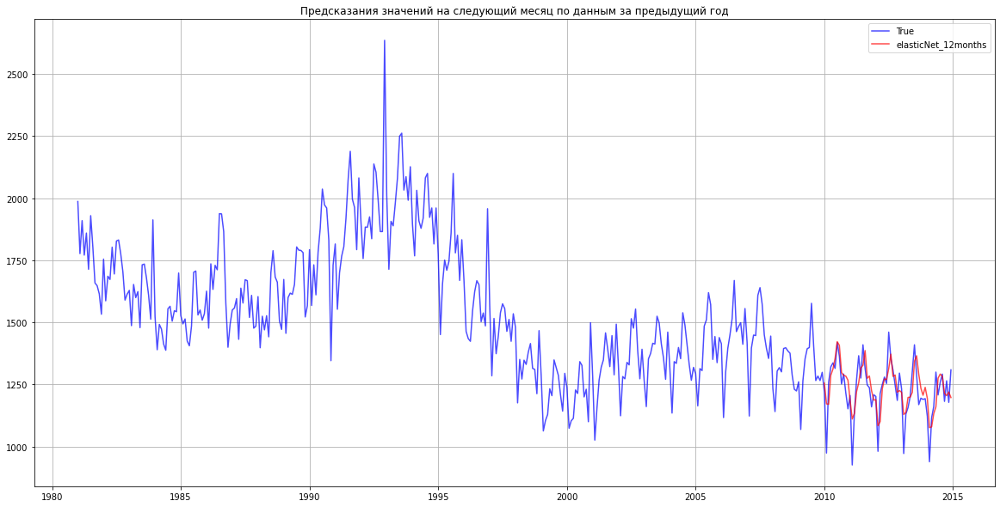

In [14]:
plt.figure(figsize=(20,10))
plt.plot(time_series['Date'], time_series['NumCases'], color='b', alpha=0.7, label="True")
plt.plot(time_series['Date'][-60:], time_series['NumCases_predict'][-60:], color='r', alpha=0.7, label="elasticNet_12months")
plt.title('Предсказания значений на следующий месяц по данным за предыдущий год')
plt.grid()
plt.legend()
plt.show()

**RMSE: 74.30526**
### Быстродействие

In [15]:
spans = []
for i in range(101):
    elasticNet_12months = sklearn.linear_model.ElasticNet(
        alpha=elasticNetCV_12months.alpha_, 
        l1_ratio=elasticNetCV_12months.l1_ratio_, 
        max_iter=elasticNetCV_12months.max_iter, 
        random_state=elasticNetCV_12months.random_state
    )
    start = time.time()
    elasticNet_12months.fit(X_train, Y_train)
    finish = time.time()
    spans.append(finish - start)

spans = np.asarray(spans[1:])
print('Mean fit time:', spans.mean(), 'Std:', spans.std(ddof=1))

Mean fit time: 0.0005724430084228516 Std: 9.844582918464247e-05


In [16]:
spans = []
for i in range(101):
    start = time.time()
    elasticNet_12months.predict(X_test)
    finish = time.time()
    spans.append(finish - start)

spans = np.asarray(spans[1:])
print('Mean predict time:', spans.mean(), 'Std:', spans.std(ddof=1))

Mean predict time: 5.045652389526367e-05 Std: 8.158243154575195e-06


## 2 Предсказания значений на следующий месяц по данным за 2 предыдущих года

In [17]:
time_series = pd.read_csv('time_series.csv').astype('float32')
time_series.head()

,Year,Month,NumCases
0,1980.0,1.0,1825.0
1,1980.0,2.0,1730.0
2,1980.0,3.0,1743.0
3,1980.0,4.0,1760.0
4,1980.0,5.0,1863.0


In [18]:
for i in range(1, 25, 1):
    time_series[f'NumCases_{i}'] = time_series['NumCases'].shift(i)

In [19]:
time_series = time_series[24:]
time_series.head()

,Year,Month,NumCases,NumCases_1,NumCases_2,NumCases_3,NumCases_4,NumCases_5,NumCases_6,NumCases_7,...,NumCases_15,NumCases_16,NumCases_17,NumCases_18,NumCases_19,NumCases_20,NumCases_21,NumCases_22,NumCases_23,NumCases_24
24,1982.0,1.0,1755.0,1533.0,1615.0,1648.0,1659.0,1804.0,1930.0,1714.0,...,1935.0,1869.0,2371.0,2179.0,1991.0,1863.0,1760.0,1743.0,1730.0,1825.0
25,1982.0,2.0,1587.0,1755.0,1533.0,1615.0,1648.0,1659.0,1804.0,1930.0,...,1861.0,1935.0,1869.0,2371.0,2179.0,1991.0,1863.0,1760.0,1743.0,1730.0
26,1982.0,3.0,1686.0,1587.0,1755.0,1533.0,1615.0,1648.0,1659.0,1804.0,...,1965.0,1861.0,1935.0,1869.0,2371.0,2179.0,1991.0,1863.0,1760.0,1743.0
27,1982.0,4.0,1673.0,1686.0,1587.0,1755.0,1533.0,1615.0,1648.0,1659.0,...,1987.0,1965.0,1861.0,1935.0,1869.0,2371.0,2179.0,1991.0,1863.0,1760.0
28,1982.0,5.0,1803.0,1673.0,1686.0,1587.0,1755.0,1533.0,1615.0,1648.0,...,1777.0,1987.0,1965.0,1861.0,1935.0,1869.0,2371.0,2179.0,1991.0,1863.0


In [20]:
train = time_series[:-60]
test = time_series[-60:]

In [21]:
X_train = train[train.columns[3:]].to_numpy()
Y_train = train['NumCases'].to_numpy()

In [22]:
elasticNetCV_24months = sklearn.linear_model.ElasticNetCV(
    l1_ratio=[.01, .1, .5, .7, .9, .95, .99, .999, 1],
    n_alphas=1000,
    max_iter=10000,
    cv=sklearn.model_selection.TimeSeriesSplit(n_splits=3),
    verbose=3,
    n_jobs=-1,
    random_state=0
)

elasticNetCV_24months.fit(X_train, Y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 773.4163818359375, 1)(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)
(array([0.00165626, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.01091785, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 0.27368035912513733, 1772.4925537109375, 9)(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0., 


(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 773.4163818359375, 1)

(array([0.02491675, 0.01235639, 0.00965622, 0.00572705, 0.00383641,
       0.        , 0.00052358, 0.        , 0.00032544, 0.00194158,
       0.00911447, 0.02637089, 0.00266323, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 2.486896276473999, 1772.4925537109375, 6)
(array([0.07746155, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.08591601, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 2.758023500442505, 1772.4925537109375, 5)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
  

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 773.4163818359375, 1)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 773.4163818359375, 1)


(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 773.4163818359375, 1)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 773.4163818359375, 1)(array([0.10044029, 0.01271167, 0.0016746 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.11263338, 0.        , 0.        , 0.  

      dtype=float32), 0.0, 141.72007751464844, 1)(array([0.15241809, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.17223014, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 15.51793098449707, 1772.4925537109375, 6)(array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.00333453, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 0.2056323140859604, 773.4163818359375, 2)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)


(array([0.00764656, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.01260903, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 0.243340402841568, 773.4163818359375, 3)(array([0.13314267, 0.03227057, 0.02420128, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.01087224, 0.15325129, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 37.2403564453125, 1772.4925537109375, 8)
(array([0.01922305, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.04803287, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.  


(array([0.06562465, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.11246508, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 1.0637381076812744, 773.4163818359375, 5)
(array([0.04856227, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.07944367, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 0.22070135176181793, 773.4163818359375, 5)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)
(array([0.05046748, 0.        , 0.        , 0.

      dtype=float32), 0.0, 141.72007751464844, 1)(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)
(array([0.0091016 , 0.00723807, 0.00679284, 0.00618445, 0.0058698 ,
       0.00454286, 0.00533509, 0.00514994, 0.0053206 , 0.00557688,
       0.00666185, 0.00919065, 0.00578925, 0.00479148, 0.00439709,
       0.00344899, 0.0030749 , 0.00160615, 0.00223415, 0.00164851,
       0.00155329, 0.00142488, 0.00245162, 0.0041749 ], dtype=float32), 0.5539471507072449, 1772.4925537109375, 4)
(array([0.0247162 , 0.00372069, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.00069775, 0.03072549, 0.        , 0.        , 0.    

       0.        , 0.        , 0.        , 0.        ], dtype=float32), 0.7163844704627991, 773.4163818359375, 4)
(array([0.21079355, 0.02782315, 0.03318342, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.25488967, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 90.61566925048828, 1772.4925537109375, 8)(array([0.0105751 , 0.00852015, 0.00802715, 0.00735285, 0.00700275,
       0.00553773, 0.00640965, 0.00620389, 0.00639182, 0.00667295,
       0.00786876, 0.01064991, 0.00690125, 0.0058066 , 0.0053739 ,
       0.00433373, 0.0039223 , 0.00230733, 0.00300343, 0.00236468,
       0.00226818, 0.0021361 , 0.00327738, 0.00518188], dtype=float32), -0.2619464099407196, 1772.4925537109375, 4)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,



(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)

(array([0.03884365, 0.01438811, 0.00942264, 0.00174768, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.01139966, 0.0461757 , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 1.2981462478637695, 773.4163818359375, 4)
(array([0.2273383 , 0.03430023, 0.04509153, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.27999014, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 126.43849182128906, 1772.4925537109375, 7)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  

(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)
(array([0.19399567, 0.05572   , 0.05410554, 0.01848866, 0.01015058,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.03886411, 0.23331131, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 161.51348876953125, 1772.4925537109375, 9)(array([0.07060896, 0.04461075, 0.03984053, 0.03206418, 0.02853417,
       0.01005512, 0.02215631, 0.01884081, 0.02121944, 0.02415417,
       0.03903897, 0.0736963 , 0.02286746, 0.0118816 , 0.00855936,
       0.        , 0.        , 0.        , 0

      dtype=float32), 0.0, 141.72007751464844, 1)(array([0.05532419, 0.02592706, 0.02038191, 0.01162459, 0.0024956 ,
       0.        , 0.        , 0.        , 0.        , 0.00429652,
       0.02302075, 0.06455444, 0.00392923, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.00216229], dtype=float32), 3.3847432136535645, 773.4163818359375, 5)(array([0.20317344, 0.05774906, 0.05770488, 0.02038234, 0.01261953,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.04152634, 0.24604358, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 157.13143920898438, 1772.4925537109375, 9)(array([0.19521217, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.25190887, 0.        , 0.      

(array([0.21130455, 0.05922409, 0.06076583, 0.021843  , 0.01460166,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.04348886, 0.2574555 , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 155.4680938720703, 1772.4925537109375, 9)
(array([0.01157435, 0.00791202, 0.00703207, 0.00584837, 0.00456225,
       0.00158533, 0.00365932, 0.00403641, 0.00415564, 0.00489145,
       0.00739446, 0.01251411, 0.00544857, 0.004078  , 0.00360947,
       0.00158527, 0.00075917, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.00154289, 0.00451937], dtype=float32), 0.17383284866809845, 773.4163818359375, 4)(array([0.0819328 , 0.05124247, 0.04587509, 0.03674661, 0.03271712,
       0.01091505, 0.02536658, 0.02128146, 0.02408003, 0.02740637,
       0.04489167, 0.08557601, 0.02490976, 0.01264697, 0.00915149,
       0.        , 0.        , 0

(array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00, -0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  1.5288135e-08,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
      dtype=float32), 0.02219557762145996, 141.72007751464844, 2)(array([ 0.02431015,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.04811828,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 0.08080954104661942, 141.72007751464844, 4)(array([ 0.05124969,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.   


(array([0.02460267, 0.02027573, 0.0192139 , 0.0177442 , 0.01696531,
       0.01385898, 0.01567392, 0.0152125 , 0.01560376, 0.01616649,
       0.0186677 , 0.02439255, 0.01651858, 0.01432312, 0.01346396,
       0.01137786, 0.01054863, 0.00724214, 0.00878132, 0.00756073,
       0.00750764, 0.00738967, 0.00994472, 0.01402071], dtype=float32), 20.757183074951172, 1772.4925537109375, 4)
(array([ 0.00122224,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.00200754,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.00011582], dtype=float32), -0.10227382183074951, 141.72007751464844, 3)
(array([ 0.0012983 ,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.00208763,  0.        ,  0.        ,  

(array([0.08404849, 0.04319666, 0.03655447, 0.02457338, 0.01285854,
       0.        , 0.0057712 , 0.00824167, 0.00761538, 0.01391982,
       0.03890575, 0.09577367, 0.00925007, 0.00018584, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.01647896], dtype=float32), 15.434845924377441, 773.4163818359375, 6)
(array([0.24949914, 0.01533024, 0.04480969, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.33033937, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 38.76675033569336, 773.4163818359375, 6)
(array([0.25005707, 0.01554141, 0.04530159, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.33120456, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.

        0.        ,  0.        ,  0.        ,  0.01708957], dtype=float32), 0.029553426429629326, 141.72007751464844, 3)(array([0.28004867, 0.04398895, 0.07412656, 0.01537833, 0.00534396,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.01549916, 0.35925016, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 190.31240844726562, 1772.4925537109375, 7)
(array([ 0.00517856,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.00615242,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.0034933 ], dtype=float32), -0.06586173176765442, 141.72007751464844, 3)

(array([0.11197269, 0.06652851, 0.05981581, 0.04616576, 0.0408779 ,
       0.00866144


(array([0.26524255, 0.02099811, 0.05873519, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.35491395, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 52.62456130981445, 773.4163818359375, 5)
(array([ 0.2657013 ,  0.02115262,  0.05914104,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.35563326,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        , -0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 52.108055114746094, 773.4163818359375, 5)(array([0.11868652, 0.0695451 , 0.06262119, 0.04776502, 0.04223819,
       0.00742565, 0.03158402, 0.02401417, 0.02847026, 0.03313204,
       0.06048036, 0.12528014, 0.02386472, 0.00812765, 0.00435906,
       0.

(array([0.12606934, 0.07271715, 0.06561469, 0.04934614, 0.04358551,
       0.00582519, 0.03229052, 0.02382803, 0.02867163, 0.03359668,
       0.06310695, 0.13351743, 0.02236373, 0.006189  , 0.00242588,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.03659773], dtype=float32), 162.9331817626953, 1772.4925537109375, 8)
(array([0.2901472 , 0.04402362, 0.07905322, 0.01736061, 0.00880513,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.01679949, 0.3751603 , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 164.6103515625, 1772.4925537109375, 7)
(array([ 0.27347508,  0.02368149,  0.06603391,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.36785954,  0.        ,  0.        ,  0.        ,
        0.        , 

(array([ 0.01060493,  0.00349698,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.01179185,  0.00101243,  0.00087077,  0.        ,
        0.        ,  0.        ,  0.        ,  0.00070298,  0.        ,
        0.        ,  0.        ,  0.        ,  0.00797714], dtype=float32), -0.004745572339743376, 141.72007751464844, 3)(array([ 0.22555733,  0.01998239,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.2049824 , -0.        ,  0.        ,  0.        ,
       -0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.02697823], dtype=float32), 0.8947815299034119, 141.72007751464844, 4)


(array([ 0.01073656,  0.00358154,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.01192616,  0



(array([0.0287865 , 0.02091141, 0.01908293, 0.01657754, 0.01395762,
       0.00772222, 0.01212427, 0.01281588, 0.01296678, 0.01436916,
       0.01944681, 0.03012167, 0.01501888, 0.01231057, 0.01148661,
       0.0073666 , 0.00586835, 0.00042107, 0.00337805, 0.00141434,
       0.00118838, 0.00287394, 0.00829186, 0.0146241 ], dtype=float32), 3.6069469451904297, 773.4163818359375, 4)
(array([ 0.01323949,  0.00518486,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.01446482,  0.00217655,  0.00203827,  0.        ,
        0.        ,  0.        ,  0.        ,  0.00184904,  0.        ,
        0.        ,  0.        ,  0.00025641,  0.01003469], dtype=float32), -0.010484124533832073, 141.72007751464844, 3)
(array([ 0.24945582,  0.04097194,  0.06469381,  0.00774492,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.01917244,  0.33041105,  0.        ,  0.        , 



(array([0.03294425, 0.02385948, 0.02177325, 0.01889858, 0.01591699,
       0.00876072, 0.0138329 , 0.01459842, 0.01474305, 0.01631769,
       0.02210303, 0.03434464, 0.01692185, 0.01386613, 0.01296708,
       0.00827255, 0.00661962, 0.00041643, 0.00385476, 0.00161751,
       0.00139295, 0.00334926, 0.00957556, 0.01686151], dtype=float32), 5.725285053253174, 773.4163818359375, 4)
(array([ 0.24101044,  0.00481645,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.21499898, -0.        ,  0.        ,  0.        ,
       -0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.01839838], dtype=float32), 1.511271357536316, 141.72007751464844, 4)
(array([ 0.01715986,  0.00768522,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        ,  0.        ,  0.        ,
        0.00133563,  0.01834399,  0.00375831,  0.00364794,  0.  

(array([ 0.3063669 ,  0.04284843,  0.08675699,  0.019774  ,  0.01346155,
        0.        ,  0.0016406 ,  0.        ,  0.        ,  0.        ,
        0.01727427,  0.40071636, -0.        ,  0.        ,  0.        ,
        0.        ,  0.        , -0.        ,  0.        , -0.        ,
        0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 127.01776123046875, 1772.4925537109375, 6)
(array([0.13567697, 0.0660275 , 0.05808435, 0.03873475, 0.02229116,
       0.        , 0.01336424, 0.01565939, 0.01253725, 0.02130225,
       0.05935908, 0.15335171, 0.00038662, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.034933  ], dtype=float32), 51.27227020263672, 773.4163818359375, 6)
(array([ 0.30032042,  0.03040576,  0.08638429,  0.00969439,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.00277542,  0.41052008, -0.        , -0.        , -0.   

       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 169.4660186767578, 1772.4925537109375, 6)(array([3.9665107e-02, 2.8467985e-02, 2.5950307e-02, 2.2444120e-02,
       1.8854357e-02, 1.0108744e-02, 1.6357256e-02, 1.7240478e-02,
       1.7362006e-02, 1.9220654e-02, 2.6214708e-02, 4.1173704e-02,
       1.9677298e-02, 1.6051229e-02, 1.5048016e-02, 9.3749277e-03,
       7.4932817e-03, 3.6641095e-06, 4.2951563e-03, 1.5842356e-03,
       1.3705047e-03, 3.7924352e-03, 1.1412038e-02, 2.0348290e-02],
      dtype=float32), 9.99669075012207, 773.4163818359375, 4)(array([ 0.30934504,  0.04241953,  0.08807857,  0.02002802,  0.01402775,
        0.        ,  0.00269193,  0.        ,  0.        ,  0.        ,
        0.0170291 ,  0.40523344, -0.        ,  0.        ,  0.        ,
       -0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 76.41924285888672, 1772.4925537109375, 5)


(array([0

(array([ 0.27787733,  0.04245051,  0.07897699,  0.01603192,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.02134561,  0.3729419 , -0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 64.58010864257812, 773.4163818359375, 5)
(array([ 0.27819985,  0.0424455 ,  0.07913892,  0.01611459,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.02134365,  0.37343448, -0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 63.512210845947266, 773.4163818359375, 5)
(array([0.05379825, 0.04165971, 0.03882372, 0.03469776, 0.03260178,
       0.0239806 , 0.02914341, 0.02772898, 0.02880968, 0.03021659,
       0.03706108, 0.05263504, 0.0302689 , 0.0247361

(array([ 0.02901013,  0.01509067,  0.00097413,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        , -0.        ,  0.        ,
        0.00499422,  0.02973551,  0.00772839,  0.0077898 ,  0.00050571,
        0.        ,  0.00078299,  0.        ,  0.00741502,  0.        ,
        0.        ,  0.        ,  0.00412209,  0.02092187], dtype=float32), 0.027212636545300484, 141.72007751464844, 4)
(array([ 0.30039874,  0.07523098,  0.        ,  0.        ,  0.        ,
       -0.04320064, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.27772224, -0.02589328, -0.        , -0.        ,
       -0.        ,  0.        , -0.        ,  0.01307898, -0.        ,
       -0.02232547, -0.        ,  0.        ,  0.04838295], dtype=float32), 7.956760883331299, 141.72007751464844, 5)
(array([ 0.27267602,  0.03486631,  0.        ,  0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.2456547 , -0.  

(array([ 0.031354  ,  0.01652076,  0.00151121,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        , -0.        ,  0.        ,
        0.0056408 ,  0.03194245,  0.00837096,  0.00848006,  0.00073356,
        0.        ,  0.00104954,  0.        ,  0.00808639,  0.        ,
        0.        ,  0.        ,  0.00451261,  0.02238698], dtype=float32), 0.009958653710782528, 141.72007751464844, 4)

(array([ 0.18786272,  0.08811153,  0.08138886,  0.05282567,  0.04675954,
        0.        ,  0.03151456,  0.01389686,  0.022911  ,  0.02820086,
        0.07657614,  0.20619366,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.04052526], dtype=float32), 389.57879638671875, 1772.4925537109375, 7)
(array([ 0.18835896,  0.08814344,  0.08146842,  0.05279279,  0.04673829,
        0.        ,  0.03148065,  0.01375466,  0.02281271,  0.02808401,
        0.07662117,  0.20684554,  0.

(array([ 0.03535294,  0.01894664,  0.00241046,  0.        ,  0.        ,
       -0.00081425, -0.        ,  0.        , -0.        ,  0.        ,
        0.00670279,  0.03567624,  0.00938053,  0.0095865 ,  0.00104506,
        0.        ,  0.00146033,  0.        ,  0.00919169,  0.        ,
        0.        ,  0.        ,  0.00509791,  0.02481451], dtype=float32), 0.030488155782222748, 141.72007751464844, 4)
(array([ 2.8923571e-01,  4.1921314e-02,  8.4642768e-02,  1.8683750e-02,
        0.0000000e+00,  0.0000000e+00,  3.3868180e-04,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  2.0823563e-02,  3.9033797e-01,
       -0.0000000e+00, -0.0000000e+00, -0.0000000e+00, -0.0000000e+00,
       -0.0000000e+00, -0.0000000e+00, -0.0000000e+00, -0.0000000e+00,
       -0.0000000e+00, -0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
      dtype=float32), 55.976966857910156, 773.4163818359375, 5)
(array([ 0.15217075,  0.05727154,  0.        ,  0.        ,  0.        ,
       -0.00149212, -0.  


(array([ 0.29259068,  0.04124545,  0.08687563,  0.0196768 ,  0.        ,
        0.        ,  0.00442129,  0.        ,  0.        ,  0.        ,
        0.02168313,  0.39585042, -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.00782697, -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 150.69320678710938, 773.4163818359375, 6)(array([ 0.03911291,  0.02120936,  0.00323317,  0.        ,  0.        ,
       -0.00204611, -0.        ,  0.        , -0.        ,  0.        ,
        0.00765374,  0.03915443,  0.01023086,  0.01054601,  0.00125205,
        0.        ,  0.00179145,  0.        ,  0.01018071,  0.        ,
        0.        ,  0.        ,  0.00555673,  0.02701663], dtype=float32), 0.09255523979663849, 141.72007751464844, 4)
(array([ 0.1876083 ,  0.07716212,  0.07205402,  0.04335355,  0.02307533,
        0.        ,  0.01529831,  0.01509696,  0.00727357,  0.01743921,
        0.06929293,  0.21731114,  0.   

(array([ 0.30903605,  0.06633347,  0.        ,  0.        ,  0.        ,
       -0.03652263, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.2850655 , -0.02584108, -0.        , -0.        ,
       -0.        ,  0.        , -0.        ,  0.00494965, -0.        ,
       -0.01375047, -0.        ,  0.        ,  0.04152563], dtype=float32), 1.136860966682434, 141.72007751464844, 6)
(array([0.0739242 , 0.05396411, 0.04974211, 0.04320437, 0.04015732,
       0.02626987, 0.03498919, 0.03253732, 0.03429792, 0.03640878,
       0.04738969, 0.07273864, 0.03524555, 0.02690721, 0.02429574,
       0.01622029, 0.01394316, 0.00026669, 0.00859273, 0.00391431,
       0.00491605, 0.0051144 , 0.0176045 , 0.0363971 ], dtype=float32), 109.50960540771484, 1772.4925537109375, 7)

(array([ 0.18060431,  0.07131799,  0.        ,  0.        ,  0.        ,
       -0.02017635, -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.1705708 ,  0.        ,  0.        , -0. 

       -0.02466632, -0.        ,  0.        ,  0.0459698 ], dtype=float32), 10.165240287780762, 141.72007751464844, 5)
(array([ 0.32009375,  0.04170987,  0.09255038,  0.02012759,  0.00170324,
       -0.        ,  0.01399894,  0.        ,  0.        ,  0.        ,
        0.03103882,  0.4255209 , -0.04926334, -0.        , -0.        ,
       -0.        , -0.        , -0.02907617, -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 133.8092498779297, 773.4163818359375, 9)
(array([ 0.38377544,  0.03298584,  0.10238446,  0.01201869,  0.0103567 ,
       -0.        ,  0.02423265,  0.        ,  0.        ,  0.        ,
        0.03966892,  0.49704862, -0.15439141, -0.        , -0.        ,
       -0.00142631, -0.        , -0.04482492, -0.        , -0.01535931,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 282.86383056640625, 773.4163818359375, 8)

(array([ 0.32471275,  0.04561175,  0.0975829 ,  0.02431757,  0.0348

       -0.03565544, -0.        ,  0.        ,  0.05040332], dtype=float32), 10.176848411560059, 141.72007751464844, 5)(array([ 0.3938304 ,  0.03287303,  0.10334592,  0.01649982,  0.0138629 ,
       -0.        ,  0.0264276 ,  0.        ,  0.        ,  0.        ,
        0.04519993,  0.5097708 , -0.17439651, -0.        , -0.        ,
       -0.01124121, -0.        , -0.04749287, -0.        , -0.01892502,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 253.93966674804688, 773.4163818359375, 7)(array([ 0.05161059,  0.02858285,  0.00577901,  0.00010547,  0.        ,
       -0.00638268, -0.        ,  0.        , -0.        ,  0.        ,
        0.01049537,  0.05053919,  0.01239167,  0.01320079,  0.00138983,
        0.        ,  0.00249034,  0.        ,  0.01310781,  0.        ,
       -0.        ,  0.        ,  0.00648172,  0.03382052], dtype=float32), 0.3158561885356903, 141.72007751464844, 4)
(array([ 0.20405287,  0.08357821,  0.        ,  0.        ,  0.     


(array([ 0.21832064,  0.07750063,  0.07970041,  0.04369675,  0.02401185,
       -0.        ,  0.02077   ,  0.01451895,  0.0028399 ,  0.0130655 ,
        0.07292338,  0.26078638, -0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.02594754, -0.        , -0.0019122 ,
       -0.        , -0.        ,  0.        ,  0.03913788], dtype=float32), 146.3653106689453, 773.4163818359375, 6)(array([ 0.05640562,  0.03133741,  0.00665579,  0.00063944,  0.        ,
       -0.00815546, -0.        , -0.        , -0.        ,  0.        ,
        0.01147556,  0.05485792,  0.01297042,  0.01401944,  0.00123365,
        0.        ,  0.00261042, -0.        ,  0.014109  ,  0.        ,
       -0.        , -0.        ,  0.0066081 ,  0.03624266], dtype=float32), 0.43896156549453735, 141.72007751464844, 4)(array([ 0.37645954,  0.10204688,  0.        ,  0.        ,  0.        ,
       -0.08577458, -0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.35408548, -0.12277

       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 261.6541748046875, 773.4163818359375, 7)(array([ 0.22615677,  0.09478303,  0.        ,  0.        ,  0.        ,
       -0.05098082, -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.21034299, -0.        ,  0.        , -0.        ,
       -0.        ,  0.        , -0.        ,  0.03096485, -0.        ,
       -0.03296475, -0.00492529,  0.        ,  0.07204717], dtype=float32), 12.318458557128906, 141.72007751464844, 4)




(array([ 0.37871748,  0.03504735,  0.10421794,  0.01666047,  0.03957556,
        0.        ,  0.03516654,  0.        ,  0.        ,  0.        ,
        0.05082189,  0.48484537, -0.11238974, -0.        , -0.        ,
       -0.00048632, -0.        , -0.06505801, -0.        , -0.00914376,
       -0.        , -0.01047781, -0.        ,  0.        ], dtype=float32), 558.8311767578125, 1772.4925537109375, 11)
(array([ 0.22456066,  0.07656857,  0.08151309,  0.04350384,  0.0

(array([ 0.36713862,  0.04086632,  0.1035238 ,  0.02706303,  0.04599063,
        0.        ,  0.03978194,  0.        ,  0.        ,  0.        ,
        0.06467461,  0.4758557 , -0.10810738, -0.        , -0.        ,
       -0.01400295, -0.        , -0.06939474, -0.        , -0.01136816,
       -0.        , -0.01530372, -0.        ,  0.        ], dtype=float32), 662.2684936523438, 1772.4925537109375, 10)(array([ 0.4109503 ,  0.03354863,  0.10468449,  0.02368872,  0.01897379,
       -0.        ,  0.02735688,  0.00761163,  0.        ,  0.        ,
        0.05372472,  0.53167284, -0.21018447, -0.        , -0.        ,
       -0.02752346, -0.        , -0.05102212, -0.        , -0.02876595,
       -0.        , -0.        ,  0.        ,  0.00091778], dtype=float32), 592.6786499023438, 773.4163818359375, 6)

(array([ 0.0700478 ,  0.03898852,  0.00894186,  0.0020409 ,  0.        ,
       -0.01342123, -0.        , -0.        , -0.        ,  0.        ,
        0.01398132,  0.06703466,  0.01390

       -0.        , -0.02072237,  0.        ,  0.        ], dtype=float32), 1011.06689453125, 1772.4925537109375, 9)(array([ 0.23155311,  0.07527656,  0.0833843 ,  0.04324597,  0.02536658,
       -0.        ,  0.02531686,  0.01853829,  0.00380016,  0.01161759,
        0.0747122 ,  0.28244522, -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.0412332 , -0.        , -0.0151214 ,
       -0.00556327, -0.        ,  0.        ,  0.04175943], dtype=float32), 155.64083862304688, 773.4163818359375, 7)(array([ 0.24903604,  0.1040372 ,  0.        ,  0.        ,  0.        ,
       -0.06268139, -0.        , -0.        , -0.00065486,  0.        ,
        0.        ,  0.23271221, -0.0147143 ,  0.        , -0.        ,
       -0.00795027,  0.        , -0.        ,  0.04426785, -0.00228036,
       -0.04178185, -0.01165809,  0.        ,  0.07870288], dtype=float32), 38.45277786254883, 141.72007751464844, 5)(array([ 0.37713358,  0.03854947,  0.10119969,  0.02239773,  0.01654286,

(array([ 0.40675345,  0.03271771,  0.10670547,  0.03196026,  0.04830765,
        0.        ,  0.04056892,  0.        ,  0.001794  ,  0.00473608,
        0.06915003,  0.52487814, -0.17371818, -0.        , -0.        ,
       -0.0318547 , -0.        , -0.07066531, -0.        , -0.01486292,
       -0.        , -0.02613334,  0.        ,  0.        ], dtype=float32), 1182.7918701171875, 1772.4925537109375, 9)(array([ 3.8504097e-01,  3.8466960e-02,  1.0195852e-01,  2.4636192e-02,
        1.8247204e-02, -0.0000000e+00,  2.7819335e-02,  4.7453190e-03,
        0.0000000e+00,  0.0000000e+00,  5.4912686e-02,  5.0132740e-01,
       -1.7062995e-01, -0.0000000e+00, -0.0000000e+00, -2.1027580e-02,
       -0.0000000e+00, -5.1790502e-02, -0.0000000e+00, -2.3873532e-02,
       -0.0000000e+00, -0.0000000e+00,  0.0000000e+00,  2.8322823e-04],
      dtype=float32), 217.5940704345703, 773.4163818359375, 8)(array([ 0.26456243,  0.10882937,  0.        ,  0.        ,  0.        ,
       -0.06889328, -0.       

(array([ 4.2182496e-01,  3.4752931e-02,  1.0594859e-01,  2.8717617e-02,
        2.2795452e-02, -3.2052090e-03,  2.7475871e-02,  1.7546590e-02,
        0.0000000e+00,  0.0000000e+00,  5.9275847e-02,  5.3820777e-01,
       -2.3425812e-01, -0.0000000e+00, -0.0000000e+00, -3.8542062e-02,
       -0.0000000e+00, -5.1583283e-02, -0.0000000e+00, -3.9698452e-02,
       -3.6425615e-04, -0.0000000e+00,  0.0000000e+00,  1.2891761e-02],
      dtype=float32), 636.9807739257812, 773.4163818359375, 5)
(array([ 0.27814484,  0.11272608,  0.        ,  0.        ,  0.        ,
       -0.07421421, -0.        ,  0.        , -0.00375246,  0.        ,
        0.00102199,  0.26187754, -0.0399817 , -0.        , -0.0072509 ,
       -0.0149743 ,  0.        , -0.        ,  0.06234755, -0.009472  ,
       -0.04866689, -0.01678343,  0.        ,  0.08511805], dtype=float32), 55.943214416503906, 141.72007751464844, 5)
(array([ 0.10824156,  0.06527651,  0.05865051,  0.04719117,  0.03665789,
        0.0044681 ,  0.02956

(array([ 0.41701123,  0.03180063,  0.10777415,  0.03763572,  0.05012699,
       -0.        ,  0.04097278,  0.        ,  0.00481318,  0.01492822,
        0.07351058,  0.53382975, -0.19790111, -0.        , -0.        ,
       -0.04273329, -0.        , -0.07168921, -0.        , -0.0182587 ,
       -0.        , -0.03830172,  0.        ,  0.00857206], dtype=float32), 1578.1365966796875, 1772.4925537109375, 6)
(array([ 9.9516839e-02,  5.4871082e-02,  1.2534196e-02,  4.6867109e-03,
        0.0000000e+00, -2.5186332e-02, -2.1138629e-05, -0.0000000e+00,
       -4.5324150e-03,  1.1842726e-03,  1.8953606e-02,  9.3297906e-02,
        1.2892261e-02,  1.7732590e-02,  0.0000000e+00, -0.0000000e+00,
        2.6987670e-03, -2.8861183e-04,  2.3509089e-02, -0.0000000e+00,
       -9.7152246e-03, -3.5331049e-03,  6.0382686e-03,  5.5842176e-02],
      dtype=float32), 4.7867045402526855, 141.72007751464844, 4)(array([ 0.12136504,  0.07640631,  0.06970469,  0.05662114,  0.0516668 ,
        0.02058356,  0.0415

       -0.00301449, -0.00406985,  0.00898283,  0.05522712], dtype=float32), 412.482421875, 1772.4925537109375, 10)(array([ 0.4162663 ,  0.11511649,  0.        ,  0.00334924,  0.        ,
       -0.11294438, -0.        ,  0.00788236, -0.00728344,  0.        ,
        0.00772137,  0.3877629 , -0.16962536,  0.        , -0.02956398,
       -0.03742859,  0.02801334,  0.        ,  0.10973217, -0.03842051,
       -0.06677476, -0.02150947,  0.        ,  0.08521863], dtype=float32), 77.68866729736328, 141.72007751464844, 5)

(array([ 0.4220193 ,  0.03148245,  0.10849887,  0.04059786,  0.05105419,
       -0.        ,  0.04124472,  0.        ,  0.00631907,  0.02098135,
        0.07586761,  0.53507686, -0.20998928, -0.        , -0.        ,
       -0.0483094 , -0.        , -0.07214922, -0.        , -0.02050585,
       -0.        , -0.0460513 ,  0.        ,  0.01728928], dtype=float32), 1650.58251953125, 1772.4925537109375, 10)(array([ 0.10612752,  0.0582739 ,  0.0131713 ,  0.00524842,  0.        ,

       -0.06635885, -0.0149613 ,  0.        ,  0.07917964], dtype=float32), 49.168251037597656, 141.72007751464844, 4)(array([ 0.13950086,  0.08262974,  0.07598162,  0.05952549,  0.05472233,
        0.01724307,  0.04367912,  0.03484911,  0.03972354,  0.04424722,
        0.07391364,  0.14612071,  0.02946473,  0.01431256,  0.01253847,
        0.        ,  0.        , -0.0228653 , -0.        , -0.01073791,
       -0.00675337, -0.00846966,  0.00793625,  0.05884046], dtype=float32), 593.7599487304688, 1772.4925537109375, 10)

(array([ 4.1571569e-01,  3.4603674e-02,  1.0934922e-01,  4.5880798e-02,
        5.3836450e-02, -0.0000000e+00,  4.3087695e-02,  0.0000000e+00,
        9.2551438e-03,  2.8899230e-02,  8.1831001e-02,  5.2045524e-01,
       -2.0917100e-01, -0.0000000e+00, -3.1865962e-04, -5.5450995e-02,
       -0.0000000e+00, -7.4598476e-02, -0.0000000e+00, -2.4651669e-02,
       -0.0000000e+00, -5.6985952e-02,  0.0000000e+00,  3.2920364e-02],
      dtype=float32), 1664.3880615234375, 177

(array([ 0.4274521 ,  0.0311319 ,  0.10921362,  0.04368912,  0.05199929,
       -0.        ,  0.04147884,  0.        ,  0.00780936,  0.02738931,
        0.07833215,  0.53643   , -0.22291659, -0.        , -0.        ,
       -0.05414518, -0.        , -0.07258492, -0.        , -0.02285647,
       -0.        , -0.05427637,  0.        ,  0.02666974], dtype=float32), 1520.8680419921875, 1772.4925537109375, 5)(array([ 0.32393387,  0.12235439,  0.        ,  0.00760611,  0.        ,
       -0.09461612, -0.        ,  0.        , -0.00991832,  0.        ,
        0.0143545 ,  0.303445  , -0.08361319, -0.        , -0.02166137,
       -0.02963279,  0.01077133, -0.        ,  0.08693548, -0.01893491,
       -0.05810202, -0.02537603,  0.        ,  0.0922088 ], dtype=float32), 56.84520721435547, 141.72007751464844, 5)
(array([ 0.31498882,  0.06933939,  0.10621642,  0.0573632 ,  0.06260214,
       -0.        ,  0.05192409,  0.00257091,  0.02444416,  0.03539962,
        0.09984571,  0.38954294, -0.08977

      dtype=float32), 624.3843994140625, 773.4163818359375, 4)(array([ 0.15378316,  0.08670981,  0.08055952,  0.06099325,  0.05677491,
        0.01430639,  0.04548083,  0.03497613,  0.04082462,  0.04582759,
        0.0795095 ,  0.16426472,  0.02449461,  0.00937573,  0.00859021,
       -0.        , -0.        , -0.0320248 , -0.0008321 , -0.01738111,
       -0.01227702, -0.01538489,  0.00638503,  0.06476457], dtype=float32), 914.6798095703125, 1772.4925537109375, 11)(array([ 3.2663274e-01,  6.8050936e-02,  1.0780718e-01,  5.8197286e-02,
        6.3025370e-02, -0.0000000e+00,  5.2174807e-02,  1.7103972e-03,
        2.4714200e-02,  3.7992831e-02,  1.0100300e-01,  4.0385407e-01,
       -1.0698675e-01, -1.4302254e-02, -1.7902099e-04, -5.4251347e-02,
       -0.0000000e+00, -8.1842743e-02, -0.0000000e+00, -3.5475634e-02,
       -7.1150572e-03, -6.4792559e-02,  0.0000000e+00,  7.1189255e-02],
      dtype=float32), 1500.0086669921875, 1772.4925537109375, 8)


(array([ 0.42582834,  0.11417691,  0

(array([ 0.34575364,  0.12581733,  0.        ,  0.01219932,  0.        ,
       -0.10632142, -0.        ,  0.00644566, -0.01459817,  0.        ,
        0.02172348,  0.32083657, -0.10551866,  0.        , -0.02859721,
       -0.0383395 ,  0.02252073, -0.        ,  0.09580376, -0.02474925,
       -0.06123278, -0.0296559 ,  0.        ,  0.09509712], dtype=float32), 61.931396484375, 141.72007751464844, 5)
(array([ 0.14397481,  0.07754115,  0.07067469,  0.0532566 ,  0.04012769,
        0.        ,  0.03301354,  0.0344203 ,  0.03120391,  0.03718935,
        0.0705691 ,  0.15586515,  0.01525153,  0.01058714,  0.01343038,
       -0.        , -0.        , -0.02699902, -0.        , -0.01656979,
       -0.01538761, -0.00501507,  0.01525553,  0.06177481], dtype=float32), 194.8407440185547, 773.4163818359375, 6)
(array([ 4.4570458e-01,  3.7684806e-02,  1.1123219e-01,  4.0041026e-02,
        4.6235811e-02, -6.2743478e-02,  3.9566237e-02,  3.6873966e-02,
        0.0000000e+00,  2.2267818e-02,  7.5926

       -0.06342564, -0.03652288,  0.        ,  0.09664501], dtype=float32), 109.28044891357422, 141.72007751464844, 5)
(array([ 0.15257014,  0.07982995,  0.07319651,  0.05413986,  0.04048412,
       -0.        ,  0.03382003,  0.03524623,  0.03147199,  0.03779339,
        0.07342536,  0.16678439,  0.01133041,  0.00830229,  0.01205164,
       -0.0003536 , -0.        , -0.03140516, -0.00123465, -0.01987899,
       -0.0183968 , -0.00771764,  0.01522644,  0.06515603], dtype=float32), 219.5723114013672, 773.4163818359375, 7)

(array([ 0.42685145,  0.03975539,  0.1080648 ,  0.03813249,  0.03739428,
       -0.03837048,  0.03522991,  0.03089587,  0.        ,  0.01283829,
        0.07196233,  0.528001  , -0.25343102,  0.        , -0.        ,
       -0.05566211,  0.        , -0.03838627, -0.        , -0.05202982,
       -0.00249091, -0.01736185,  0.        ,  0.03560748], dtype=float32), 613.3007202148438, 773.4163818359375, 5)(array([ 3.47475857e-01,  6.42501935e-02,  1.12664595e-01,  5.9233058

(array([ 0.43746307,  0.12261774,  0.        ,  0.012043  , -0.        ,
       -0.13345355, -0.0121561 ,  0.03865746, -0.02138602,  0.        ,
        0.02672453,  0.39774486, -0.19841926,  0.        , -0.03741817,
       -0.05558168,  0.04888453,  0.00639363,  0.12097167, -0.05429567,
       -0.06402224, -0.03335309,  0.        ,  0.0939161 ], dtype=float32), 119.42113494873047, 141.72007751464844, 5)(array([ 0.16190916,  0.08207289,  0.07584938,  0.05547852,  0.04093914,
       -0.        ,  0.03466584,  0.03609762,  0.03167976,  0.03827567,
        0.07644322,  0.17893523,  0.00665598,  0.0059239 ,  0.01095798,
       -0.00413665, -0.        , -0.0357286 , -0.0024023 , -0.02312774,
       -0.02128621, -0.01056714,  0.01529009,  0.06885614], dtype=float32), 301.3319091796875, 773.4163818359375, 7)(array([ 0.4389132 ,  0.03007196,  0.11784098,  0.04890016,  0.05356687,
       -0.        ,  0.0413099 ,  0.        ,  0.01028728,  0.04347229,
        0.08418451,  0.54047513, -0.2519010

       -0.06299151, -0.03692772,  0.        ,  0.09661667], dtype=float32), 108.42960357666016, 141.72007751464844, 5)
(array([ 0.45183352,  0.03819388,  0.11270008,  0.04284851,  0.05176248,
       -0.07802854,  0.04292643,  0.04120955,  0.        ,  0.03014143,
        0.07848894,  0.54120934, -0.29741582,  0.        , -0.        ,
       -0.0725949 ,  0.00106426, -0.01966981, -0.        , -0.06412364,
       -0.        , -0.04098133,  0.00305262,  0.05086943], dtype=float32), 481.6854248046875, 773.4163818359375, 4)(array([ 4.40698177e-01,  3.08181867e-02,  1.24354504e-01,  5.26365861e-02,
        5.83922975e-02, -1.06810955e-02,  4.46236320e-02,  0.00000000e+00,
        1.34826573e-02,  5.33247180e-02,  9.01658982e-02,  5.34536719e-01,
       -2.61249840e-01, -0.00000000e+00, -1.98547058e-02, -6.90181032e-02,
        0.00000000e+00, -6.83044568e-02,  0.00000000e+00, -3.15955430e-02,
       -0.00000000e+00, -8.58888775e-02,  1.40561955e-04,  6.32815436e-02],
      dtype=float32), 13

(array([ 0.44180253,  0.12695886,  0.        ,  0.01596504, -0.        ,
       -0.14265612, -0.01924676,  0.05167735, -0.02602758,  0.        ,
        0.03393732,  0.39932856, -0.20767528,  0.        , -0.039416  ,
       -0.06427445,  0.05463961,  0.01481323,  0.12341961, -0.06070596,
       -0.06230371, -0.03928703,  0.        ,  0.09839803], dtype=float32), 100.99629974365234, 141.72007751464844, 5)
(array([ 0.17810272,  0.08535734,  0.08040716,  0.05770852,  0.04183209,
       -0.00275782,  0.03646417,  0.03750377,  0.03183334,  0.03878504,
        0.08130491,  0.20070376,  0.        ,  0.00099671,  0.00881394,
       -0.01121729, -0.        , -0.04258606, -0.00381282, -0.02870177,
       -0.02591623, -0.01560825,  0.01524525,  0.07480316], dtype=float32), 231.06594848632812, 773.4163818359375, 7)

(array([ 0.4442002 ,  0.03006743,  0.12672822,  0.05288589,  0.06079213,
       -0.01711659,  0.04626705,  0.        ,  0.01448608,  0.05696946,
        0.08895274,  0.53610426, -0.266

(array([ 0.34704444,  0.06305626,  0.10196616,  0.05381051,  0.04043356,
       -0.03433618,  0.03843861,  0.037187  ,  0.00797066,  0.02371054,
        0.08938251,  0.4246087 , -0.16037825, -0.        , -0.        ,
       -0.05482259,  0.        , -0.05134803, -0.        , -0.05000871,
       -0.01847033, -0.0275764 ,  0.        ,  0.06879479], dtype=float32), 236.88180541992188, 773.4163818359375, 7)
(array([ 0.44190973,  0.0398926 ,  0.11121022,  0.04277983,  0.04866784,
       -0.06822991,  0.04101128,  0.03932062,  0.        ,  0.02598374,
        0.07921185,  0.53323597, -0.2825973 ,  0.        , -0.        ,
       -0.06863098,  0.        , -0.02477446, -0.        , -0.0611085 ,
       -0.00108755, -0.03518215,  0.        ,  0.05002412], dtype=float32), 598.8917846679688, 773.4163818359375, 4)

(array([ 0.4475023 ,  0.02935965,  0.12893957,  0.05307141,  0.06302147,
       -0.02313994,  0.04780977,  0.        ,  0.01540507,  0.06049795,
        0.08773608,  0.53754014, -0.27165




(array([ 0.1898139 ,  0.08634855,  0.08388953,  0.0595338 ,  0.04301038,
       -0.00813043,  0.03848684,  0.03860217,  0.03162822,  0.03861246,
        0.08432279,  0.21752788, -0.00057563,  0.        ,  0.0060944 ,
       -0.01766068, -0.00057304, -0.04735949, -0.00447345, -0.03307339,
       -0.02928133, -0.01973812,  0.01496837,  0.07840315], dtype=float32), 466.74853515625, 773.4163818359375, 7)

(array([ 0.44928664,  0.02857602,  0.12656003,  0.05185216,  0.05978968,
       -0.01647535,  0.04535014,  0.        ,  0.01375386,  0.05692189,
        0.08695873,  0.5426039 , -0.27267918, -0.        , -0.02185771,
       -0.07007555,  0.        , -0.0645783 ,  0.        , -0.0321431 ,
       -0.        , -0.09025753,  0.00521555,  0.06176407], dtype=float32), 1669.163818359375, 1772.4925537109375, 5)
(array([ 0.39357755,  0.13293466,  0.        ,  0.02185431, -0.        ,
       -0.13162513, -0.01724333,  0.03917037, -0.02898826,  0.00780159,
        0.03742559,  0.35442236, -0.1577

       -0.00067324, -0.04434564,  0.00495017,  0.05372628], dtype=float32), 476.1226806640625, 773.4163818359375, 4)
(array([ 0.44929755,  0.12833154,  0.        ,  0.02542423, -0.        ,
       -0.15842536, -0.02895253,  0.07164153, -0.03744064,  0.00699742,
        0.04584229,  0.39502865, -0.22367716,  0.0131197 , -0.04715166,
       -0.07973162,  0.06559546,  0.02568344,  0.12540358, -0.06736305,
       -0.05897669, -0.05218549, -0.        ,  0.10707826], dtype=float32), 101.2406005859375, 141.72007751464844, 3)(array([ 0.4489056 ,  0.12775199,  0.        ,  0.02235517, -0.        ,
       -0.15426445, -0.02633665,  0.0666457 , -0.03388285,  0.0040232 ,
        0.04243151,  0.39810288, -0.2210611 ,  0.00925202, -0.04467716,
       -0.07560433,  0.06270111,  0.02315605,  0.12494817, -0.06626347,
       -0.05980958, -0.04815508, -0.        ,  0.10435705], dtype=float32), 110.03553771972656, 141.72007751464844, 4)
(array([ 0.2063684 ,  0.10302188,  0.01831057,  0.01655846,  0.      

(array([ 0.19959208,  0.08700911,  0.08624856,  0.06060536,  0.04385393,
       -0.01195941,  0.03963681,  0.0394919 ,  0.03155868,  0.03880677,
        0.08659855,  0.23042527, -0.00897129, -0.        ,  0.00466665,
       -0.02175077, -0.0009411 , -0.04982246, -0.00476453, -0.03570764,
       -0.0311942 , -0.02246601,  0.01483588,  0.08126118], dtype=float32), 465.72344970703125, 773.4163818359375, 7)(array([ 0.4511557 ,  0.1277874 ,  0.        ,  0.02441796, -0.        ,
       -0.15785618, -0.0283912 ,  0.07107096, -0.03648276,  0.00580818,
        0.04493511,  0.3975036 , -0.22518231,  0.01237492, -0.04638892,
       -0.07904025,  0.06516791,  0.02560988,  0.12535322, -0.06781294,
       -0.05897329, -0.05106968, -0.        ,  0.10622539], dtype=float32), 99.53765106201172, 141.72007751464844, 4)


(array([ 0.45052332,  0.03936703,  0.11283973,  0.04623241,  0.05093787,
       -0.08246478,  0.04482997,  0.0432606 ,  0.        ,  0.03420051,
        0.07956686,  0.5357685 , -0.2970

(array([ 4.6434408e-01,  3.3477414e-02,  1.1595352e-01,  5.0635464e-02,
        4.9419619e-02, -9.5735811e-02,  4.9051948e-02,  4.6875909e-02,
        0.0000000e+00,  4.3054100e-02,  7.7225797e-02,  5.4092574e-01,
       -3.1680679e-01,  6.9221021e-03, -2.9694883e-03, -8.8256821e-02,
        2.0149428e-02, -1.9054877e-02, -0.0000000e+00, -7.0799887e-02,
       -3.7170373e-04, -5.9442058e-02,  1.6935335e-02,  5.5603996e-02],
      dtype=float32), 524.4808349609375, 773.4163818359375, 3)(array([ 0.40892243,  0.13330048,  0.00087841,  0.02512083, -0.        ,
       -0.14250529, -0.02325546,  0.05181457, -0.03381608,  0.01052848,
        0.04231811,  0.36401486, -0.17732497,  0.00486238, -0.04546406,
       -0.06727415,  0.05524198,  0.01160488,  0.12177527, -0.05187853,
       -0.06246766, -0.0486704 ,  0.        ,  0.10644329], dtype=float32), 125.41551208496094, 141.72007751464844, 4)(array([ 0.3851926 ,  0.05664751,  0.10678782,  0.05441733,  0.0486819 ,
       -0.06038046,  0.0428863

(array([ 0.39249456,  0.05531345,  0.1076972 ,  0.05427101,  0.05040843,
       -0.06543267,  0.04380376,  0.04340296,  0.00559126,  0.03267695,
        0.09057173,  0.47112903, -0.22550032, -0.        , -0.        ,
       -0.07053778,  0.        , -0.03583842, -0.        , -0.05998631,
       -0.01309489, -0.0425122 ,  0.00175258,  0.07207815], dtype=float32), 570.3248901367188, 773.4163818359375, 5)

(array([ 0.45480034,  0.03890372,  0.1135092 ,  0.04854482,  0.05011845,
       -0.0883536 ,  0.0468022 ,  0.04498846,  0.        ,  0.03819813,
        0.07920219,  0.5366502 , -0.3035643 ,  0.        , -0.        ,
       -0.0824097 ,  0.01291815, -0.02009735, -0.        , -0.06834819,
       -0.00053975, -0.05256012,  0.01117531,  0.05553121], dtype=float32), 556.7650146484375, 773.4163818359375, 3)

(array([ 0.45893788,  0.02585752,  0.13684008,  0.05471243,  0.06587072,
       -0.03827163,  0.04784725, -0.        ,  0.01899775,  0.0712093 ,
        0.08513707,  0.5409297 , -0.28656


(array([ 0.24816002,  0.11642876,  0.01842783,  0.02073618, -0.        ,
       -0.08686933, -0.01247891,  0.0104202 , -0.02588431,  0.01456371,
        0.03728887,  0.22596376, -0.03733635,  0.00954107, -0.02882897,
       -0.03460623,  0.02181227, -0.0079228 ,  0.08082355, -0.0147544 ,
       -0.04806858, -0.03909471,  0.00164087,  0.10127031], dtype=float32), 92.666748046875, 141.72007751464844, 6)(array([ 0.46770185,  0.03060515,  0.11812183,  0.05203318,  0.04897302,
       -0.09960776,  0.05037813,  0.04802868,  0.        ,  0.04602335,
        0.07661241,  0.5410577 , -0.3218171 ,  0.01137298, -0.00635633,
       -0.09096376,  0.02424744, -0.01897896, -0.        , -0.07190711,
       -0.00082877, -0.06337731,  0.02010839,  0.05650037], dtype=float32), 521.0777587890625, 773.4163818359375, 2)


(array([ 0.4583322 ,  0.026222  ,  0.13431844,  0.05280059,  0.06628928,
       -0.03438437,  0.04788018,  0.        ,  0.01730753,  0.06827046,
        0.08424941,  0.5442082 , -0.285872

       -0.0498243 , -0.04093567,  0.00130966,  0.10297137], dtype=float32), 108.89342498779297, 141.72007751464844, 6)


(array([ 0.40676597,  0.05236362,  0.10932145,  0.05493337,  0.05063452,
       -0.07435729,  0.04583459,  0.04519603,  0.00470293,  0.0363254 ,
        0.08905296,  0.48399276, -0.24477415, -0.        , -0.        ,
       -0.07657638,  0.00596519, -0.03260076, -0.        , -0.06334315,
       -0.01120817, -0.04852023,  0.00617454,  0.07091552], dtype=float32), 469.8781433105469, 773.4163818359375, 5)(array([ 0.462742  ,  0.02454524,  0.139311  ,  0.05589923,  0.06503413,
       -0.04213225,  0.0474485 , -0.        ,  0.02022476,  0.07436173,
        0.08459283,  0.54169816, -0.29113057, -0.        , -0.03404329,
       -0.08308656,  0.01153711, -0.06013091,  0.0121    , -0.0429645 ,
        0.        , -0.11552209,  0.025273  ,  0.06751326], dtype=float32), 1543.0594482421875, 1772.4925537109375, 2)
(array([ 4.6908739e-01,  2.9407222e-02,  1.1899672e-01,  5.2641273

       -0.01053591, -0.05057621,  0.00773282,  0.07044605], dtype=float32), 652.6881103515625, 773.4163818359375, 4)(array([ 0.45733315,  0.12786926,  0.        ,  0.03006142, -0.        ,
       -0.16771182, -0.03398816,  0.08320707, -0.04362084,  0.01070629,
        0.05180188,  0.39582852, -0.23647957,  0.02095543, -0.05109698,
       -0.08844022,  0.0719525 ,  0.03232588,  0.12643535, -0.07205556,
       -0.05668063, -0.05905823, -0.        ,  0.11135466], dtype=float32), 109.24176788330078, 141.72007751464844, 3)(array([ 0.46192232,  0.03451276,  0.11595313,  0.05146309,  0.04929509,
       -0.09591674,  0.04930799,  0.04727204,  0.        ,  0.04365601,
        0.07802349,  0.5378933 , -0.314073  ,  0.00651057, -0.00328978,
       -0.08868307,  0.02080363, -0.01970724, -0.        , -0.07088736,
       -0.00090857, -0.06019074,  0.01718426,  0.0569426 ], dtype=float32), 438.8773193359375, 773.4163818359375, 3)
(array([ 0.24759065,  0.08809843,  0.09631958,  0.06398562,  0.04707016

(array([ 0.43182212,  0.13150126,  0.00266809,  0.03040536, -0.00125853,
       -0.1582963 , -0.03149923,  0.07122442, -0.04146043,  0.01420463,
        0.04984812,  0.3764464 , -0.20729208,  0.01586334, -0.0520987 ,
       -0.08103362,  0.06630375,  0.02361197,  0.12572879, -0.06248157,
       -0.05984858, -0.05782447, -0.        ,  0.11176515], dtype=float32), 99.27271270751953, 141.72007751464844, 4)
(array([ 0.46446592,  0.0240548 ,  0.13901223,  0.05525593,  0.0648247 ,
       -0.04165422,  0.04724328, -0.        ,  0.01978592,  0.07415326,
        0.08365916,  0.5442971 , -0.29318133, -0.        , -0.03366327,
       -0.08234035,  0.01087258, -0.05951705,  0.01152939, -0.0423461 ,
        0.        , -0.11489114,  0.02529781,  0.06639069], dtype=float32), 1551.35595703125, 1772.4925537109375, 2)
(array([ 0.2826065 ,  0.12486657,  0.01773485,  0.0239881 , -0.        ,
       -0.102317  , -0.01692022,  0.01984924, -0.03006045,  0.01761746,
        0.04093016,  0.25556487, -0.063822

(array([ 0.42809284,  0.04105477,  0.13367657,  0.05934975,  0.06907638,
       -0.03655155,  0.05098435,  0.        ,  0.02243629,  0.06787007,
        0.09650315,  0.5082174 , -0.24908628, -0.01152814, -0.02773957,
       -0.08095334,  0.00547161, -0.06479953,  0.00879907, -0.04403221,
       -0.        , -0.10860769,  0.01425995,  0.07937966], dtype=float32), 1600.9857177734375, 1772.4925537109375, 5)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)(array([ 0.4283767 ,  0.04094683,  0.13376002,  0.05935785,  0.06903909,
       -0.03667602,  0.0509547 ,  0.        ,  0.02245156,  0.06797053,
        0.09643623,  0.50843936, -0.24943456, -0.01148349, -0.02782131,
    

(array([ 2.92210311e-01,  8.91172066e-02,  1.12520576e-01,  6.85588792e-02,
        7.10841566e-02, -1.15084359e-02,  5.62507175e-02,  2.06545088e-02,
        4.12458926e-02,  5.37813045e-02,  1.12431578e-01,  3.54577303e-01,
       -8.67728218e-02, -3.10489722e-02, -1.05906092e-02, -5.73000647e-02,
       -2.44292826e-03, -7.76941478e-02, -0.00000000e+00, -4.95404787e-02,
       -2.61654574e-02, -7.42434263e-02,  2.57270964e-04,  1.06139198e-01],
      dtype=float32), 1529.5032958984375, 1772.4925537109375, 8)(array([ 0.4379267 ,  0.04520432,  0.11453363,  0.05655676,  0.0488346 ,
       -0.09360544,  0.05036983,  0.04893121,  0.00193402,  0.04544687,
        0.08469158,  0.51125985, -0.2858127 ,  0.        , -0.00347105,
       -0.0889718 ,  0.02229228, -0.02553866, -0.        , -0.07031967,
       -0.00633137, -0.0622092 ,  0.01693775,  0.06712044], dtype=float32), 676.2684326171875, 773.4163818359375, 4)
(array([ 0.4391279 ,  0.03671247,  0.13694435,  0.05964353,  0.06756742,
     

(array([ 0.29679582,  0.08466826,  0.10311806,  0.06450393,  0.05051981,
       -0.05129355,  0.04716815,  0.04453436,  0.02641131,  0.0400163 ,
        0.09881829,  0.35571125, -0.11325074, -0.01513434,  0.        ,
       -0.05724275,  0.00061151, -0.05212697, -0.00144053, -0.05519255,
       -0.03444131, -0.04429941,  0.01304655,  0.09434673], dtype=float32), 311.34796142578125, 773.4163818359375, 6)(array([0.05981848, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.12313443, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 0.5469854474067688, 773.4163818359375, 6)

(array([ 0.4436777 ,  0.03484075,  0.13830018,  0.0597505 ,  0.06691694,
       -0.04320718,  0.04933698,  0.        ,  0.02323879,  0.07350304,
        0.09259119,  0.520161  , -0.26807958, -0.00876456, -0.032


(array([0.17504069, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.20720847, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 27.494903564453125, 1772.4925537109375, 7)

(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,

(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)
(array([0.00030167, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.02132739, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 0.37184566259384155, 1772.4925537109375, 13)(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)

(array([0.00337638, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.0247009 , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.       

       0.        , 0.        , 0.        , 0.        ], dtype=float32), 31.37282371520996, 1772.4925537109375, 7)(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)
(array([0.07375857, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.10196443, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 3.7364282608032227, 1772.4925537109375, 10)(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)

(array([0.14508471, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)(array([0.189185 , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.2260417,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ],
      dtype=float32), 20.120079040527344, 1772.4925537109375, 8)
(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0.], dtype=float32), 0.0, 773.4163818359375, 1)
(array([0.04397129, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.11520791, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0


(array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.03025934,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), -0.05817316472530365, 141.72007751464844, 2)


(array([0.16980986, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.20750585, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 25.153791427612305, 1772.4925537109375, 8)
(array([0.20767671, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.28047147, 0.        , 0.        , 0.        ,
 

       0.        , 0.        , 0.        , 0.        ], dtype=float32), 25.701250076293945, 1772.4925537109375, 8)


(array([0.1265353 , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.16062619, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 11.747587203979492, 1772.4925537109375, 9)(array([0.23300527, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.3066703 , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 9.052165031433105, 773.4163818359375, 5)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.

(array([0.28794354, 0.01329869, 0.05599896, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.35838923, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 28.25055694580078, 1772.4925537109375, 7)(array([ 0.07593144,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.09251082,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 0.019686948508024216, 141.72007751464844, 4)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)
(array([ 0.,  0.,  0.,

       0.        , 0.        , 0.        , 0.        ], dtype=float32), 9.006534576416016, 773.4163818359375, 5)(array([0.03863193, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.11063989, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 0.7082868218421936, 773.4163818359375, 6)(array([ 0.15376678,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.15363237,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 0.047605134546756744, 141.72007751464844, 3)
(array([0.2468733 , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.       

(array([ 0.15250392,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.15263972,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 0.016781819984316826, 141.72007751464844, 3)
(array([ 0.15426725,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.15402266,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 0.1512158364057541, 141.72007751464844, 3)
(array([ 0.15601876,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.15539622,  0. 

       0.        , 0.        , 0.        , 0.        ], dtype=float32), 45.06546401977539, 1772.4925537109375, 7)(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)


(array([ 0.05553266,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.07682136,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), -0.04176449030637741, 141.72007751464844, 4)
(array([0.27864972, 0.        , 0.0206623 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.3343539 , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0

       0.        , 0.        , 0.        , 0.        ], dtype=float32), 2.0312483310699463, 773.4163818359375, 6)


(array([ 0.22333166,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.20460123,  0.        ,  0.        ,  0.        ,
       -0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.00669604], dtype=float32), 1.1033474206924438, 141.72007751464844, 4)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)(array([0.28399473, 0.        , 0.02821328, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.34284493, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0. 


(array([ 0.11194195,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.12093224,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 0.04983220994472504, 141.72007751464844, 3)
(array([ 0.28515035,  0.        ,  0.0542778 ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.37655658,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        , -0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 6.779357433319092, 773.4163818359375, 5)(array([0.29270932, 0.        , 0.04053434, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.35670158, 0.        , 0.     

(array([0.3126062 , 0.02676051, 0.08174392, 0.00869751, 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.4062277 , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 119.86784362792969, 1772.4925537109375, 6)(array([0.25930008, 0.        , 0.01606977, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.34036312, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 11.046038627624512, 773.4163818359375, 5)
(array([ 0.0556994 ,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.07702904,  0.        ,  0.        ,  0.        ,
        0.       

(array([0.3062341 , 0.00383219, 0.06033862, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.38061714, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 68.28460693359375, 1772.4925537109375, 7)
(array([0.22265558, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.29863188, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 9.697039604187012, 773.4163818359375, 5)
(array([0.22398259, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.29998782, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.


(array([ 0.3073114 ,  0.01990564,  0.08650564,  0.00077903,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.41775218, -0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 24.9776554107666, 773.4163818359375, 4)
(array([ 0.28261146,  0.02381679,  0.        ,  0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.25174752, -0.        ,  0.        , -0.        ,
       -0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.02011774], dtype=float32), 2.075279474258423, 141.72007751464844, 4)
(array([ 0.28310728,  0.02442773,  0.        ,  0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.2522604 , -0.      

       -0.        , -0.        ,  0.        ,  0.02591348], dtype=float32), 3.200869560241699, 141.72007751464844, 4)(array([0.31309777, 0.01052019, 0.07115478, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.3956922 , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 65.75798797607422, 1772.4925537109375, 7)

(array([ 0.30978838,  0.02148895,  0.08871101,  0.00347929,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.4225026 , -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 23.214290618896484, 773.4163818359375, 4)
(array([ 0.3053298 ,  0.01483829,  0.08133207,  0.        ,  0.        ,
        0.        ,

(array([ 0.30897605,  0.01757065,  0.08622802,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.4193167 , -0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 27.7891788482666, 773.4163818359375, 4)
(array([ 0.30915475,  0.01770349,  0.08646865,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.41963992, -0.        , -0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 27.564607620239258, 773.4163818359375, 4)
(array([ 0.3093324 ,  0.01783549,  0.08670742,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.4199609 , -0.       

(array([ 0.3116775 ,  0.01964441,  0.08921677,  0.00221843,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.424564  , -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 27.283414840698242, 773.4163818359375, 4)
(array([ 0.29676285,  0.00430636,  0.06656599,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.39560735, -0.        ,  0.        ,  0.        ,
        0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 22.330198287963867, 773.4163818359375, 5)
(array([ 0.32196122,  0.02564519,  0.08687099,  0.01121978,  0.0008022 ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.42147642,  0.     

(array([ 0.32455534,  0.02735801,  0.0893365 ,  0.01328773,  0.00388933,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.42753983, -0.        ,  0.        ,  0.        ,
        0.        ,  0.        , -0.        ,  0.        , -0.        ,
        0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 104.90129852294922, 1772.4925537109375, 6)
(array([ 0.323138  ,  0.0226608 ,  0.09236314,  0.00542709,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.4390669 , -0.01937722, -0.        , -0.        ,
       -0.        , -0.        , -0.00091876, -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 39.68402862548828, 773.4163818359375, 7)(array([ 0.3235307 ,  0.06385078,  0.        ,  0.        ,  0.        ,
       -0.03779057, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.29892057, -0.039276

(array([ 0.3532165 ,  0.0279904 ,  0.09736579,  0.00943124,  0.        ,
       -0.        ,  0.00770825,  0.        ,  0.        ,  0.        ,
        0.01161963,  0.46918255, -0.08295811, -0.        , -0.        ,
       -0.        , -0.        , -0.02000899, -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 125.6989517211914, 773.4163818359375, 9)
(array([ 0.35409614,  0.02807399,  0.0974935 ,  0.00947554,  0.        ,
       -0.        ,  0.00799968,  0.        ,  0.        ,  0.        ,
        0.01203396,  0.46998513, -0.08472304, -0.        , -0.        ,
       -0.        , -0.        , -0.02054642, -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 127.25265502929688, 773.4163818359375, 9)(array([ 0.29342228,  0.00041293,  0.06094149,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.3889613 ,  0.       


(array([ 0.3275992 ,  0.03243103,  0.09350714,  0.01769737,  0.01041893,
        0.        ,  0.00256746,  0.        ,  0.        ,  0.        ,
        0.00207532,  0.43547365, -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 122.39584350585938, 1772.4925537109375, 5)
(array([ 0.3244918 ,  0.02227522,  0.08688209,  0.00879429,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.4230601 ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        , -0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 144.69979858398438, 1772.4925537109375, 6)(array([ 0.3080993 ,  0.01395658,  0.08281491,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.41663036, -0.   

       -0.        , -0.        , -0.        ,  0.        ], dtype=float32), 107.6335678100586, 1772.4925537109375, 5)(array([ 0.3604464 ,  0.07948108,  0.        ,  0.        ,  0.        ,
       -0.06263675, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.33652163, -0.09558938, -0.        , -0.        ,
       -0.        ,  0.        , -0.        ,  0.03665173, -0.00268508,
       -0.0422077 , -0.        ,  0.        ,  0.05134722], dtype=float32), 9.692524909973145, 141.72007751464844, 6)


(array([ 0.31156728,  0.0169214 ,  0.0877766 ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.42304453, -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 29.254926681518555, 773.4163818359375, 4)

(array([ 0.3294992 ,  0.03279825,  0.09475972,  0.01826043,  0.011

(array([ 0.37525198,  0.08626292,  0.        ,  0.        ,  0.        ,
       -0.07224459, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.3508955 , -0.11576559, -0.        , -0.        ,
       -0.00706891,  0.        , -0.        ,  0.05520384, -0.01326089,
       -0.04952339, -0.        ,  0.        ,  0.05767927], dtype=float32), 33.71623611450195, 141.72007751464844, 5)(array([ 0.30807057,  0.01324712,  0.08225081,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.4163103 , -0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 18.622610092163086, 773.4163818359375, 5)(array([ 0.38723361,  0.02911316,  0.10260723,  0.0091404 ,  0.00521186,
       -0.        ,  0.01997997,  0.        ,  0.        ,  0.        ,
        0.02951936,  0.502144  , -0.1510646

(array([ 3.8061368e-01,  8.7120160e-02,  0.0000000e+00,  0.0000000e+00,
        0.0000000e+00, -7.4313983e-02, -0.0000000e+00, -0.0000000e+00,
       -0.0000000e+00, -0.0000000e+00,  0.0000000e+00,  3.5605586e-01,
       -1.2197305e-01, -0.0000000e+00, -2.4275975e-04, -8.6926864e-03,
        0.0000000e+00, -0.0000000e+00,  5.9448659e-02, -1.5727591e-02,
       -5.0921150e-02, -0.0000000e+00,  0.0000000e+00,  5.8606129e-02],
      dtype=float32), 46.01649475097656, 141.72007751464844, 5)(array([ 0.40028208,  0.02811503,  0.10460263,  0.00750781,  0.00885675,
       -0.        ,  0.02349132,  0.        ,  0.        ,  0.        ,
        0.03466137,  0.5155359 , -0.1753772 , -0.        , -0.        ,
       -0.        , -0.        , -0.0426686 , -0.        , -0.01603052,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 196.31033325195312, 773.4163818359375, 7)(array([ 0.32837284,  0.02513717,  0.09071036,  0.01263979,  0.00357765,
        0.        ,  0.       

(array([ 0.38629243,  0.08987567,  0.        ,  0.        ,  0.        ,
       -0.07807767, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.36176988, -0.1286175 , -0.        , -0.00336753,
       -0.01054042,  0.        , -0.        ,  0.06682669, -0.019042  ,
       -0.05357267, -0.00081796,  0.        ,  0.06101414], dtype=float32), 73.90115356445312, 141.72007751464844, 5)
(array([ 0.40565035,  0.02919706,  0.10489105,  0.01275289,  0.01244497,
       -0.        ,  0.02561765,  0.        ,  0.        ,  0.        ,
        0.04103709,  0.5228038 , -0.18898277, -0.        , -0.        ,
       -0.0093304 , -0.        , -0.04557254, -0.        , -0.01912298,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 268.1680908203125, 773.4163818359375, 7)
(array([ 0.30523   ,  0.05001072,  0.        ,  0.        ,  0.        ,
       -0.02367573, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.27562785, -0.004819

(array([ 0.3845004 ,  0.03109742,  0.10397934,  0.0151318 ,  0.03411727,
        0.        ,  0.02987696,  0.        ,  0.        ,  0.        ,
        0.03904904,  0.49128208, -0.11096931, -0.        , -0.        ,
       -0.        , -0.        , -0.05900944, -0.        , -0.00561504,
       -0.        , -0.00564734, -0.        ,  0.        ], dtype=float32), 528.2719116210938, 1772.4925537109375, 11)


(array([ 0.41710377,  0.02908594,  0.10576412,  0.01753551,  0.0160466 ,
       -0.        ,  0.0273006 ,  0.00148066,  0.        ,  0.        ,
        0.04680471,  0.53730917, -0.21187517, -0.        , -0.        ,
       -0.01993986, -0.        , -0.04799377, -0.        , -0.02364014,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 280.96868896484375, 773.4163818359375, 7)(array([ 0.34882742,  0.07328426,  0.        ,  0.        ,  0.        ,
       -0.05349162, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.32488838, -0.076

(array([ 0.42009738,  0.02956929,  0.10587597,  0.01927982,  0.01713694,
       -0.        ,  0.0271455 ,  0.00402683,  0.        ,  0.        ,
        0.04882417,  0.5415348 , -0.2189975 , -0.        , -0.        ,
       -0.02353352, -0.        , -0.04868222, -0.        , -0.02615652,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 265.6403503417969, 773.4163818359375, 7)
(array([ 0.33807182,  0.06750753,  0.        ,  0.        ,  0.        ,
       -0.04511928, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.313631  , -0.05918068, -0.        , -0.        ,
       -0.        ,  0.        , -0.        ,  0.01481674, -0.        ,
       -0.02276889, -0.        ,  0.        ,  0.04217624], dtype=float32), 2.116640567779541, 141.72007751464844, 6)

(array([ 3.9559987e-01,  3.0320494e-02,  1.0565713e-01,  1.3626407e-02,
        3.8064394e-02,  0.0000000e+00,  3.4128796e-02,  0.0000000e+00,
        0.0000000e+00,  0.0000000e+00,  4.7

(array([ 0.36955458,  0.08165935,  0.        ,  0.        ,  0.        ,
       -0.06701824, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.34504288, -0.10699221, -0.        , -0.        ,
       -0.00215582,  0.        , -0.        ,  0.04506505, -0.00789364,
       -0.04537464, -0.        ,  0.        ,  0.05377743], dtype=float32), 30.316789627075195, 141.72007751464844, 6)(array([ 0.40389538,  0.03011958,  0.10634532,  0.01950729,  0.04153007,
        0.        ,  0.03636183,  0.        ,  0.        ,  0.        ,
        0.05460957,  0.51518536, -0.15342171, -0.        , -0.        ,
       -0.01158358, -0.        , -0.06595595, -0.        , -0.01120356,
       -0.        , -0.01563212, -0.        ,  0.        ], dtype=float32), 843.21240234375, 1772.4925537109375, 10)
(array([ 0.39084873,  0.0299242 ,  0.10470839,  0.01415061,  0.03479162,
        0.        ,  0.03074244,  0.        ,  0.        ,  0.        ,
        0.04031654,  0.4980236 , -0.121397

       -0.        , -0.        ,  0.        ,  0.00363945], dtype=float32), 692.2373046875, 773.4163818359375, 5)(array([ 0.36091417,  0.07853915,  0.        ,  0.        ,  0.        ,
       -0.06183139, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.33703205, -0.09538141, -0.        , -0.        ,
       -0.        ,  0.        , -0.        ,  0.03534512, -0.0019033 ,
       -0.04144409, -0.        ,  0.        ,  0.0504997 ], dtype=float32), 9.96553897857666, 141.72007751464844, 6)(array([ 0.37862787,  0.0853501 ,  0.        ,  0.        ,  0.        ,
       -0.07235301, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.35399455, -0.1189087 , -0.        , -0.        ,
       -0.00696537,  0.        , -0.        ,  0.05565333, -0.01377903,
       -0.04933744, -0.        ,  0.        ,  0.05714135], dtype=float32), 34.041236877441406, 141.72007751464844, 5)
(array([ 0.39327338,  0.02760848,  0.10344175,  0.00791951,  0.00510459,
 

(array([ 0.4305977 ,  0.03157335,  0.10668261,  0.02576649,  0.02121115,
       -0.00125262,  0.02672947,  0.01487579,  0.        ,  0.        ,
        0.05604596,  0.55094814, -0.24452169,  0.        , -0.        ,
       -0.0366058 , -0.        , -0.05068488, -0.        , -0.03749399,
       -0.        , -0.        ,  0.        ,  0.00791738], dtype=float32), 477.916259765625, 773.4163818359375, 6)
(array([ 0.38314587,  0.0275528 ,  0.10183228,  0.00884657,  0.00082301,
       -0.        ,  0.01608442,  0.        ,  0.        ,  0.        ,
        0.02180339,  0.49898425, -0.13833955, -0.        , -0.        ,
       -0.        , -0.        , -0.03208074, -0.        , -0.00580155,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 246.2753448486328, 773.4163818359375, 8)(array([ 4.28736120e-01,  3.19858529e-02,  1.06481805e-01,  2.60320045e-02,
        2.10391283e-02, -5.24002709e-04,  2.66089588e-02,  1.48243234e-02,
        0.00000000e+00,  0.00000000e+00

(array([ 0.4266389 ,  0.1108539 ,  0.        ,  0.        ,  0.        ,
       -0.10995357, -0.        ,  0.00390899, -0.00307973,  0.        ,
        0.00141681,  0.39955443, -0.1786752 ,  0.        , -0.02761054,
       -0.03427923,  0.0251872 ,  0.        ,  0.11081623, -0.03962341,
       -0.06778665, -0.0176862 ,  0.        ,  0.08155451], dtype=float32), 75.26419830322266, 141.72007751464844, 5)(array([ 0.41007468,  0.0292508 ,  0.10679916,  0.02145764,  0.04266914,
        0.        ,  0.0370503 ,  0.        ,  0.        ,  0.        ,
        0.05704593,  0.5231378 , -0.1649489 , -0.        , -0.        ,
       -0.01618059, -0.        , -0.06651541, -0.        , -0.01193802,
       -0.        , -0.01757199,  0.        ,  0.        ], dtype=float32), 819.507568359375, 1772.4925537109375, 10)
(array([ 0.43511164,  0.03261292,  0.10753255,  0.02840582,  0.02636802,
       -0.01294351,  0.02922895,  0.02023439,  0.        ,  0.        ,
        0.05951402,  0.55133873, -0.253674

       -0.05690134, -0.00394187,  0.        ,  0.06539093], dtype=float32), 68.2958755493164, 141.72007751464844, 5)(array([ 0.41359824,  0.02815724,  0.10568336,  0.01392477,  0.01373914,
       -0.        ,  0.02637696,  0.        ,  0.        ,  0.        ,
        0.04258819,  0.5322548 , -0.20248988, -0.        , -0.        ,
       -0.0134879 , -0.        , -0.04619589, -0.        , -0.02082026,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 258.0762023925781, 773.4163818359375, 7)


(array([ 0.4316359 ,  0.11392508,  0.        ,  0.00349244,  0.        ,
       -0.11795069, -0.        ,  0.0138713 , -0.00982144,  0.        ,
        0.00962219,  0.3994882 , -0.18527603,  0.        , -0.03134092,
       -0.04011358,  0.03380422,  0.        ,  0.11351273, -0.04380888,
       -0.06660587, -0.02219035,  0.        ,  0.08505158], dtype=float32), 80.60779571533203, 141.72007751464844, 5)
(array([ 4.1727024e-01,  2.9134611e-02,  1.0730848e-01,  2.6980875e-0



(array([ 0.44192308,  0.03423241,  0.10925728,  0.03289825,  0.0350673 ,
       -0.03457732,  0.03363552,  0.02768244,  0.        ,  0.00793917,
        0.06613399,  0.549737  , -0.2696599 ,  0.        , -0.        ,
       -0.05251661,  0.        , -0.03720335, -0.        , -0.05090553,
       -0.        , -0.01115068,  0.        ,  0.02496283], dtype=float32), 471.7332458496094, 773.4163818359375, 6)
(array([ 0.43108505,  0.02906893,  0.10865331,  0.03948155,  0.04993589,
       -0.        ,  0.0401965 ,  0.        ,  0.00564438,  0.02091685,
        0.07379302,  0.54650635, -0.22179161, -0.        , -0.        ,
       -0.04820895, -0.        , -0.07081844, -0.        , -0.01969767,
       -0.        , -0.04539443,  0.        ,  0.01440099], dtype=float32), 1690.4893798828125, 1772.4925537109375, 7)(array([ 0.36024106,  0.02944617,  0.10097954,  0.01657027,  0.02384343,
        0.        ,  0.01934534,  0.        ,  0.        ,  0.        ,
        0.0185434 ,  0.4698724 , -0.0546

       -0.        , -0.03132807,  0.        ,  0.        ], dtype=float32), 1506.159912109375, 1772.4925537109375, 8)(array([ 0.4369776 ,  0.11793762,  0.        ,  0.0079703 , -0.        ,
       -0.12579866, -0.00557728,  0.02718737, -0.01682216,  0.        ,
        0.01934479,  0.3996399 , -0.1935989 ,  0.        , -0.03524853,
       -0.0478386 ,  0.04358298,  0.        ,  0.11883018, -0.04953578,
       -0.06539901, -0.0277044 ,  0.        ,  0.08937015], dtype=float32), 72.3755874633789, 141.72007751464844, 6)(array([ 0.43471417,  0.02903977,  0.10922473,  0.04225171,  0.05081584,
       -0.        ,  0.0404687 ,  0.        ,  0.00696467,  0.02646705,
        0.07607866,  0.546311  , -0.2314643 , -0.        , -0.        ,
       -0.05314272, -0.        , -0.0712534 , -0.        , -0.02172519,
       -0.        , -0.05249118,  0.        ,  0.02265489], dtype=float32), 1680.7325439453125, 1772.4925537109375, 7)
(array([ 0.40649992,  0.09918234,  0.        ,  0.        ,  0.       


(array([ 0.4471979 ,  0.03546052,  0.11067436,  0.03655018,  0.04184502,
       -0.05212871,  0.03715658,  0.03299206,  0.        ,  0.01637067,
        0.07134751,  0.5479463 , -0.28249824,  0.        , -0.        ,
       -0.06030964,  0.        , -0.02956493, -0.        , -0.05605394,
       -0.        , -0.0223284 ,  0.        ,  0.03523275], dtype=float32), 516.94091796875, 773.4163818359375, 5)
(array([ 0.423523  ,  0.02932139,  0.10614481,  0.01982876,  0.01762216,
       -0.        ,  0.02701517,  0.00528625,  0.        ,  0.        ,
        0.04949792,  0.54578966, -0.22524266, -0.        , -0.        ,
       -0.02542413, -0.        , -0.04881538, -0.        , -0.02754513,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 259.1639709472656, 773.4163818359375, 7)(array([ 0.43828136,  0.11844342,  0.        ,  0.00849398, -0.        ,
       -0.12707013, -0.00675074,  0.02927575, -0.0175938 ,  0.        ,
        0.02048654,  0.4003201 , -0.19553407,

       -0.        , -0.02702493,  0.        ,  0.03954397], dtype=float32), 512.413818359375, 773.4163818359375, 5)



(array([ 0.42810285,  0.03018785,  0.10636085,  0.02268762,  0.01933652,
       -0.        ,  0.02678413,  0.00951436,  0.        ,  0.        ,
        0.05270849,  0.55151796, -0.23636311, -0.        , -0.        ,
       -0.03118064, -0.        , -0.04995089, -0.        , -0.03177785,
       -0.        , -0.        ,  0.        ,  0.00104693], dtype=float32), 526.2008056640625, 773.4163818359375, 6)

(array([ 0.4394998 ,  0.02886734,  0.11331061,  0.04534042,  0.05184471,
       -0.        ,  0.04054678,  0.        ,  0.00843477,  0.03515028,
        0.0795521 ,  0.54653746, -0.24526261, -0.        , -0.00546162,
       -0.05818237, -0.        , -0.07141566,  0.        , -0.02434012,
       -0.        , -0.0628763 ,  0.        ,  0.03509553], dtype=float32), 1263.568359375, 1772.4925537109375, 3)
(array([ 0.4481742 ,  0.03612958,  0.11110459,  0.03799945,  0.0441786

(array([ 0.45061868,  0.03664154,  0.11174196,  0.03959447,  0.04718224,
       -0.06584893,  0.0399542 ,  0.03725809,  0.        ,  0.02308293,
        0.07564022,  0.5456151 , -0.29170907,  0.        , -0.        ,
       -0.06648234,  0.        , -0.02375581, -0.        , -0.0601415 ,
       -0.        , -0.03127122,  0.        ,  0.04363941], dtype=float32), 633.0252685546875, 773.4163818359375, 4)
(array([ 4.3797770e-01,  3.2783642e-02,  1.0797207e-01,  2.9273966e-02,
        2.8621681e-02, -1.8131200e-02,  3.0301578e-02,  2.2454277e-02,
        0.0000000e+00,  0.0000000e+00,  6.0953297e-02,  5.5273628e-01,
       -2.5884217e-01,  0.0000000e+00, -0.0000000e+00, -4.5121629e-02,
        0.0000000e+00, -4.4178780e-02, -0.0000000e+00, -4.5894828e-02,
       -6.7946290e-05, -4.6062667e-04,  0.0000000e+00,  1.4847940e-02],
      dtype=float32), 416.68963623046875, 773.4163818359375, 6)(array([ 0.40566987,  0.02858642,  0.10649972,  0.01539571,  0.03917135,
        0.        ,  0.0347934

       -0.        , -0.01666834, -0.        ,  0.        ], dtype=float32), 848.9586791992188, 1772.4925537109375, 10)
(array([ 0.4395371 ,  0.02859396,  0.11196465,  0.04432271,  0.05136992,
       -0.        ,  0.0403635 ,  0.        ,  0.00791683,  0.03265299,
        0.07821957,  0.54808056, -0.24311183, -0.        , -0.00362365,
       -0.05678853, -0.        , -0.07115928,  0.        , -0.02346669,
       -0.        , -0.05980876,  0.        ,  0.03112318], dtype=float32), 1765.39501953125, 1772.4925537109375, 4)
(array([ 0.44379193,  0.02869727,  0.11767271,  0.04799167,  0.05273432,
       -0.        ,  0.04058142,  0.        ,  0.00969582,  0.04309449,
        0.08267401,  0.5467509 , -0.2576427 , -0.        , -0.01138946,
       -0.06239131,  0.        , -0.07147245,  0.        , -0.02665052,
       -0.        , -0.07227064,  0.        ,  0.04636354], dtype=float32), 1647.7930908203125, 1772.4925537109375, 9)
(array([ 0.44139147,  0.0336387 ,  0.10893778,  0.03169213,  0.0332

      dtype=float32), 1597.098876953125, 1772.4925537109375, 8)(array([ 0.41720483,  0.02855055,  0.10730011,  0.02473718,  0.04454301,
        0.        ,  0.03819779,  0.        ,  0.        ,  0.        ,
        0.06111554,  0.53272384, -0.17942247, -0.        , -0.        ,
       -0.02306677, -0.        , -0.06750938, -0.        , -0.01298717,
       -0.        , -0.02037246,  0.        ,  0.        ], dtype=float32), 1086.2733154296875, 1772.4925537109375, 9)
(array([ 0.423892  ,  0.10788354,  0.        ,  0.        ,  0.        ,
       -0.10547233, -0.        ,  0.        , -0.00046549,  0.        ,
        0.        ,  0.39819106, -0.17476419, -0.        , -0.02455705,
       -0.03078666,  0.0193657 ,  0.        ,  0.10776139, -0.03704452,
       -0.0672674 , -0.01507956,  0.        ,  0.07879477], dtype=float32), 57.29185104370117, 141.72007751464844, 4)(array([ 0.45521188,  0.03715844,  0.11289348,  0.04184901,  0.05182534,
       -0.07822102,  0.04271253,  0.04072363,  0. 

(array([ 0.45552537,  0.03730059,  0.11302596,  0.0427333 ,  0.05157796,
       -0.07978089,  0.04331325,  0.04131014,  0.        ,  0.03087117,
        0.07760894,  0.5447117 , -0.3021809 ,  0.        , -0.        ,
       -0.07357907,  0.0024411 , -0.01872824, -0.        , -0.06455066,
       -0.        , -0.04186511,  0.00421362,  0.04998063], dtype=float32), 569.3377685546875, 773.4163818359375, 4)(array([ 0.42840728,  0.1104029 ,  0.        ,  0.        ,  0.        ,
       -0.11012135, -0.        ,  0.00399625, -0.00294877,  0.        ,
        0.00109591,  0.40121442, -0.18035866,  0.        , -0.02758512,
       -0.03433387,  0.02538555,  0.        ,  0.11116219, -0.04004863,
       -0.06785113, -0.01745119,  0.        ,  0.08125804], dtype=float32), 77.02099609375, 141.72007751464844, 5)


(array([ 0.42638898,  0.02829641,  0.10769178,  0.03273115,  0.04753646,
        0.        ,  0.03929209,  0.        ,  0.00236856,  0.00935191,
        0.06801276,  0.5475074 , -0.20451894

(array([ 0.4495076 ,  0.12727362,  0.        ,  0.02048721, -0.        ,
       -0.15205555, -0.02489416,  0.06405938, -0.03179487,  0.00212918,
        0.04043326,  0.40062475, -0.2204769 ,  0.00710664, -0.04321398,
       -0.07335801,  0.06116254,  0.02193634,  0.12474467, -0.06595812,
       -0.06023992, -0.04576572, -0.        ,  0.10271811], dtype=float32), 118.20758056640625, 141.72007751464844, 4)(array([ 0.43741956,  0.11698107,  0.        ,  0.00706413, -0.        ,
       -0.12482972, -0.00409833,  0.02504686, -0.01576799,  0.        ,
        0.01761548,  0.40067756, -0.19340941,  0.        , -0.03465315,
       -0.04651041,  0.04223799,  0.        ,  0.11796792, -0.04887926,
       -0.06556093, -0.02667423,  0.        ,  0.08848303], dtype=float32), 74.67630004882812, 141.72007751464844, 6)
(array([ 0.45003945,  0.02811522,  0.12418108,  0.0508813 ,  0.05672413,
       -0.00985465,  0.04306621,  0.        ,  0.01225587,  0.05327765,
        0.08662098,  0.5464134 , -0.27252

      dtype=float32), 488.31817626953125, 773.4163818359375, 3)(array([ 0.44489342,  0.03442664,  0.10986598,  0.03405655,  0.03761573,
       -0.04134206,  0.03495818,  0.02958917,  0.        ,  0.01101887,
        0.0678532 ,  0.55027294, -0.275717  ,  0.        , -0.        ,
       -0.05541473,  0.        , -0.03408207, -0.        , -0.05282404,
       -0.        , -0.01518334,  0.        ,  0.0284526 ], dtype=float32), 567.34912109375, 773.4163818359375, 5)

(array([ 0.43108475,  0.02823082,  0.10822664,  0.03665293,  0.04876371,
       -0.        ,  0.03959735,  0.        ,  0.00429813,  0.01599582,
        0.07103232,  0.55076087, -0.2174609 , -0.        , -0.        ,
       -0.04383494, -0.        , -0.06997186, -0.        , -0.01763175,
       -0.        , -0.03886162,  0.        ,  0.00600858], dtype=float32), 1768.8349609375, 1772.4925537109375, 10)(array([ 4.5988834e-01,  3.7145007e-02,  1.1383785e-01,  4.6607167e-02,
        5.0305653e-02, -8.8016599e-02,  4.6205420e-02, 

(array([ 0.45504686,  0.12754638,  0.        ,  0.02658573, -0.        ,
       -0.16225359, -0.03075484,  0.07656227, -0.03939941,  0.00753963,
        0.04773822,  0.39795852, -0.23132946,  0.01608897, -0.04825749,
       -0.08314412,  0.06819391,  0.02876045,  0.12583244, -0.07007036,
       -0.05789185, -0.05429253, -0.        ,  0.10823841], dtype=float32), 125.54475402832031, 141.72007751464844, 3)
(array([ 0.44694984,  0.0349493 ,  0.1104354 ,  0.03556515,  0.04037841,
       -0.04847952,  0.03638821,  0.03177284,  0.        ,  0.01447487,
        0.07000421,  0.5494203 , -0.28083396,  0.        , -0.        ,
       -0.05859318,  0.        , -0.03098561, -0.        , -0.05493231,
       -0.        , -0.01976245,  0.        ,  0.03267537], dtype=float32), 547.8388671875, 773.4163818359375, 5)
(array([ 0.44923505,  0.02816568,  0.12252586,  0.05030338,  0.05489604,
       -0.00524154,  0.04181218,  0.        ,  0.01140553,  0.05107873,
        0.08602849,  0.5473893 , -0.27062836

(array([ 0.45323655,  0.03660458,  0.11219348,  0.04027179,  0.04896403,
       -0.07065306,  0.04083842,  0.03853428,  0.        ,  0.02520133,
        0.07670745,  0.5466565 , -0.29659575,  0.        , -0.        ,
       -0.06847053,  0.        , -0.02138549, -0.        , -0.06145969,
       -0.        , -0.03399711,  0.        ,  0.04582901], dtype=float32), 611.0632934570312, 773.4163818359375, 4)
(array([ 0.44290274,  0.12360808,  0.        ,  0.0131123 , -0.        ,
       -0.13778625, -0.01500464,  0.04450104, -0.02308038,  0.        ,
        0.02902351,  0.4017029 , -0.20591009,  0.        , -0.03797438,
       -0.05922738,  0.05148942,  0.01055293,  0.12227285, -0.05803901,
       -0.06313949, -0.03549543,  0.        ,  0.09527057], dtype=float32), 112.6280746459961, 141.72007751464844, 5)

(array([ 0.44776994,  0.0351569 ,  0.11066172,  0.03616918,  0.04148687,
       -0.05133652,  0.0369573 ,  0.03264025,  0.        ,  0.0158561 ,
        0.07086591,  0.5490839 , -0.28287

       -0.05668139, -0.05856483, -0.        ,  0.1109934 ], dtype=float32), 125.90914916992188, 141.72007751464844, 2)(array([ 0.4535981 ,  0.02738651,  0.12710482,  0.05120381,  0.05979281,
       -0.01783675,  0.04519885,  0.        ,  0.0135474 ,  0.05797445,
        0.0852117 ,  0.5472996 , -0.2781308 , -0.        , -0.02226314,
       -0.07005475,  0.        , -0.06322242,  0.        , -0.03198162,
       -0.        , -0.09128729,  0.0069386 ,  0.06030935], dtype=float32), 1689.5208740234375, 1772.4925537109375, 6)(array([ 0.44956324,  0.03561498,  0.11115463,  0.03746778,  0.04386938,
       -0.05752205,  0.03820779,  0.03451157,  0.        ,  0.01882695,
        0.07271494,  0.54834986, -0.28731054,  0.        , -0.        ,
       -0.06260849,  0.        , -0.02706454, -0.        , -0.05758383,
       -0.        , -0.02554275,  0.        ,  0.03801867], dtype=float32), 677.6549072265625, 773.4163818359375, 4)
(array([ 0.4554798 ,  0.12749974,  0.        ,  0.02674873, -0.      

       -0.        , -0.09643207,  0.01124506,  0.06182044], dtype=float32), 1636.4637451171875, 1772.4925537109375, 6)(array([ 0.4450484 ,  0.12624857,  0.        ,  0.01547086, -0.        ,
       -0.14316107, -0.01918132,  0.05215034, -0.02585256,  0.        ,
        0.03335181,  0.40224677, -0.21096385,  0.        , -0.03914107,
       -0.06435361,  0.0548473 ,  0.01545969,  0.12364557, -0.0617111 ,
       -0.06209662, -0.03904505,  0.        ,  0.09797275], dtype=float32), 101.27400207519531, 141.72007751464844, 5)
(array([ 0.4567989 ,  0.12754653,  0.        ,  0.02813643, -0.        ,
       -0.16497989, -0.03229665,  0.07992426, -0.04136852,  0.00887054,
        0.04963197,  0.39753804, -0.2345006 ,  0.01846367, -0.04953398,
       -0.08575368,  0.07006418,  0.030629  ,  0.12612016, -0.07125561,
       -0.05723267, -0.05649834, -0.        ,  0.10964486], dtype=float32), 114.91156005859375, 141.72007751464844, 3)(array([ 4.6862170e-01,  3.0431651e-02,  1.1776538e-01,  5.1290277e


(array([ 0.44741198,  0.1270752 ,  0.        ,  0.01789897, -0.        ,
       -0.14778566, -0.02238247,  0.05874418, -0.02862412,  0.        ,
        0.03726573,  0.40193656, -0.2161147 ,  0.00329846, -0.041051  ,
       -0.06921543,  0.05818031,  0.01908339,  0.1242882 , -0.06425454,
       -0.06117009, -0.04220239,  0.        ,  0.10035338], dtype=float32), 82.60755157470703, 141.72007751464844, 5)
(array([ 0.45920292,  0.03697406,  0.11360855,  0.04510154,  0.05072776,
       -0.0853381 ,  0.04519838,  0.04298142,  0.        ,  0.03480976,
        0.07731865,  0.54502594, -0.30785957,  0.        , -0.        ,
       -0.07843263,  0.0083969 , -0.01826145, -0.        , -0.06668717,
       -0.        , -0.0474848 ,  0.00842917,  0.05134564], dtype=float32), 495.0762023925781, 773.4163818359375, 4)(array([ 0.47009587,  0.02909874,  0.11882703,  0.05203274,  0.04890108,
       -0.10074655,  0.05066834,  0.04816613,  0.        ,  0.04665122,
        0.07596593,  0.54272145, -0.324893

[Parallel(n_jobs=-1)]: Done  14 out of  27 | elapsed:   23.7s remaining:   22.0s


(array([ 0.46002063,  0.02577112,  0.13377029,  0.05206803,  0.06615931,
       -0.03354589,  0.04763096,  0.        ,  0.01670548,  0.06778173,
        0.08324581,  0.5471825 , -0.28789988, -0.        , -0.02873614,
       -0.07496627,  0.00065056, -0.05765108,  0.0041226 , -0.03705676,
        0.        , -0.10483425,  0.01790719,  0.06391714], dtype=float32), 1470.3475341796875, 1772.4925537109375, 6)
(array([ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
      dtype=float32), 0.0, 141.72007751464844, 1)

(array([ 0.44595036,  0.02818632,  0.11800918,  0.04791238,  0.05251549,
       -0.        ,  0.04031319,  0.        ,  0.00959065,  0.0437053 ,
        0.082431  ,  0.549016  , -0.26090375, -0.        , -0.01183347,
       -0.06256359,  0.        , -0.07112949,  0.        , -0.02659637,
       -0.        , -0.07281109,  0.        ,  0.04660184], dtype=float32), 1712.2576904296875, 1772.4925537109375, 

(array([ 0.45190066,  0.12729295,  0.        ,  0.02266466, -0.        ,
       -0.15585764, -0.02705264,  0.06874461, -0.03455093,  0.00400946,
        0.04308395,  0.39998725, -0.22484905,  0.01042089, -0.04501392,
       -0.07699537,  0.06377438,  0.02453352,  0.12515311, -0.06759721,
       -0.05933564, -0.04885247, -0.        ,  0.10469317], dtype=float32), 107.76710510253906, 141.72007751464844, 4)(array([ 0.44758877,  0.02814844,  0.11990625,  0.04909823,  0.05293217,
       -0.        ,  0.04034572,  0.        ,  0.010152  ,  0.0471989 ,
        0.08385824,  0.54886293, -0.2660668 , -0.        , -0.01442433,
       -0.06440923,  0.        , -0.07118617,  0.        , -0.02762121,
       -0.        , -0.07694954,  0.        ,  0.05164504], dtype=float32), 1583.113037109375, 1772.4925537109375, 3)

(array([ 0.45308402,  0.12735212,  0.        ,  0.0239896 , -0.        ,
       -0.15806328, -0.02832334,  0.07144806, -0.03619988,  0.00518261,
        0.04466856,  0.3993961 , -0.2271

(array([ 0.46492848,  0.02397321,  0.1382923 ,  0.05455011,  0.06485632,
       -0.04052968,  0.04717955, -0.        ,  0.01922243,  0.07335885,
        0.08310098,  0.546012  , -0.29372707, -0.        , -0.03293596,
       -0.08113288,  0.00941981, -0.05898532,  0.01042015, -0.04144808,
        0.        , -0.11347624,  0.02453038,  0.06551544], dtype=float32), 1724.5343017578125, 1772.4925537109375, 4)(array([ 0.4660559 ,  0.03287281,  0.11573734,  0.04982916,  0.04955726,
       -0.09520225,  0.04871108,  0.04640974,  0.        ,  0.04229129,
        0.07660095,  0.54345936, -0.31863433,  0.00688341, -0.00240826,
       -0.08763226,  0.01921021, -0.01851374, -0.        , -0.07055336,
       -0.        , -0.05840686,  0.01643663,  0.05439697], dtype=float32), 548.9112548828125, 773.4163818359375, 3)
(array([ 0.4725172 ,  0.02682256,  0.12046034,  0.05353115,  0.04847597,
       -0.10475862,  0.0531771 ,  0.04893096,  0.        ,  0.04931738,
        0.07550254,  0.5423106 , -0.328950

(array([ 4.5037118e-01,  2.7942913e-02,  1.2324896e-01,  5.0459277e-02,
        5.5510379e-02, -7.2734449e-03,  4.2204488e-02,  0.0000000e+00,
        1.1679430e-02,  5.1990092e-02,  8.6392343e-02,  5.4787022e-01,
       -2.7251172e-01, -0.0000000e+00, -1.8392526e-02, -6.7087933e-02,
        0.0000000e+00, -6.7744881e-02,  0.0000000e+00, -2.9500760e-02,
       -0.0000000e+00, -8.3002895e-02,  1.2279132e-04,  5.7604145e-02],
      dtype=float32), 1563.98193359375, 1772.4925537109375, 5)
(array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.04858508, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), -0.046875, 773.4163818359375, 2)
(array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,


(array([ 0.4529697 ,  0.02745436,  0.1259958 ,  0.0509435 ,  0.05852354,
       -0.01481397,  0.04429594,  0.        ,  0.01297398,  0.05624226,
        0.0854558 ,  0.5478542 , -0.27688554, -0.        , -0.02114478,
       -0.0691853 ,  0.        , -0.06445881,  0.        , -0.03122887,
       -0.        , -0.08887132,  0.00502856,  0.05938585], dtype=float32), 1702.0523681640625, 1772.4925537109375, 5)
(array([ 0.47397366,  0.02556907,  0.12127428,  0.05419759,  0.04828414,
       -0.10679332,  0.05443322,  0.04927447,  0.        ,  0.05061104,
        0.07518436,  0.5424039 , -0.33125535,  0.01914923, -0.01157919,
       -0.09515022,  0.03083768, -0.01739512, -0.00348681, -0.0723961 ,
       -0.00140148, -0.06951682,  0.02536024,  0.05761195], dtype=float32), 580.5147094726562, 773.4163818359375, 2)
(array([0.03336191, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.105363  , 0.        , 0.      

(array([ 0.4586832 ,  0.12758121,  0.        ,  0.02995181, -0.        ,
       -0.16811542, -0.03407319,  0.08378054, -0.04366178,  0.01045667,
        0.05183685,  0.3969071 , -0.23801133,  0.02120872, -0.05104205,
       -0.08874743,  0.07222389,  0.03275232,  0.12644999, -0.07257666,
       -0.05649645, -0.05906655, -0.        ,  0.11129555], dtype=float32), 133.90626525878906, 141.72007751464844, 3)
(array([ 0.4567168 ,  0.12749316,  0.        ,  0.0278165 , -0.        ,
       -0.1645294 , -0.03201783,  0.07938316, -0.04099459,  0.00856561,
        0.04927227,  0.39782676, -0.23418003,  0.01805141, -0.04927663,
       -0.08530898,  0.06975314,  0.03034993,  0.12606984, -0.07112592,
       -0.0573259 , -0.05607321, -0.        ,  0.10936149], dtype=float32), 116.50811004638672, 141.72007751464844, 3)
(array([0.08269218, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.1557414 , 0.        , 0.    

(array([ 0.0195047 ,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.04876952,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), -0.09375, 141.72007751464844, 4)
(array([ 0.4598262 ,  0.02589024,  0.1332056 ,  0.0519331 ,  0.06591356,
       -0.03266533,  0.04762332,  0.        ,  0.01636561,  0.06711298,
        0.08316191,  0.54769254, -0.28762862, -0.        , -0.02820341,
       -0.07442538,  0.        , -0.05748472,  0.00333653, -0.03644402,
       -0.        , -0.10377297,  0.01715198,  0.06355294], dtype=float32), 1660.4608154296875, 1772.4925537109375, 6)
(array([ 0.47284997,  0.02663329,  0.12050748,  0.05346959,  0.04847569,
       -0.10481334,  0.05317031,  0.04890818,  0.        ,  0.0493242 ,
        0.07539771,  0.5426466 , -0.32934317,  0.

(array([0.18153535, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.2566855 , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 9.125, 773.4163818359375, 5)
(array([0.18314609, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.2583306 , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 9.625, 773.4163818359375, 5)
(array([ 0.45861283,  0.02628871,  0.13192621,  0.05180125,  0.06478137,
       -0.03028465,  0.04787956,  0.        ,  0.01577715,  0.0654327 ,
        0.08341902,  0.5477025 , -0.28599527, -0.        , -0.02700658,
       -0.07352836,  0.        , -0.0580429


(array([0.15620598, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.19329506, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 24.5, 1772.4925537109375, 8)
(array([ 0.46031043,  0.02568031,  0.13378482,  0.05201494,  0.06612051,
       -0.03358374,  0.04760593,  0.        ,  0.01667681,  0.06782785,
        0.08312485,  0.5475296 , -0.28826302, -0.        , -0.02874276,
       -0.07494248,  0.00067325, -0.05759155,  0.00412933, -0.03703277,
        0.        , -0.10485707,  0.01800038,  0.06378587], dtype=float32), 1417.7540283203125, 1772.4925537109375, 4)(array([0.15821603, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.1955044 , 0.        , 0.        , 0.        ,
       0.        , 0

(array([ 0.46401587,  0.02433885,  0.13708216,  0.05375788,  0.06515008,
       -0.03865861,  0.04727628, -0.        ,  0.01849079,  0.07188569,
        0.08294754,  0.54683393, -0.29265743, -0.        , -0.03179258,
       -0.07936797,  0.00703963, -0.0585199 ,  0.00868814, -0.04020537,
        0.        , -0.11112726,  0.02284671,  0.0648763 ], dtype=float32), 1571.0419921875, 1772.4925537109375, 2)
(array([ 0.46413803,  0.02429335,  0.13718623,  0.05381526,  0.06511967,
       -0.0388173 ,  0.04725684, -0.        ,  0.01854875,  0.07201579,
        0.08294205,  0.5468128 , -0.29279178, -0.        , -0.03188972,
       -0.07951509,  0.00724006, -0.05854505,  0.0088295 , -0.04030271,
        0.        , -0.11133084,  0.02299703,  0.06491168], dtype=float32), 1704.638671875, 1772.4925537109375, 4)(array([ 0.4658171 ,  0.02368665,  0.13863023,  0.05462421,  0.06468726,
       -0.04105711,  0.04708893, -0.        ,  0.01934281,  0.07381675,
        0.08284878,  0.5465595 , -0.29478282, -

(array([0.26349962, 0.        , 0.02036689, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.34635493, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 11.0, 773.4163818359375, 5)
(array([ 0.4683136 ,  0.02276596,  0.14085817,  0.0559139 ,  0.06402902,
       -0.04451522,  0.04681715, -0.        ,  0.02056937,  0.0766172 ,
        0.08275109,  0.54608536, -0.29776087, -0.        , -0.0352931 ,
       -0.08464436,  0.01441714, -0.05960501,  0.01401593, -0.04385896,
        0.        , -0.1184191 ,  0.02845574,  0.06613386], dtype=float32), 1691.4002685546875, 1772.4925537109375, 2)

(array([ 0.46626312,  0.02351981,  0.13906652,  0.05488619,  0.06456499,
       -0.04173534,  0.04704278, -0.        ,  0.01958815,  0.07436073,
        0.08284736,  0.54641867, -0.2953218 , -0.        , -0.03363115,
     

(array([ 0.25567487,  0.        ,  0.        ,  0.        ,  0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.22729623, -0.        ,  0.        , -0.        ,
       -0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.01047043], dtype=float32), 1.1878825426101685, 141.72007751464844, 4)

(array([0.2796959 , 0.        , 0.04223803, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.3692901 , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 10.42383861541748, 773.4163818359375, 5)
(array([ 0.46779415,  0.02295544,  0.14042567,  0.05566836,  0.06416118,
       -0.04384565,  0.04687877, -0.        ,  0.02033701,  0.0760689 ,
        0.08278642,  0.5461359 , -0.2971454 , -0.        , -0.03


(array([0.29799545, 0.        , 0.0457086 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.36490148, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 77.64569091796875, 1772.4925537109375, 7)
(array([ 0.29858106,  0.00482973,  0.0683644 ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.39854914, -0.        ,  0.        ,  0.        ,
        0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 21.028207778930664, 773.4163818359375, 5)
(array([ 0.46933663,  0.02238772,  0.14179507,  0.05645837,  0.06375659,
       -0.04595355,  0.04669884, -0.        ,  0.02108852,  0.07778732,
        0.08271927,  0.5458508 , -0.2989683 , -0.        , -0.03

[Parallel(n_jobs=-1)]: Done  24 out of  27 | elapsed:   26.6s remaining:    3.3s


(array([ 0.32053348,  0.05847773,  0.        ,  0.        ,  0.        ,
       -0.03202435, -0.        , -0.        , -0.        , -0.        ,
        0.        ,  0.29512665, -0.0306992 , -0.        , -0.        ,
       -0.        ,  0.        , -0.        ,  0.        , -0.        ,
       -0.00777389, -0.        ,  0.        ,  0.03564181], dtype=float32), 3.847956895828247, 141.72007751464844, 6)

(array([0.31530404, 0.01046326, 0.0727833 , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.39916217, 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        ], dtype=float32), 68.62248992919922, 1772.4925537109375, 7)(array([ 0.31041208,  0.01522821,  0.08560402,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.42065507, -0.        ,  0.        ,  0.   

        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 143.93995666503906, 1772.4925537109375, 6)(array([ 0.34474632,  0.02420028,  0.09626614,  0.00673621,  0.        ,
        0.        ,  0.00192698,  0.        ,  0.        ,  0.        ,
        0.00152221,  0.46372738, -0.06051556, -0.        , -0.        ,
       -0.        , -0.        , -0.0097008 , -0.        , -0.        ,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 138.7239532470703, 773.4163818359375, 9)

(array([ 0.32588547,  0.02231558,  0.08778205,  0.00947528,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.42552447,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        , -0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ], dtype=float32), 145.2606201171875, 1772.4925537109375, 6)
(array([ 0.37118328,  0.08207312,  0.        ,  0.        ,  0.     

       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 233.1298370361328, 773.4163818359375, 8)(array([ 0.4027796 ,  0.09706997,  0.        ,  0.        ,  0.        ,
       -0.08840292, -0.        ,  0.        , -0.        , -0.        ,
        0.        ,  0.37837034, -0.14809784, -0.        , -0.01110283,
       -0.01611123,  0.        , -0.        ,  0.08689098, -0.02787684,
       -0.05911365, -0.00609599,  0.        ,  0.0684228 ], dtype=float32), 63.680397033691406, 141.72007751464844, 5)

(array([ 0.3907839 ,  0.02748036,  0.10303643,  0.00809731,  0.00385373,
       -0.        ,  0.01889996,  0.        ,  0.        ,  0.        ,
        0.02648734,  0.5065368 , -0.15397836, -0.        , -0.        ,
       -0.        , -0.        , -0.03602616, -0.        , -0.00980153,
       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 234.5642547607422, 773.4163818359375, 8)(array([ 0.33106172,  0.02786511,  0.09374058,  0.01551732,  0.0077727

       -0.        , -0.        ,  0.        ,  0.        ], dtype=float32), 277.67950439453125, 773.4163818359375, 7)
(array([ 0.33924973,  0.02863905,  0.09911162,  0.01747745,  0.01848057,
        0.        ,  0.01398218,  0.        ,  0.        ,  0.        ,
        0.0081249 ,  0.4521692 , -0.01100681, -0.        , -0.        ,
       -0.        , -0.        , -0.02661786, -0.        , -0.        ,
       -0.        , -0.        , -0.        ,  0.        ], dtype=float32), 529.9381713867188, 1772.4925537109375, 13)
(array([ 0.3403248 ,  0.02867884,  0.09920511,  0.01743021,  0.01875319,
        0.        ,  0.0142551 ,  0.        ,  0.        ,  0.        ,
        0.00865351,  0.45307538, -0.01323622, -0.        , -0.        ,
       -0.        , -0.        , -0.0273255 , -0.        , -0.        ,
       -0.        , -0.        , -0.        ,  0.        ], dtype=float32), 523.9855346679688, 1772.4925537109375, 13)
(array([ 0.42021453,  0.02870663,  0.10604096,  0.01775356,  0.016

       -0.        , -0.        ,  0.        ,  0.01377137], dtype=float32), 556.216064453125, 773.4163818359375, 5)

(array([ 0.43800968,  0.11738697,  0.        ,  0.00751758, -0.        ,
       -0.12550241, -0.00504455,  0.02649285, -0.01639292,  0.        ,
        0.01857123,  0.40079322, -0.19437005,  0.        , -0.0350055 ,
       -0.04733327,  0.04319372,  0.        ,  0.11866586, -0.04953356,
       -0.06545532, -0.02722585,  0.        ,  0.08891348], dtype=float32), 73.53404998779297, 141.72007751464844, 6)
(array([ 4.3781698e-01,  3.2577068e-02,  1.0791163e-01,  2.8956732e-02,
        2.8003981e-02, -1.6849417e-02,  3.0009698e-02,  2.1798737e-02,
        0.0000000e+00,  0.0000000e+00,  6.0336888e-02,  5.5308217e-01,
       -2.5821003e-01,  0.0000000e+00, -0.0000000e+00, -4.4445146e-02,
        0.0000000e+00, -4.4680960e-02, -0.0000000e+00, -4.5315720e-02,
       -2.0249399e-06, -0.0000000e+00,  0.0000000e+00,  1.4041974e-02],
      dtype=float32), 554.1055297851562, 773.416

       -0.        , -0.02306118,  0.        ,  0.03570513], dtype=float32), 517.8427124023438, 773.4163818359375, 5)
(array([ 0.44579083,  0.12686883,  0.        ,  0.01630913, -0.        ,
       -0.14488405, -0.02047665,  0.05460654, -0.02680342,  0.        ,
        0.03476255,  0.40228415, -0.21268693,  0.00056238, -0.03968454,
       -0.0660798 ,  0.05598804,  0.0169278 ,  0.12402268, -0.06278078,
       -0.06177357, -0.04019705,  0.        ,  0.09885   ], dtype=float32), 86.00328826904297, 141.72007751464844, 5)

(array([ 0.44593224,  0.12688583,  0.        ,  0.01644543, -0.        ,
       -0.14513378, -0.02064023,  0.05496363, -0.02696085,  0.        ,
        0.03497883,  0.4022538 , -0.21298333,  0.00079942, -0.03980392,
       -0.0663487 ,  0.05617874,  0.01711204,  0.12404562, -0.06290802,
       -0.06172249, -0.04036941,  0.        ,  0.09897985], dtype=float32), 87.87101745605469, 141.72007751464844, 5)
(array([ 0.41972655,  0.0285104 ,  0.10745367,  0.0267952 ,  0.04565


(array([ 0.45575666,  0.03700848,  0.11293335,  0.0417453 ,  0.05181992,
       -0.07835354,  0.04271986,  0.04068744,  0.        ,  0.02965099,
        0.07731328,  0.54622614, -0.30210346,  0.        , -0.        ,
       -0.07209579,  0.00068184, -0.01845273, -0.        , -0.06388015,
       -0.        , -0.04002972,  0.00304427,  0.04900608], dtype=float32), 430.039794921875, 773.4163818359375, 5)(array([ 0.45342106,  0.12735645,  0.        ,  0.02428516, -0.        ,
       -0.15857913, -0.0286107 ,  0.07209077, -0.03658228,  0.00544463,
        0.04502608,  0.39931667, -0.22779   ,  0.01281881, -0.04635693,
       -0.07960536,  0.06565683,  0.02635874,  0.12543857, -0.06871428,
       -0.05870469, -0.05111739, -0.        ,  0.10616288], dtype=float32), 107.07659912109375, 141.72007751464844, 3)(array([ 0.43541348,  0.02822492,  0.10889316,  0.04002173,  0.04982729,
       -0.        ,  0.03991357,  0.        ,  0.00586416,  0.02278403,
        0.07382248,  0.5503761 , -0.2290965

(array([ 0.46292704,  0.03538328,  0.11407852,  0.04801397,  0.05002055,
       -0.09098236,  0.04722638,  0.0449595 ,  0.        ,  0.03905872,
        0.07701058,  0.54410046, -0.31380248,  0.00273251, -0.        ,
       -0.08412494,  0.01463819, -0.01839183, -0.        , -0.06899211,
       -0.        , -0.05375804,  0.01299677,  0.05313726], dtype=float32), 523.14111328125, 773.4163818359375, 3)
(array([ 0.4586571 ,  0.1275724 ,  0.        ,  0.0298865 , -0.        ,
       -0.16802002, -0.03401494,  0.08366446, -0.04358381,  0.01039535,
        0.05176236,  0.39695945, -0.23793451,  0.02112187, -0.0509898 ,
       -0.08865357,  0.07215787,  0.03269172,  0.1264397 , -0.0725456 ,
       -0.05651757, -0.05897861, -0.        ,  0.11123736], dtype=float32), 133.939208984375, 141.72007751464844, 3)
(array([ 0.44515553,  0.02819922,  0.1170921 ,  0.04733934,  0.05231542,
       -0.        ,  0.04029616,  0.        ,  0.00931758,  0.04202667,
        0.08173816,  0.54911673, -0.2584172 ,

(array([ 0.47176746,  0.02763685,  0.11980729,  0.05282224,  0.04865056,
       -0.10300644,  0.05203028,  0.04858106,  0.        ,  0.04815296,
        0.07560892,  0.5427959 , -0.3275361 ,  0.01545464, -0.00894936,
       -0.09295592,  0.02736631, -0.01817776, -0.00124157, -0.07230181,
       -0.0009259 , -0.06623618,  0.02268591,  0.05656394], dtype=float32), 714.1001586914062, 773.4163818359375, 2)(array([ 0.45713964,  0.02666398,  0.13028157,  0.05160949,  0.0631711 ,
       -0.0265499 ,  0.04757994,  0.        ,  0.01497937,  0.06308787,
        0.08381005,  0.5478902 , -0.28385267, -0.        , -0.02542825,
       -0.07236496,  0.        , -0.05933008,  0.        , -0.03391733,
       -0.        , -0.09819031,  0.01284497,  0.06213192], dtype=float32), 1463.6488037109375, 1772.4925537109375, 3)

(array([ 0.45728076,  0.02664473,  0.13042018,  0.05162951,  0.06332021,
       -0.026905  ,  0.0476654 ,  0.        ,  0.01503873,  0.06329794,
        0.08375154,  0.5478858 , -0.28405

[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:   28.5s finished


ElasticNetCV(cv=TimeSeriesSplit(max_train_size=None, n_splits=3),
             l1_ratio=[0.01, 0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 0.999, 1],
             max_iter=10000, n_alphas=1000, n_jobs=-1, random_state=0,
             verbose=3)

In [23]:
elasticNetCV_24months.alpha_, elasticNetCV_24months.l1_ratio_

(56.73529481862816, 0.999)

In [24]:
elasticNet_24months = sklearn.linear_model.ElasticNet(
    alpha=elasticNetCV_24months.alpha_, 
    l1_ratio=elasticNetCV_24months.l1_ratio_, 
    max_iter=elasticNetCV_24months.max_iter, 
    random_state=elasticNetCV_24months.random_state
)
elasticNet_24months.fit(X_train, Y_train)

ElasticNet(alpha=56.73529481862816, l1_ratio=0.999, max_iter=10000,
           random_state=0)

In [25]:
X_test = test[test.columns[3:]].to_numpy()
Y_test = test['NumCases'].to_numpy()

In [26]:
print('RMSE:', sklearn.metrics.mean_squared_error(Y_test, elasticNet_24months.predict(X_test), squared=False))
joblib.dump(elasticNet_24months, 'elasticNet_24months.joblib') 

RMSE: 61.025925


['elasticNet_24months.joblib']

In [27]:
elasticNet_24months.coef_

array([ 0.46447647,  0.02982001,  0.15300809,  0.03433928,  0.05355695,
       -0.01293774,  0.02750333,  0.00776923,  0.03574793,  0.05468005,
        0.11545365,  0.53033143, -0.30476764, -0.02537926, -0.04382206,
       -0.07946268,  0.0187391 , -0.09130916,  0.03587854, -0.04951476,
       -0.003326  , -0.08304161, -0.        ,  0.10184554], dtype=float32)

In [28]:
prediction = [np.nan] * time_series.shape[0]
prediction[-60:] = elasticNet_24months.predict(X_test)
time_series['NumCases_predict'] = prediction
time_series['Date'] = time_series['Year'] + (time_series['Month'] - 1) / 12

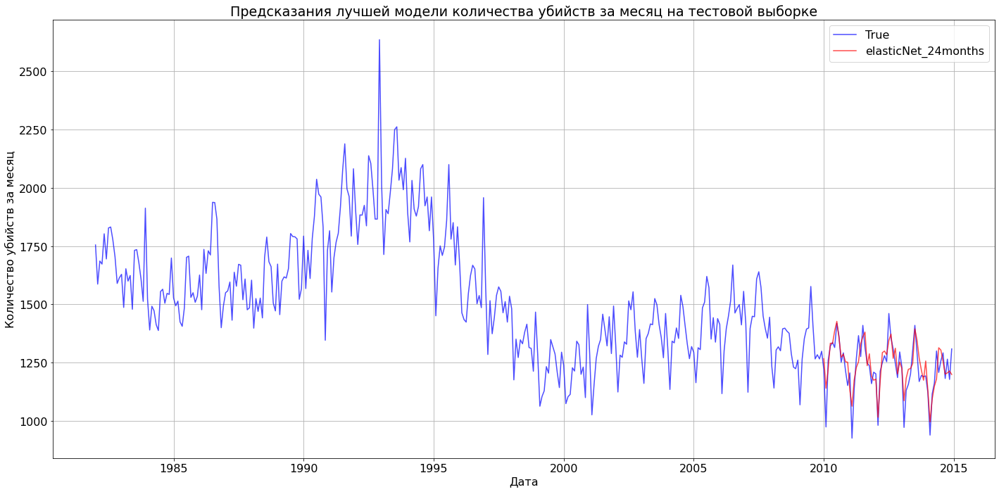

In [29]:
plt.rcParams.update({'font.size': 16})
plt.figure(figsize=(20,10)) 
plt.plot(time_series['Date'], time_series['NumCases'], color='b', alpha=0.7, label="True")
plt.plot(time_series['Date'][-60:], time_series['NumCases_predict'][-60:], color='r', alpha=0.7, label="elasticNet_24months")
plt.title('Предсказания лучшей модели количества убийств за месяц на тестовой выборке')
plt.xlabel('Дата')
plt.ylabel('Количество убийств за месяц')
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

**RMSE: 61.02582**
### Быстродействие

In [30]:
spans = []
for i in range(101):
    elasticNet_24months = sklearn.linear_model.ElasticNet(
        alpha=elasticNetCV_24months.alpha_, 
        l1_ratio=elasticNetCV_24months.l1_ratio_, 
        max_iter=elasticNetCV_24months.max_iter, 
        random_state=elasticNetCV_24months.random_state
    )
    start = time.time()
    elasticNet_24months.fit(X_train, Y_train)
    finish = time.time()
    spans.append(finish - start)

spans = np.asarray(spans[1:])
print('Mean fit time:', spans.mean(), 'Std:', spans.std(ddof=1))

Mean fit time: 0.001188375949859619 Std: 0.00019763823166522943


In [31]:
spans = []
for i in range(101):
    start = time.time()
    elasticNet_24months.predict(X_test)
    finish = time.time()
    spans.append(finish - start)

spans = np.asarray(spans[1:])
print('Mean predict time:', spans.mean(), 'Std:', spans.std(ddof=1))

Mean predict time: 6.43610954284668e-05 Std: 2.4222679457756554e-05


## 3 Результаты
 - Модель ElasticNet, предсказывающей количество убийств на следующий месяц по данным за предыдущий год: значение метрики RMSE на тестовой выборке: 74.30526, время обучения - 0.0009 секунды, время предсказания на тестовой выборе - 0.00009 секунды.
 - Модель ElasticNet, предсказывающей количество убийств на следующий месяц по данным за два предыдущих года: значение метрики RMSE на тестовой выборке: 61.02582, время обучения - 0.0016 секунды, время предсказания на тестовой выборе - 0.0001 секунды.


Hardware: 2 ядра процессора Intel Xeon E5-2699 v4 2.20 ГГц, 12ГБ оперативной памяти